# Sirirat L. IS (6420412008)

In [288]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from def_python import *
#from datetime import datetime
import seaborn as sns

from scipy.stats import shapiro 
from scipy.stats import zscore

## 1. Putaway, Transfer, Picking 

### Load & select data

In [ ]:
folder = 'Data/put_transfer_pick/'
df_Jun = import_csv(folder,'All_LT23_June')
df_July = import_csv(folder,'All_Lt23_July_2023')
df_Aug = import_csv(folder,'Lt23_31-08-2023')
df_Sep = import_csv(folder,'All_Lt23_Sep_2023')

df2 = pd.concat([df_Jun, df_July, df_Aug, df_Sep], axis=0, ignore_index = True)
put_trans_pick = df2.loc[:,['TO Number', 'Material', 'Source Stor.Ty.', 
'Source Storage Bin', 'Typ', 'Dest. Bin', 'Source targ.qty', 'AUn', 'Conf.t.', 'Conf.date', 'User', 'Source target qty']]

In [ ]:
print(df_Jun.shape[0])
print(df_July.shape[0])
print(df_Aug.shape[0])
print(df_Sep.shape[0])

### Drop NA

In [ ]:
print(put_trans_pick.shape)
put_trans_pick[put_trans_pick['Source Stor.Ty.'].isna()]

In [ ]:
# Drop NaN row
put_trans_pick.dropna(subset = ['Source Stor.Ty.', 'Typ'], inplace=True)

In [ ]:
put_trans_pick.shape

### Add Columns

In [ ]:
# Source
put_trans_pick['Source Storage Bin'] = put_trans_pick['Source Storage Bin'].astype(str)
put_trans_pick['S_Rack-Bay'] = put_trans_pick['Source Storage Bin'].apply(lambda x: custom_slice(x, 'rack-bay'))
put_trans_pick['S_Rack'] = put_trans_pick['Source Storage Bin'].apply(lambda x: custom_slice(x, 'rack'))
put_trans_pick['S_level'] = put_trans_pick['Source Storage Bin'].apply(lambda x: custom_slice(x, 'level'))

#Destination
put_trans_pick['Dest. Bin'] = put_trans_pick['Dest. Bin'].astype(str)
put_trans_pick['Dest_Rack-Bay'] = put_trans_pick['Dest. Bin'].apply(lambda x: custom_slice(x, 'rack-bay'))
put_trans_pick['Dest_Rack'] = put_trans_pick['Dest. Bin'].apply(lambda x: custom_slice(x, 'rack'))
put_trans_pick['Dest_level'] = put_trans_pick['Dest. Bin'].apply(lambda x: custom_slice(x, 'level'))

### Filter only focused area

#### Filter by focused Zones

In [ ]:
# Filter from 'Source Stor.Ty.' and 'Typ' columns

put_trans_pick = put_trans_pick[
    ((put_trans_pick['Source Stor.Ty.'].str.contains('MH8|MF8|IDP|SBN', case=False)) |
    (put_trans_pick['Typ'].str.contains('MH8|MF8|SBN', case=False)) |
    (put_trans_pick['Typ'].isin([911, 916, 921, 200 ]))) #& 
    #((put_trans_pick['S_Rack'].isin(['020', '021', '022'])) |
    #(put_trans_pick['Dest_Rack'].isin(['020', '021', '022'])))
]

#### Drop IDP to IDP

In [ ]:
# Check IDP to IDP 
IDP_to_IDP = put_trans_pick[(put_trans_pick['Source Stor.Ty.'] == 'IDP') & (put_trans_pick['Typ'] == 'IDP')]
print('Row# IDP_to_IDP:',IDP_to_IDP.shape[0])
print('S_Rack', IDP_to_IDP['S_Rack'].unique(), 
      '\nDest_Rack', IDP_to_IDP['Dest_Rack'].unique())
# Check IDP to IDP, Dest_Rack == 'B13
#isplay(IDP_to_IDP[IDP_to_IDP['Dest_Rack'] == 'B13'])

# Drop IDP to IDP rows
put_trans_pick = put_trans_pick.drop(put_trans_pick[(put_trans_pick['Source Stor.Ty.'] == 'IDP') & (put_trans_pick['Typ'] == 'IDP')].index, axis=0)
print('Row# put_trans_pick after dropped:',put_trans_pick.shape[0])

#### Filter 'S_Rack' and 'Dest_Rack' to have only focused area

In [ ]:
print('Unique S_Rack:',list(put_trans_pick['S_Rack'].unique()))
print('Unique Dest_Rack:',list(put_trans_pick['Dest_Rack'].unique()))

In [ ]:
put_trans_pick = put_trans_pick[put_trans_pick['S_Rack'].isin(['020', '021', '022']) | ~put_trans_pick['S_Rack'].str.match(r'^[A-Z0-9][0-9]{2}$') |
                      put_trans_pick['Dest_Rack'].isin(['020', '021', '022']) | ~put_trans_pick['Dest_Rack'].str.match(r'^[A-Z0-9][0-9]{2}$')
                    ]
# To drop source dummy bin to dest. that is not rack '020', '021', '022'
To_drop =  put_trans_pick[~put_trans_pick['S_Rack'].str.match(r'^[A-Z0-9][0-9]{2}$') &
                      ~put_trans_pick['Dest_Rack'].isin(['020', '021', '022'])
                      ]
put_trans_pick = put_trans_pick.drop(To_drop.index, axis=0)

# To drop source that is not rack '020', '021', '022' to dest. dummy bin 
To_drop2 =  put_trans_pick[~put_trans_pick['S_Rack'].isin(['020', '021', '022']) &
                      ~put_trans_pick['Dest_Rack'].str.match(r'^[A-Z0-9][0-9]{2}$')
                      ]
put_trans_pick = put_trans_pick.drop(To_drop2.index, axis=0)

print('shape of put_trans_pick:', put_trans_pick.shape)

In [ ]:
# Unique pairs of Source to Destination rack
put_trans_pick['S2Dest'] = put_trans_pick['S_Rack'].astype(str) + '_to_' + put_trans_pick['Dest_Rack'].astype(str)
S2Dest = sorted(list(put_trans_pick['S2Dest'].unique()))
#for i in S2Dest:
#    print(i)

### Add Columns

In [ ]:
# Add DateTime
put_trans_pick['Conf.t.'] = put_trans_pick['Conf.t.'].astype(str)
put_trans_pick['Conf.date'] = put_trans_pick['Conf.date'].astype(str)
put_trans_pick['Conf_Datetime'] = pd.to_datetime(put_trans_pick['Conf.date'] + ' ' + put_trans_pick['Conf.t.'], dayfirst=True)
# Add Month
put_trans_pick['Conf_Month'] = put_trans_pick['Conf_Datetime'].dt.month
# Date & Time Columns
put_trans_pick['Conf.date'] = put_trans_pick['Conf_Datetime'].dt.date
put_trans_pick['Conf.t.'] = put_trans_pick['Conf_Datetime'].dt.time

# Rearrange column
col = put_trans_pick.pop("Conf_Datetime")
put_trans_pick.insert(8, col.name, col)
col = put_trans_pick.pop("Conf_Month")
put_trans_pick.insert(9, col.name, col)

#put_trans_pick.info()
#put_trans_pick

In [ ]:
put_trans_pick[put_trans_pick['Typ'].isin(['921'])]

### Add Activity Column

In [ ]:
put_trans_pick['Typ'] = put_trans_pick['Typ'].astype(str)

con1 = put_trans_pick['Source Stor.Ty.'].str.startswith('M') & (put_trans_pick['Typ'].str.startswith('M') | put_trans_pick['Typ'].str.startswith('A'))
con2 = put_trans_pick['Source Stor.Ty.'].isin(['IDP', 'SBN'])
con3 = put_trans_pick['Typ'].isin(['200'])
con4 = put_trans_pick['Typ'].isin(['921'])

# Add new column Activity
put_trans_pick.loc[con1, 'Activity'] = 'Transfer'
put_trans_pick.loc[con4, 'Activity'] = 'Transfer'
put_trans_pick.loc[con2, 'Activity'] = 'Putaway'
put_trans_pick.loc[con3, 'Activity'] = 'Picking'

put_trans_pick

## 2. Replenishment
Note: MTy = 998

### Load data & clean

In [ ]:
folder = 'Data/replenishment/'
df_Jun = import_csv(folder,'All_R089_June_2023')
df_July = import_csv(folder,'All_R089_July_2023')
df_Aug = import_csv(folder,'R089_31-08-2023')
df_Sep = import_csv(folder,'All_R089_Sep_2023')

df3 = pd.concat([df_Jun, df_July, df_Aug, df_Sep], axis=0, ignore_index = True)

In [ ]:
print(df_Jun.shape[0])
print(df_July.shape[0])
print(df_Aug.shape[0])
print(df_Sep.shape[0])

In [ ]:
# Drop unused col.
#df3.loc[df3["Comp."] != "X"]
replenish = df3.drop(['WhN', 'MTy', 'Mat.Group', 'Material Description', 'Batch', '  Actual Qty', 'Comp.'], axis=1)

# Get Datetime col.
replenish['Created On'] = replenish['Created On'].astype(str)
replenish['Time'] = replenish['Time'].astype(str)
replenish['Comp.time'] = replenish['Comp.time'].astype(str)
replenish['Comp.Date'] = replenish['Comp.Date'].astype(str)

replenish['Created_Datetime'] = pd.to_datetime(replenish['Created On'] + ' ' + replenish['Time'], dayfirst=True)
replenish['Comp._Datetime'] = pd.to_datetime(replenish['Comp.Date'] + ' ' + replenish['Comp.time'], dayfirst=True)

# Rearrange column 
col = replenish.pop("Created_Datetime")
replenish.insert(1, col.name, col)

# Drop col.
replenish = replenish.drop(['Created On', 'Time'], axis=1)
#replenish = replenish.drop(['Comp.Date', 'Comp.time'], axis=1)

### Add Columns

In [ ]:
focus_replenish = replenish.loc[:,['TO Number.', 'S.Type', 'Source BIN', 'Dest.Type', 'Dest.BIN', 'Comp.by', 'Comp._Datetime', 'Comp.time',	'Comp.Date']].copy()

# Add Month column
focus_replenish['Comp_Month'] = focus_replenish['Comp._Datetime'].dt.month
focus_replenish['Comp.Date'] = focus_replenish['Comp._Datetime'].dt.date

# Add S_Rack & Dest_Rack
focus_replenish['Source BIN'] = focus_replenish['Source BIN'].astype(str)
focus_replenish['S_Rack-Bay'] = focus_replenish['Source BIN'].apply(lambda x: custom_slice(x, 'rack-bay'))
focus_replenish['S_Rack'] = focus_replenish['Source BIN'].apply(lambda x: custom_slice(x, 'rack'))
focus_replenish['S_level'] = focus_replenish['Source BIN'].apply(lambda x: custom_slice(x, 'level'))

focus_replenish['Dest.BIN'] = focus_replenish['Dest.BIN'].astype(str)
focus_replenish['Dest_Rack-Bay'] = focus_replenish['Dest.BIN'].apply(lambda x: custom_slice(x, 'rack-bay'))
focus_replenish['Dest_Rack'] = focus_replenish['Dest.BIN'].apply(lambda x: custom_slice(x, 'rack'))
focus_replenish['Dest_level'] = focus_replenish['Dest.BIN'].apply(lambda x: custom_slice(x, 'level'))

# Add Activity column
focus_replenish['Activity'] = 'Replenishment'

# Add S_level and Dest_level column
focus_replenish['S_level'] = focus_replenish['Source BIN'].apply(lambda x: x[-2:] if '-' in x else '01')
focus_replenish['Dest_level'] = focus_replenish['Dest.BIN'].apply(lambda x: x[-2:] if '-' in x else '01')

# Add S2Dest column
focus_replenish['S2Dest'] = focus_replenish['S_Rack'].astype(str) + '_to_' + focus_replenish['Dest_Rack'].astype(str)

### Drop Nan

In [ ]:
# Find out why have NaN in S.Type & Dest.Type column
print('The rows that will be droped.')
display(focus_replenish[(focus_replenish['S.Type'].isna()) | (focus_replenish['Dest.Type'].isna())])
# Drop NaN row
focus_replenish.dropna(subset = ['S.Type', 'Dest.Type'], inplace=True)

### Select rows of focused area

In [ ]:
#Focus on Zone MH8 or MF8 Type and only rack 20 - 22

focus_replenish = focus_replenish[
    ((focus_replenish['S.Type'].str.contains('MH8|MF8', case=False)) |
    (focus_replenish['Dest.Type'].str.contains('MH8|MF8', case=False))) & 
    ((focus_replenish['S_Rack'].isin(['020', '021', '022'])) |
    (focus_replenish['Dest_Rack'].isin(['020', '021', '022'])))
]

focus_replenish

## 3. Concat Putaway, Transfer, Picking & Replenishment

### Concatenate dataframe

In [ ]:
put_trans_pick_concat = put_trans_pick.iloc[:,[0,2,3,4,5,8,9,10,11,12,14,15,16,17,18,19,20,21]]

focus_replenishconcat = focus_replenish.loc[:,['TO Number.','S.Type','Source BIN','Dest.Type','Dest.BIN',
                                               'Comp._Datetime','Comp_Month','Comp.time','Comp.Date',
                                               'Comp.by', 'S_Rack-Bay', 'S_Rack', 'S_level', 'Dest_Rack-Bay',
                                               'Dest_Rack', 'Dest_level', 'S2Dest', 'Activity'
                                               ]]
#print('put_trans_pick_concat columns:',put_trans_pick_concat.columns)
#print('focus_replenishconcat columns:',focus_replenishconcat.columns)
put_trans_pick_concat.columns = focus_replenishconcat.columns
concat_df = pd.concat([put_trans_pick_concat, focus_replenishconcat], ignore_index=True)
concat_df['Comp.Date'] = pd.to_datetime(concat_df['Comp.Date'], dayfirst=False)

print('shape of put_trans_pick_concat:',put_trans_pick_concat.shape)
print('shape of focus_replenishconcat:',focus_replenishconcat.shape)
print('shape of concat_df:',concat_df.shape)

### Save to CSV

In [ ]:
concat_df.to_csv('Data/concat_df.csv',index=False)

## 4. Transaction log

### Import data

In [289]:
# Transaction file
folder = 'Data/transaction/'
#df = import_csv(folder,'transaction_Aug23')
df = import_csv(folder,'transaction_Sep23')
#display(df)
df.info()

# concat_df file
folder = 'Data/'
concat_df = import_csv(folder,'concat_df')

# Only Since 08 Sep 23
concat_sep = concat_df[concat_df['Comp._Datetime'] >= '2023-09-08']

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1400000 entries, 0 to 1399999
Data columns (total 17 columns):
 #   Column                Non-Null Count    Dtype  
---  ------                --------------    -----  
 0   Date                  1400000 non-null  object 
 1   Time                  1400000 non-null  object 
 2   Transaction Code      1400000 non-null  object 
 3   User Name             1400000 non-null  object 
 4   Log Event             1400000 non-null  object 
 5   Trace\Log Text        1400000 non-null  object 
 6   Document Reference 1  18902 non-null    float64
 7   Document Reference 2  0 non-null        float64
 8   Document Reference 3  0 non-null        float64
 9   Document Reference 4  0 non-null        float64
 10  Trace level           1400000 non-null  int64  
 11  CALL program          1400000 non-null  object 
 12  Main Program          1399997 non-null  object 
 13  Include               1399997 non-null  object 
 14  Line                  1400000 non-

### *** The report data 'TO Number.' has duplicates !!!

In [290]:
# *** the report data TO Number. has duplicates !!!
concat_sep[concat_sep['TO Number.'].duplicated()]

,TO Number.,S.Type,Source BIN,Dest.Type,Dest.BIN,Comp._Datetime,Comp_Month,Comp.time,Comp.Date,Comp.by,S_Rack-Bay,S_Rack,S_level,Dest_Rack-Bay,Dest_Rack,Dest_level,S2Dest,Activity
5338,74711266.0,MH8,020-212-04,921,TRANSFER,2023-09-26 19:54:08,9,19:54:08,2023-09-26,WIRAYUTC,020-212,020,04,dummy,dummy,dummy,020_to_dummy,Transfer
5339,74711266.0,MH8,020-221-05,921,TRANSFER,2023-09-26 19:55:44,9,19:55:44,2023-09-26,WIRAYUTC,020-221,020,05,dummy,dummy,dummy,020_to_dummy,Transfer
5340,74711266.0,MH8,020-032-04,921,TRANSFER,2023-09-26 19:46:48,9,19:46:48,2023-09-26,WIRAYUTC,020-032,020,04,dummy,dummy,dummy,020_to_dummy,Transfer
5341,74711266.0,MH8,020-041-05,921,TRANSFER,2023-09-26 19:48:05,9,19:48:05,2023-09-26,WIRAYUTC,020-041,020,05,dummy,dummy,dummy,020_to_dummy,Transfer
5342,74711266.0,MH8,020-202-07,921,TRANSFER,2023-09-26 19:51:39,9,19:51:39,2023-09-26,WIRAYUTC,020-202,020,07,dummy,dummy,dummy,020_to_dummy,Transfer
5343,74711266.0,MH8,020-301-04,921,TRANSFER,2023-09-26 19:58:34,9,19:58:34,2023-09-26,WIRAYUTC,020-301,020,04,dummy,dummy,dummy,020_to_dummy,Transfer


### Add DateTime

In [291]:
# Add DateTime
df['Date'] = df['Date'].astype(str)
df['Time'] = df['Time'].astype(str)
df['Datetime'] = pd.to_datetime(df['Date'] + ' ' + df['Time'], dayfirst=False)

### Filter only Users in focused area

In [292]:
# User in focused area
user_unique = list(concat_sep['Comp.by'].unique())
user_unique.sort()
print(user_unique)
print(len(user_unique))
# Filter only User in focused area
df = df[df['User Name'].isin(user_unique)]

['ANUPHONS', 'ATHIWATM', 'BEELADENM', 'KHOMSANY', 'KITTIPHONGM', 'KITTIPONGKU', 'KRITSANAP', 'MANOTM', 'NARAWITP', 'NATTAPONC', 'NATTAYAR', 'NATTPONT', 'PANYAWUTS', 'PAYUTP', 'PHARADONS', 'POTHONGS', 'RATTAPOLP', 'SATHITP', 'SAWANYAP', 'SIRIRATM', 'SOMBOONL', 'SUCHAKRIT', 'SUKSANG', 'SUPATTAH', 'THANURAKB', 'THAWATCHAII', 'THIRAWITS', 'TOSSAPHONK', 'WINAIU', 'WIPHAPHONS', 'WIRATS', 'WIRAYUTC', 'WUTICHAIM', 'WUTICHAIS']
34


### Drop unused columns

In [293]:
df = df.drop('Document Reference 3',axis=1)

### Save as CSV file for each User

In [294]:
## To be easier to see pattern
#save_user_log(df,user_unique)

### Try to get the timestamp for each TO_Number of each user

In [295]:
def get_timestamp_in_concatdf(df,user_unique,concat_sep):
    concat_user_dic = {}
    for i, user in enumerate(user_unique):
        #user = 'NATTAYAR'
        #user = 'ATHIWATM'
        User_log = user_log(df,user)
        User_log = User_log.loc[:,['Date', 'Time', 'User Name', 'Log Event', 'Trace\Log Text', 'Document Reference 1', 'Document Reference 2', 'Document Reference 4', 'Datetime']]

        #select picking rows in log
        pattern_pick_start = r'processing transfer order \d+ on screen(?: 0200 - pick by t.o)?' 
        #The above to detect for both r'processing transfer order \d+ on screen 0200 - pick by t.o', and r'processing transfer order \d+ on screen'

        pattern_put_start = r'processing storage unit number\(sun\) \d+ on screen \d+ - put away'
        pattern_put_stop = r'put away transfer order \d+ has been fully completed.'

        pattern_reple_start = r'processing transfer order \(to\)? \d+ on screen'
        pattern_reple_stop = r'the replenishment to \d+ was confirmed.'
        pattern_reple_start2 = r'processing sbin \d+-\d+-\d+ on screen \d+ - replen-source'
        pattern_reple_stop2 = r'processing dbin \d+-\d+-\d+ on screen \d+ - replen-destination'

        # ***In log file do not have "all" transfer activity records (company told that some records of transfer job are in other systems)
        #pattern_transfer_start = r'processing transfer order \d+ on screen(?: 0200 - pick by t.o)?' #same as pattern_pick_start
        pattern_transfer_stop = r'transfer order \d+ completed'

        stop_keyword = 'closed'

        focus_user_log = User_log[User_log['Trace\Log Text'].str.contains(pattern_pick_start, regex=True) |         #pattern_pick_start, pattern_transfer_start
                                    User_log['Trace\Log Text'].str.contains(pattern_put_start, regex=True) |        #pattern_put_start                         
                                    User_log['Trace\Log Text'].str.contains(pattern_reple_start, regex=True) |      #pattern_reple_start
                                    User_log['Trace\Log Text'].str.contains(pattern_reple_start2, regex=True) |     #pattern_reple_start2
                                    #User_log['Trace\Log Text'].str.contains(pattern_transfer_start, regex=True) |
                                    User_log['Trace\Log Text'].str.contains(pattern_put_stop, regex=True) |         #pattern_put_stop
                                    User_log['Trace\Log Text'].str.contains(pattern_reple_stop, regex=True) |       #pattern_reple_stop
                                    User_log['Trace\Log Text'].str.contains(pattern_reple_stop2, regex=True) |       #pattern_reple_stop2
                                    User_log['Trace\Log Text'].str.contains(pattern_transfer_stop, regex=True) |    #pattern_transfer_stop
                                    User_log['Trace\Log Text'].str.contains(stop_keyword)                           #pattern_pick_stop
                                    ].sort_values('Datetime').reset_index(drop=True)

        con1_start = focus_user_log['Trace\Log Text'].str.contains(pattern_pick_start, regex=True)      #pattern_pick_start, pattern_transfer_start
        con2_start = focus_user_log['Trace\Log Text'].str.contains(pattern_put_start, regex=True)       #pattern_put_start
        con3_start = focus_user_log['Trace\Log Text'].str.contains(pattern_reple_start, regex=True)     #pattern_reple_start
        con4_start = focus_user_log['Trace\Log Text'].str.contains(pattern_reple_start2, regex=True)    #pattern_reple_start2
        con1_stop = focus_user_log['Trace\Log Text'].str.contains(stop_keyword)                         #pattern_pick_stop
        con2_stop = focus_user_log['Trace\Log Text'].str.contains(pattern_put_stop, regex=True)         #pattern_put_stop
        con3_stop = focus_user_log['Trace\Log Text'].str.contains(pattern_reple_stop, regex=True)       #pattern_reple_stop
        con4_stop = focus_user_log['Trace\Log Text'].str.contains(pattern_transfer_stop, regex=True)    #pattern_transfer_stop
        con5_stop = focus_user_log['Trace\Log Text'].str.contains(pattern_reple_stop2, regex=True)       #pattern_reple_stop2

        # Add status of work column
        focus_user_log.loc[con1_start | con2_start | con3_start | con4_start, 'status'] = 0                  #'open'
        focus_user_log.loc[con1_stop | con2_stop | con3_stop | con4_stop | con5_stop, 'status'] = 1          #'closed'
        #display(focus_user_log[focus_user_log['status'].isna()])

        pattern_get_TO_pick = r'processing transfer order (\d+)(?: on screen \d+)?'
        # The above to detect for both r'processing transfer order (\d+) on screen 0200 - pick by t.o', and r'processing transfer order (\d+) on screen'
        pattern_get_TO_put = r'put away transfer order (\d+) has been fully completed.'
        pattern_get_TO_reple = r'processing transfer order \(to\)? (\d+) on screen'
        pattern_get_TO_transfer = r'transfer order (\d+) completed'

        # ***This below pattern no data of TO number show to refer so need to bin and get date to refer to that specific TO number
        pattern_get_bin_reple2_start = r'processing sbin (\d+-\d+-\d+) on screen \d+ - replen-source'
        pattern_get_bin_reple2_stop = r'processing dbin (\d+-\d+-\d+) on screen \d+ - replen-destination'

        # Create the 'TO log' column based on conditions
        focus_user_log['TO_log'] = focus_user_log['Trace\Log Text'].str.extract(pattern_get_TO_pick, expand=False)                     #Get_pick_start, Get_transfer_start
        condition_1 = (con2_stop) & (focus_user_log['TO_log'].isna())                                                                  #Get_put_stop
        condition_2 = (con3_start) & (focus_user_log['TO_log'].isna())                                                                 #Get_reple_start
        condition_3 = (con4_stop) & (focus_user_log['TO_log'].isna())                                                                  #Get_transfer_stop
        condition_4 = (con1_stop) & (focus_user_log['TO_log'].isna())                                                                  #Get_pick_stop & reple_stop
        condition_5 = (con4_start) & (focus_user_log['TO_log'].isna())                                                                 #Get_bin_reple2_start
        condition_6 = (con5_stop) & (focus_user_log['TO_log'].isna())                                                                  #Get_bin_reple2_stop

        focus_user_log.loc[condition_1, 'TO_log'] = focus_user_log['Trace\Log Text'].str.extract(pattern_get_TO_put, expand=False)
        focus_user_log.loc[condition_2, 'TO_log'] = focus_user_log['Trace\Log Text'].str.extract(pattern_get_TO_reple, expand=False)
        focus_user_log.loc[condition_3, 'TO_log'] = focus_user_log['Trace\Log Text'].str.extract(pattern_get_TO_transfer, expand=False)
        focus_user_log.loc[condition_4, 'TO_log'] = focus_user_log['Document Reference 1']
    
        #Get_bin_reple2_start & stop
        focus_user_log.loc[condition_5, 'TO_log'] = focus_user_log['Trace\Log Text'].str.extract(pattern_get_bin_reple2_start, expand=False)
        focus_user_log.loc[condition_6, 'TO_log'] = focus_user_log['Trace\Log Text'].str.extract(pattern_get_bin_reple2_stop, expand=False)

        # Get the only rows that have the 'open to close' status sequence
        #focus_user_log.to_csv('before01.csv')
        focus_user_log = Only0_To_1Sequence(focus_user_log)
        focus_user_log['Document Reference 1'] = focus_user_log['Document Reference 1'].astype(float)
        focus_user_log = (focus_user_log.sort_values('Datetime')).reset_index(drop=True)

        #Get_put_start TO_log
        current_value = None
        for i in range(len(focus_user_log) - 1):
            if pd.isna(focus_user_log.at[i, 'TO_log']):
                current_value = focus_user_log.at[i, 'Document Reference 1']
                next_value = focus_user_log.at[i + 1, 'Document Reference 1']
                if current_value == next_value:
                    focus_user_log.at[i, 'TO_log'] = focus_user_log.at[i + 1, 'TO_log']

        #Get_reple2_start & stop TO_log
        # Initialize the 'start2stop' column with None values
        focus_user_log['start2stop'] = None
        # Iterate through the DataFrame to calculate 'start2stop'
        for i in range(len(focus_user_log) - 1):
            to_log_value = focus_user_log.at[i, 'TO_log']
            if isinstance(to_log_value, str) and '-' in to_log_value and focus_user_log.at[i, 'status'] == 1:
                #include Date value because found duplicate if only use source and destination info. to refer
                #cannot use Datetime value because the timestamp some are different in seconds
                focus_user_log.at[i, 'start2stop'] = focus_user_log.at[i-1, 'TO_log'] + to_log_value + str(focus_user_log.at[i, 'Date'])
        #display(focus_user_log[~focus_user_log['start2stop'].isna()])

        concat_user_sep = concat_sep[concat_sep['Comp.by'] == user].copy()
        concat_user_sep['start2stop'] = concat_user_sep['Source BIN'] + concat_user_sep['Dest.BIN'] + concat_user_sep['Comp.Date']
        check_dup1 = concat_user_sep[concat_user_sep['start2stop'].duplicated()]
        print(f'1st_The concat_user_sep of User:{user} does not contain duplicate in "start2stop" column:', 
              check_dup1.shape[0]==0)
        if check_dup1.shape[0]!=0: #have duplication
            # Change to use Datetime (exclude seconds) instead of date
            for i in range(len(focus_user_log) - 1):
                to_log_value = focus_user_log.at[i, 'TO_log']
                if isinstance(to_log_value, str) and '-' in to_log_value and focus_user_log.at[i, 'status'] == 1:
                    #include Datetime value because found duplicate if only use source and destination info. to refer
                    focus_user_log.at[i, 'start2stop'] = focus_user_log.at[i-1, 'TO_log'] + to_log_value + str(focus_user_log.at[i, 'Datetime'])
            focus_user_log['start2stop'] = focus_user_log['start2stop'].str[:-3]

            concat_user_sep = concat_sep[concat_sep['Comp.by'] == user].copy()
            concat_user_sep['start2stop'] = concat_user_sep['Source BIN'] + concat_user_sep['Dest.BIN'] + concat_user_sep['Comp._Datetime']
            concat_user_sep['start2stop'] = concat_user_sep['start2stop'].str[:-3]
            check_dup2 = concat_user_sep[concat_user_sep['start2stop'].duplicated()]
            print(f'2nd_The concat_user_sep of User:{user} does not contain duplicate in "start2stop" column:', 
                  check_dup2.shape[0]==0)
            # check again
            if check_dup2.shape[0]!=0: #have duplication at 2nd attempt
                dup_val = concat_user_sep[concat_user_sep['start2stop'].duplicated()]['start2stop'].values
                print('dup_val: ',dup_val)
                for i in dup_val:
                    display(concat_user_sep[concat_user_sep['start2stop'] == i])


        # If start2stop value of both dataframe matchs then set the value focus_user_log['TO_log'] according to value in concat_user_sep
        to_drop = []
        for index, row in focus_user_log.iterrows():
            to_log_value = row['TO_log']
            if isinstance(to_log_value, str):
                start2stop_value = row['start2stop']
                matching_row = concat_user_sep[concat_user_sep['start2stop'] == start2stop_value]
                if not matching_row.empty:
                    focus_user_log.at[index, 'TO_log'] = matching_row['TO Number.'].values[0]
                    focus_user_log.at[index, 'start2stop'] = matching_row['start2stop'].values[0][:10]
                else:
                    if row['status'] == 1 and ('-' in to_log_value):
                        to_drop.append(index)

        # Drop the rows that are not in the focused area 
        focus_user_log = focus_user_log.drop(to_drop)

        # Update TO_log status 0 that still be bin value to be TO_log value of status 1 (the next row)
        prev_TO_log = None
        for index, row in focus_user_log.iterrows():
            if not pd.isna(row['start2stop']):
                if row['start2stop'] == prev_TO_log:
                    focus_user_log.at[index - 1, 'TO_log'] = row['TO_log']
            prev_TO_log = row['TO_log']

        # Drop column 'start2stop'
        focus_user_log = focus_user_log.drop('start2stop',axis=1)   
        # Drop the rows that are not in the focused area
        focus_user_log = Only0_To_1Sequence(focus_user_log)

        print('Is no Nan in "To_log"?:', focus_user_log[focus_user_log['TO_log'].isna()].shape[0] == 0)

        # Add login time of each day rows to dataframe
        #first_loginTime = first_TimeOfDay(User_log) # cannot use this need revise for the shift that in both days e.g. from 22.00 to 7.00 am
        #focus_user_log = pd.concat([focus_user_log, first_loginTime], ignore_index=True).sort_values('Datetime')
        # *** first log in time of the day cannot use because some user login early but no work assign yet, so use the time when job opened

        try:
            focus_user_log['status'] = focus_user_log['status'].astype(int)
        except Exception as e:
            print('error', e)

        try:
            #focus_user_log['TO_log'] = focus_user_log['TO_log'].fillna(0)
            focus_user_log['TO_log'] = focus_user_log['TO_log'].astype(int)
        except Exception as e:
            print('error', e)

        if len(focus_user_log) != 0: #if can find the pattern in log file
            try:
                # Get create and completed time of each TO
                log_TO_time = focus_user_log.pivot(
                    index='TO_log',
                    columns='status',
                    values='Datetime',
                    )
            except: 
                # drop duplicates only got the first occurrance
                focus_user_log = focus_user_log.drop_duplicates(subset=['status', 'TO_log'])
                # Get create and completed time of each TO
                log_TO_time = focus_user_log.pivot(
                    index='TO_log',
                    columns='status',
                    values='Datetime',
                    )
            # Reset the index to flatten the multi-index columns and remove the index name
            log_TO_time = log_TO_time.reset_index()
            # Rename the columns
            log_TO_time.columns = ['TO_log','Create_timestamp', 'Comp_timestamp']

        ###############################################
        # To detect putaway job that do not have complete indication in log file
        pattern_put_start2 = r'put away transfer order \d+ created'
        focus_user_log2 = User_log[User_log['Trace\Log Text'].str.contains(pattern_put_start2, regex=True)        #pattern_put_start2
                                   ].sort_values('Datetime').reset_index(drop=True)

        con_start_2 = focus_user_log2['Trace\Log Text'].str.contains(pattern_put_start2, regex=True)              #pattern_put_start2
        # Add status of work column
        focus_user_log2.loc[con_start_2, 'status'] = 0  #'open'

        pattern_get_TO_put2 = r'put away transfer order (\d+) created'
        # Create the 'TO log' column based on conditions
        focus_user_log2['TO_log'] = focus_user_log2['Trace\Log Text'].str.extract(pattern_get_TO_put2, expand=False)  #pattern_get_TO_put2

        # Select only the row in 'focus_user_log2' that have the TO_log in 'concat_sep' of particular user
        unique_to_num = concat_sep[concat_sep['Comp.by'] == user]['TO Number.'].unique()
        focus_user_log2['TO_log'] = focus_user_log2['TO_log'].astype(float)
        focus_user_log2 = focus_user_log2[focus_user_log2['TO_log'].isin(unique_to_num)]

        if len(focus_user_log2) != 0:
            # Get create and completed time of each TO
            log_TO_time2 = focus_user_log2.pivot(
                index='TO_log',
                columns='status',
                values='Datetime',
                )
            log_TO_time2[1] = np.nan
            # Reset the index to flatten the multi-index columns and remove the index name
            log_TO_time2 = log_TO_time2.reset_index()
            # Rename the columns
            log_TO_time2.columns = ['TO_log','Create_timestamp', 'Comp_timestamp']

            #concat 'log_TO_time2' to 'log_TO_time'
            # Identify the TO_log values in log_TO_time2 that do not exist in log_TO_time
            to_concat = log_TO_time2[~log_TO_time2['TO_log'].isin(log_TO_time['TO_log'])]
            # Concatenate the identified rows to log_TO_time
            to_concat = to_concat.dropna(axis=1, how='all')
            log_TO_time = pd.concat([log_TO_time, to_concat], ignore_index=True)

        ###############################################
        # This code block is adjusted the data manually (cannot code systematically to find).
        if user == 'BEELADENM':
            new_row = pd.DataFrame({'TO_log': [74566828], 
                                    'Create_timestamp': ['13/9/2023 3:42:11'], 
                                    'Comp_timestamp': ['2023-09-13 03:43:50']}
                                    ) #'Comp_timestamp' is from concat_user_sep data
            log_TO_time = pd.concat([log_TO_time, new_row], ignore_index=True)

        ###############################################

        # Convert 'Comp_timestamp' and 'Create_timestamp' columns to datetime
        log_TO_time['Comp_timestamp'] = pd.to_datetime(log_TO_time['Comp_timestamp'])
        log_TO_time['Create_timestamp'] = pd.to_datetime(log_TO_time['Create_timestamp'])
        # Get time diff col
        log_TO_time['time_diff'] = log_TO_time['Comp_timestamp'] - log_TO_time['Create_timestamp']

        #display(focus_user_log)
        #display(log_TO_time)

        concat_user_sep = concat_sep[concat_sep['Comp.by'] == user].merge(log_TO_time, left_on='TO Number.', right_on='TO_log', how='left')
        concat_user_sep = concat_user_sep.drop(columns='TO_log')

        ###############################################

        #******Use Comp._Datetime in concat_user_sep for cal time diff
        concat_user_sep['Comp_timestamp'] = concat_user_sep.apply(
            lambda row: row['Comp._Datetime'] 
            if pd.isna(row['Comp_timestamp']) and 
            not pd.isna(row['Create_timestamp']) else row['Comp_timestamp'],
            axis=1
            )

        # Ensure 'Comp_timestamp' and 'Create_timestamp' are in datetime format
        concat_user_sep['Comp_timestamp'] = pd.to_datetime(concat_user_sep['Comp_timestamp'])
        concat_user_sep['Create_timestamp'] = pd.to_datetime(concat_user_sep['Create_timestamp'])

        concat_user_sep['time_diff'] = concat_user_sep['Comp_timestamp'] - concat_user_sep['Create_timestamp']

        ###############################################

        concat_user_dic[user] = concat_user_sep

    return concat_user_dic


In [296]:
#get_timestamp_in_concatdf & get time diff
concat_user_dic = get_timestamp_in_concatdf(df,user_unique,concat_sep)

1st_The concat_user_sep of User:ANUPHONS does not contain duplicate in "start2stop" column: True
Is no Nan in "To_log"?: True
1st_The concat_user_sep of User:ATHIWATM does not contain duplicate in "start2stop" column: True
Is no Nan in "To_log"?: True
1st_The concat_user_sep of User:BEELADENM does not contain duplicate in "start2stop" column: False
2nd_The concat_user_sep of User:BEELADENM does not contain duplicate in "start2stop" column: True
Is no Nan in "To_log"?: True
1st_The concat_user_sep of User:KHOMSANY does not contain duplicate in "start2stop" column: False
2nd_The concat_user_sep of User:KHOMSANY does not contain duplicate in "start2stop" column: True
Is no Nan in "To_log"?: True
1st_The concat_user_sep of User:KITTIPHONGM does not contain duplicate in "start2stop" column: False
2nd_The concat_user_sep of User:KITTIPHONGM does not contain duplicate in "start2stop" column: True
Is no Nan in "To_log"?: True
1st_The concat_user_sep of User:KITTIPONGKU does not contain duplica

### Concat all user df into All_df

In [297]:
dfs = []
# Concatenate all DataFrames in the dictionary
for df_name, dtf in concat_user_dic.items():
    dfs.append(dtf)
# Concatenate all DataFrames in the list
All_df = pd.concat(dfs, ignore_index=True)

# Set Nan value to 0
All_df['time_diff'] = All_df['time_diff'].fillna(pd.Timedelta(0))
# Set type to numeric to be able to pivot
All_df['time_diff'] = pd.to_numeric(All_df['time_diff'], errors='coerce')
# Turn to seconds
All_df['time_diff'] = All_df['time_diff']/10**9

In [298]:
#All_df.to_csv('All_df.csv')

#### Pivot All_df

In [299]:
pivot_table = All_df.pivot_table(index=['Comp.by', 'Comp.Date'], values=['time_diff', 'TO Number.'], aggfunc={'time_diff': 'sum', 'TO Number.': 'count'}, fill_value=0)
pivot_table = pivot_table.reset_index()
pivot_table

,Comp.by,Comp.Date,TO Number.,time_diff
0,ANUPHONS,2023-09-08,8,0.0
1,ANUPHONS,2023-09-09,1,0.0
2,ANUPHONS,2023-09-11,2,81.0
3,ANUPHONS,2023-09-14,1,30.0
4,ANUPHONS,2023-09-18,19,561.0
...,...,...,...,...
324,WUTICHAIS,2023-09-12,22,46.0
325,WUTICHAIS,2023-09-15,25,0.0
326,WUTICHAIS,2023-09-21,21,99.0
327,WUTICHAIS,2023-09-26,3,8.0


In [300]:
# ***drop all rows that cannot detect timestamp from log file in 'pivot_table'
pivot_table = pivot_table[pivot_table['time_diff'] != 0]
pivot_table

,Comp.by,Comp.Date,TO Number.,time_diff
2,ANUPHONS,2023-09-11,2,81.0
3,ANUPHONS,2023-09-14,1,30.0
4,ANUPHONS,2023-09-18,19,561.0
5,ANUPHONS,2023-09-19,12,347.0
6,ANUPHONS,2023-09-26,1,6.0
...,...,...,...,...
321,WUTICHAIM,2023-09-28,1,113.0
322,WUTICHAIM,2023-09-29,3,1092.0
324,WUTICHAIS,2023-09-12,22,46.0
326,WUTICHAIS,2023-09-21,21,99.0


In [301]:
#pivot_table.to_csv('pivot_table.csv')

### ***drop all rows that cannot detect timestamp from log file

In [302]:
# for check only
#for i in concat_user_dic:
#    nan = concat_user_dic[i][concat_user_dic[i]['time_diff'].isna()]
#    display(nan[~nan['Create_timestamp'].isna() | ~nan['Comp_timestamp'].isna()])

In [303]:
total_row = 0
drop_row = 0
for i in concat_user_dic:
    row = concat_user_dic[i].shape[0]
    concat_user_dic[i].dropna(subset=['time_diff'], inplace=True)
    total_row += row
    drop_row += row-concat_user_dic[i].shape[0]
print(f'Total row before drop: {total_row}\nTotal dropped rows: {drop_row}')

Total row before drop: 1832
Total dropped rows: 486


### 1st approach try to 
- Get node journey of each day (node list) 
    - ***by "not" consider the time gap between each subsesquence work
    - ***by "not" separate work activity
- Graph & weight cal & visualize

Note
1. if bin is the dummy bin, it will be set to be node I/O.
2. if bin is the source/destination bin that is not in the focused area, it will be set to be node I/O.
3. the calculated weight (distance) only consider 2D, the different level is not included in the calculation yet.
4. time_diff = 0 means that no data to obtain from log file > ***drop all rows that cannot detect timestamp from log file


#### Graph pattern 1

In [304]:
def sum_df1(concat_user_dic,graph):
    all_weight_df = None
    for user in concat_user_dic:
        user_df = concat_user_dic[user].copy()
        user_df = user_df.sort_values('Comp._Datetime')

        condition1 = (user_df['S_Rack-Bay'] == 'dummy') | (~user_df['S_Rack'].isin(['020', '022', '021']))
        condition2 = (user_df['Dest_Rack-Bay'] == 'dummy') | (~user_df['Dest_Rack'].isin(['020', '022', '021']))

        user_df.loc[condition1,'S_Rack-Bay'] = 'I_O'
        user_df.loc[~condition1,'S_Rack-Bay'] = user_df['S_Rack-Bay'] + '-01'
        user_df.loc[condition2,'Dest_Rack-Bay'] = 'I_O'
        user_df.loc[~condition2,'Dest_Rack-Bay'] = user_df['Dest_Rack-Bay'] + '-01'
        #display(user_df)

        unique_Comp_Date = user_df['Comp.Date'].unique()
        node_dic = {}
        for j in unique_Comp_Date:
            same_date = user_df[user_df['Comp.Date'] == j].sort_values('Comp._Datetime')
            same_date = same_date.loc[:,['S_Rack-Bay','Dest_Rack-Bay']]
            node_lst = [value for pair in zip(same_date['S_Rack-Bay'], same_date['Dest_Rack-Bay']) for value in pair]
            if node_lst[0] != 'I_O':
                node_lst.insert(0, 'I_O')
            #display(same_date)
            #print(node_lst)
            node_dic[j] = node_lst
        weight_dic = {}
        for date in node_dic:
            total_weight, path_sequence = get_shortest_path (graph,sequence_of_nodes=node_dic[date], same_I_O = True)
            weight_dic[date] = total_weight
            #visualize_travel(graph, pos, node_labels, node_colors, total_weight, path_sequence, graph_pattern=1)
        print(weight_dic)
        weight_df = pd.DataFrame(list(weight_dic.items()), columns=['Comp.Date', 'Distance(m)'])
        weight_df['Comp.by'] = user
        if all_weight_df is None:
            all_weight_df = weight_df.copy()
        else:
            all_weight_df = pd.concat([all_weight_df, weight_df], ignore_index=True)
    display(all_weight_df)
    return(all_weight_df)

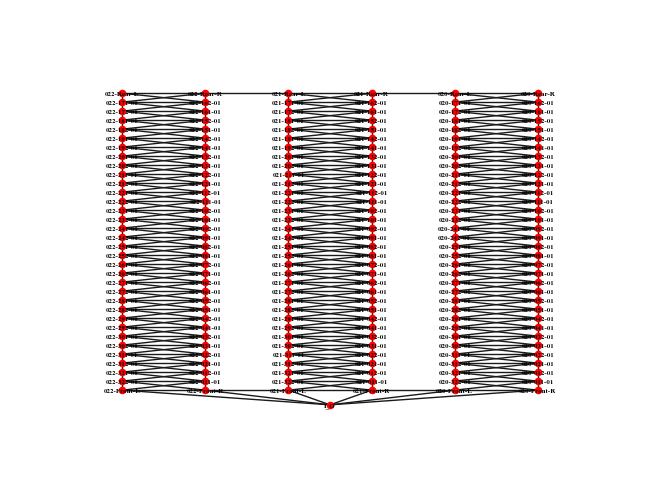

Total Weight: 102.17979137600003
[['I_O', '022-Front-R', '022-011-01', '022-321-01', '022-312-01', '022-311-01', '022-302-01', '022-301-01', '022-292-01'], ['022-292-01', '022-301-01', '022-302-01', '022-311-01', '022-312-01', '022-321-01', '022-011-01', '022-Front-R', 'I_O'], ['I_O', '021-Front-L', '021-322-01', '021-321-01', '021-312-01', '021-311-01', '021-302-01', '021-301-01', '021-292-01', '021-291-01', '021-282-01', '021-281-01', '021-272-01', '021-271-01', '021-262-01', '021-261-01', '021-252-01', '021-251-01', '021-242-01', '021-241-01', '021-232-01', '021-231-01', '021-222-01', '021-221-01', '021-212-01', '021-211-01', '021-202-01', '021-201-01', '021-192-01'], ['021-192-01', '021-201-01', '021-202-01', '021-211-01', '021-212-01', '021-221-01', '021-222-01', '021-231-01', '021-232-01', '021-241-01', '021-242-01', '021-251-01', '021-252-01', '021-261-01', '021-262-01', '021-271-01', '021-272-01', '021-281-01', '021-282-01', '021-291-01', '021-292-01', '021-301-01', '021-302-01

,Comp.Date,Distance(m),Comp.by
0,2023-09-11,102.179791,ANUPHONS
1,2023-09-14,68.265467,ANUPHONS
2,2023-09-18,959.790961,ANUPHONS
3,2023-09-19,644.621895,ANUPHONS
4,2023-09-26,56.398858,ANUPHONS
...,...,...,...
253,2023-09-28,80.898858,WUTICHAIM
254,2023-09-29,72.828649,WUTICHAIM
255,2023-09-12,1131.948606,WUTICHAIS
256,2023-09-21,495.310127,WUTICHAIS


In [305]:
graph, pos, node_labels, node_colors = create_graph(graph_pattern=1)
all_weight_df = sum_df1(concat_user_dic,graph)

In [306]:
sum_df_1 = pivot_table.merge(all_weight_df, on=['Comp.by', 'Comp.Date'], how='left')
sum_df_1 = sum_df_1.rename(columns={'TO Number.': 'Count_TO'})
sum_df_1['Distance/Count_TO'] = sum_df_1['Distance(m)']/sum_df_1['Count_TO']
sum_df_1

,Comp.by,Comp.Date,Count_TO,time_diff,Distance(m),Distance/Count_TO
0,ANUPHONS,2023-09-11,2,81.0,102.179791,51.089896
1,ANUPHONS,2023-09-14,1,30.0,68.265467,68.265467
2,ANUPHONS,2023-09-18,19,561.0,959.790961,50.515314
3,ANUPHONS,2023-09-19,12,347.0,644.621895,53.718491
4,ANUPHONS,2023-09-26,1,6.0,56.398858,56.398858
...,...,...,...,...,...,...
253,WUTICHAIM,2023-09-28,1,113.0,80.898858,80.898858
254,WUTICHAIM,2023-09-29,3,1092.0,72.828649,24.276216
255,WUTICHAIS,2023-09-12,22,46.0,1131.948606,51.452209
256,WUTICHAIS,2023-09-21,21,99.0,495.310127,23.586197


#### Visualize each user, each day

##### Distance/Count_TO

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


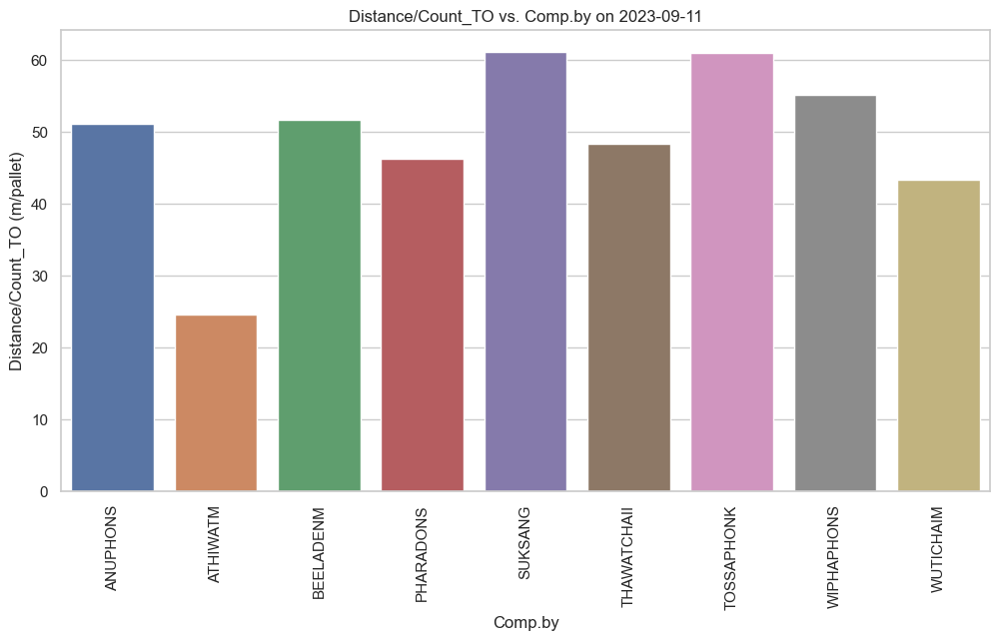

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


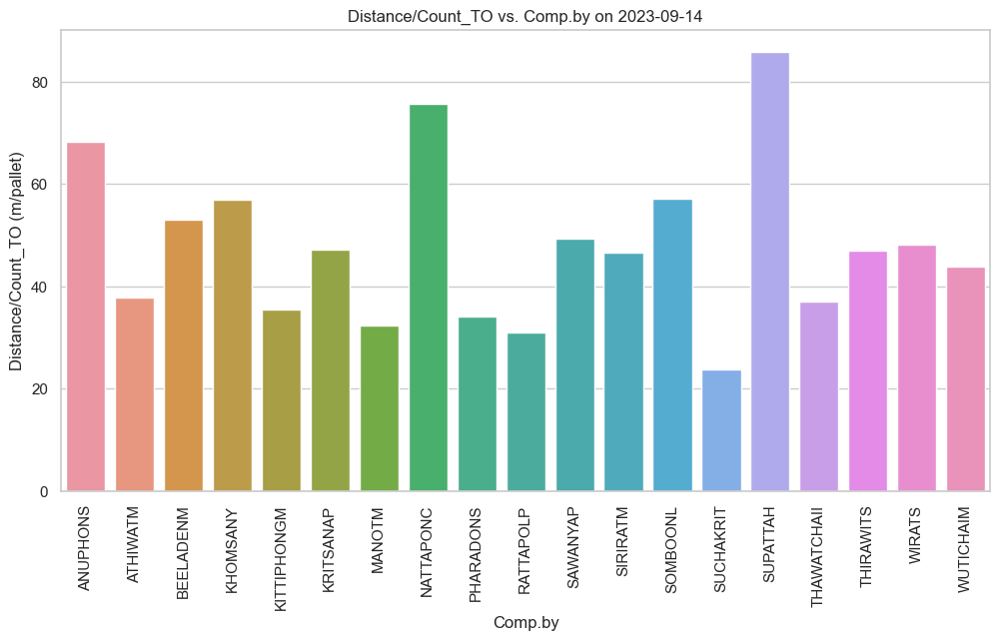

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


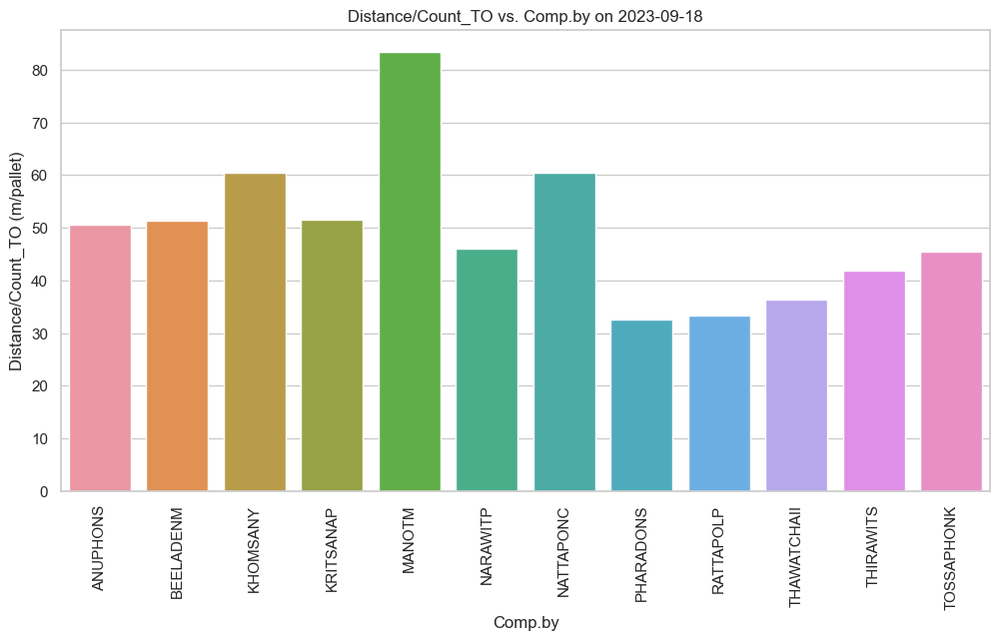

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


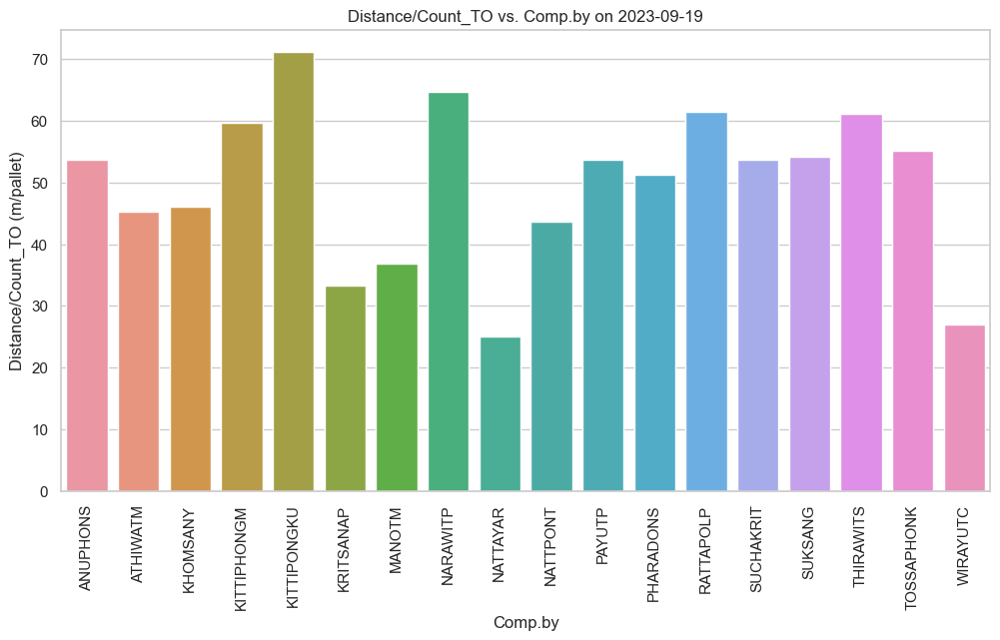

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


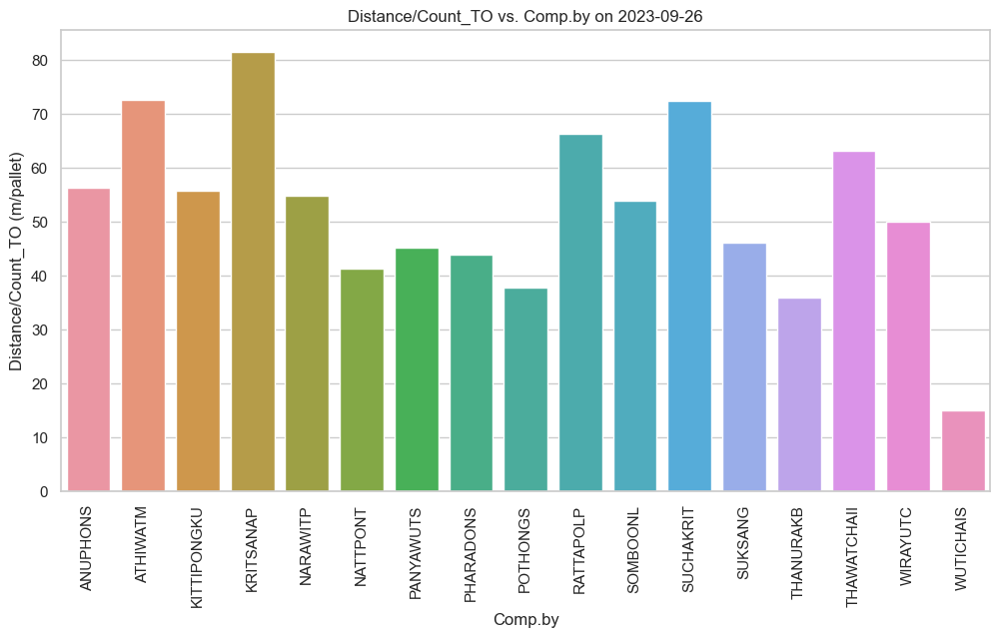

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


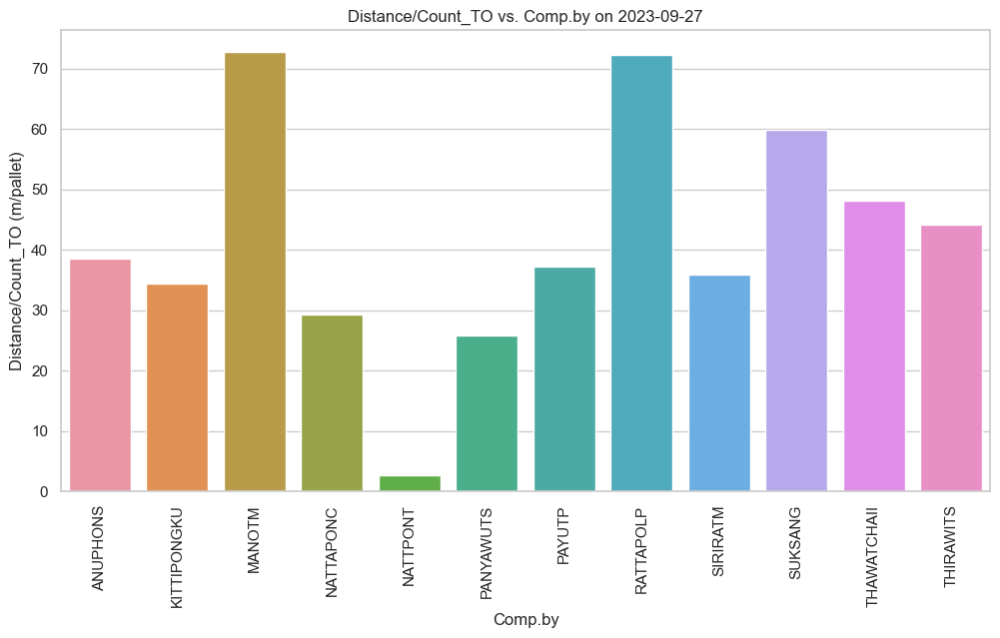

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


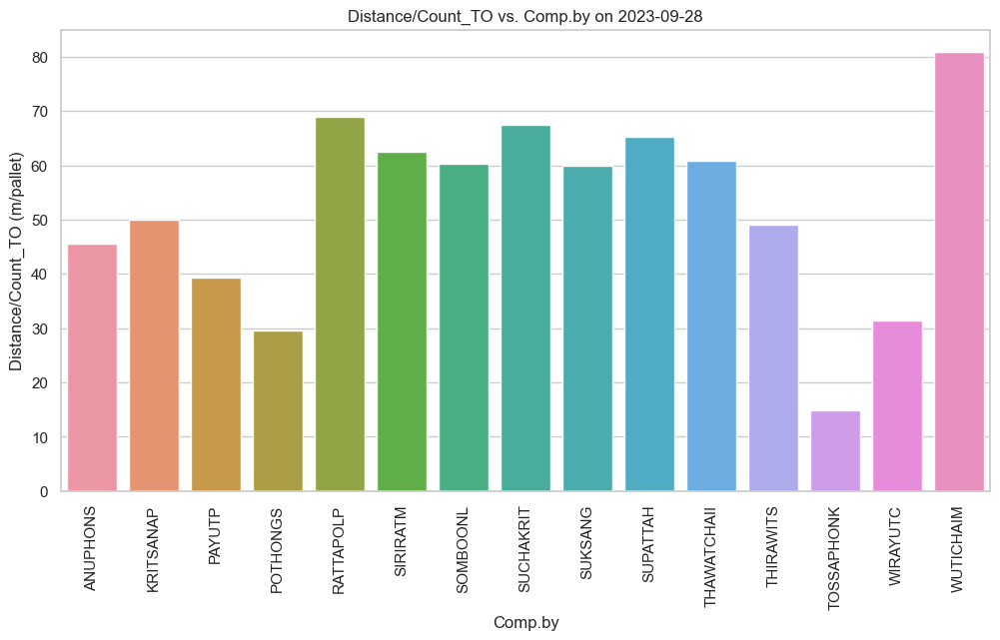

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


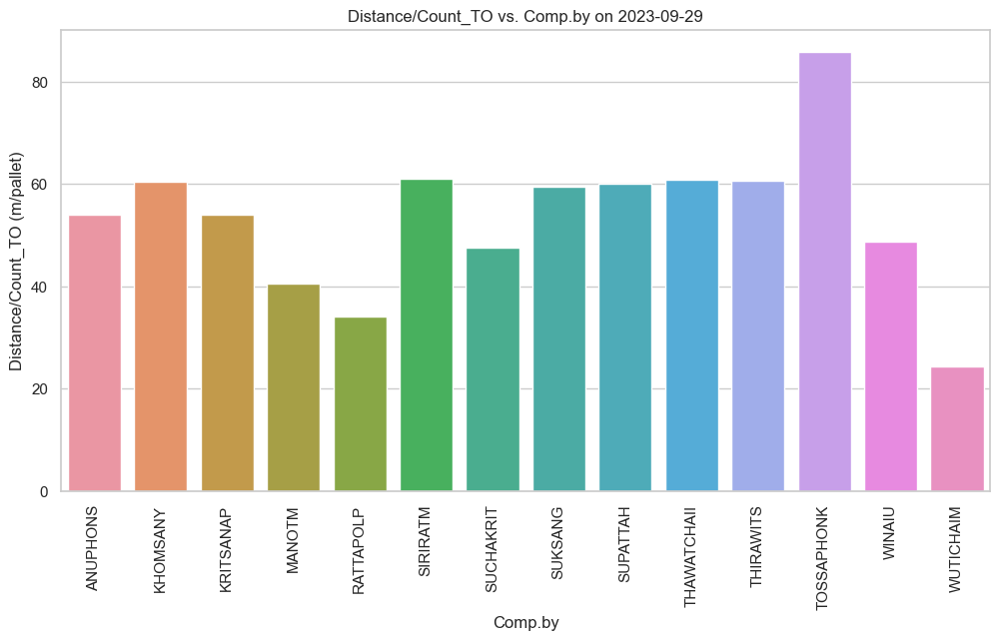

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


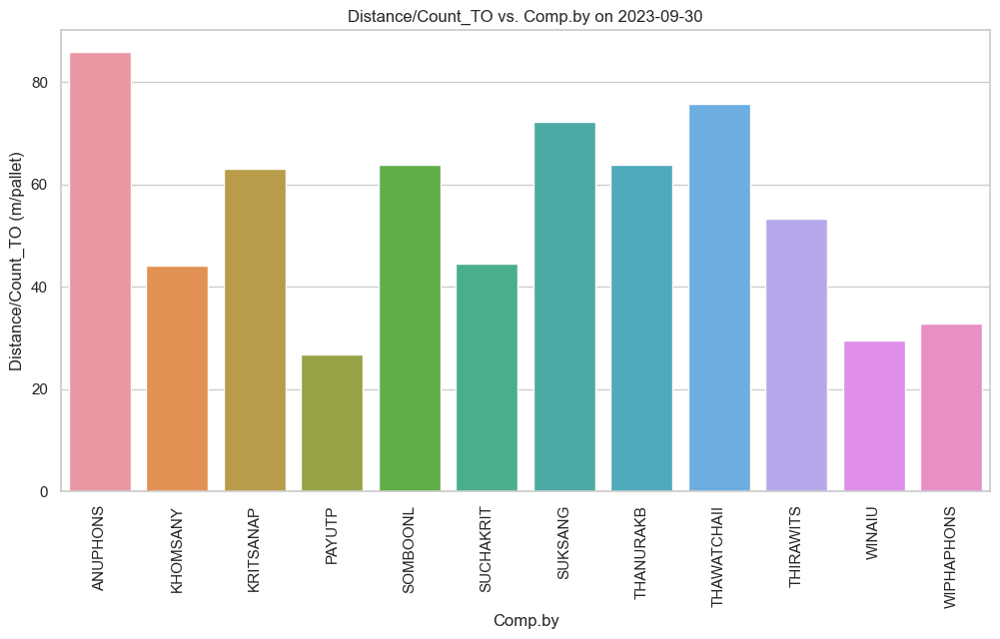

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


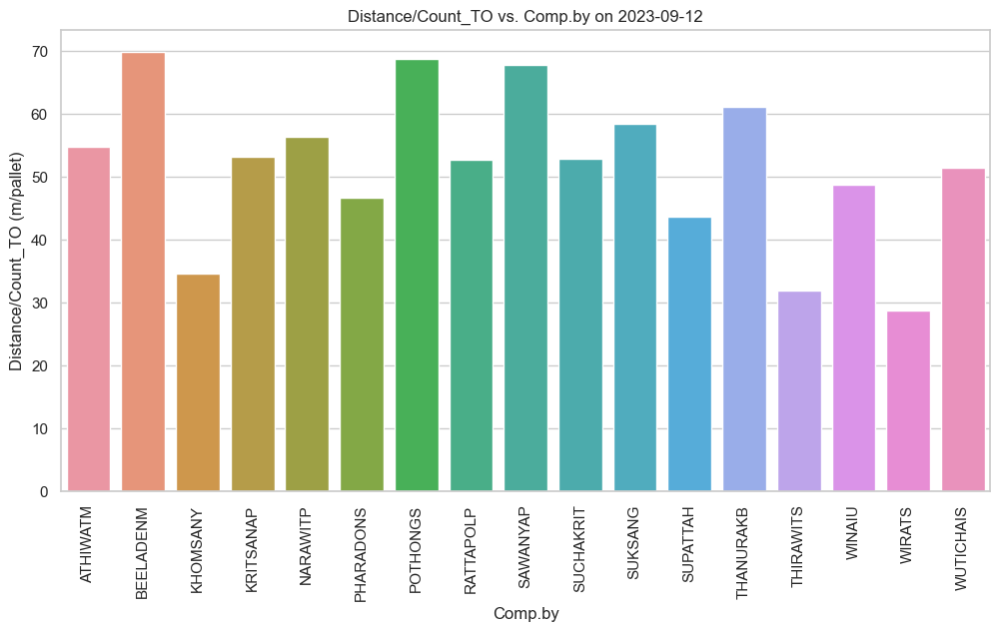

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


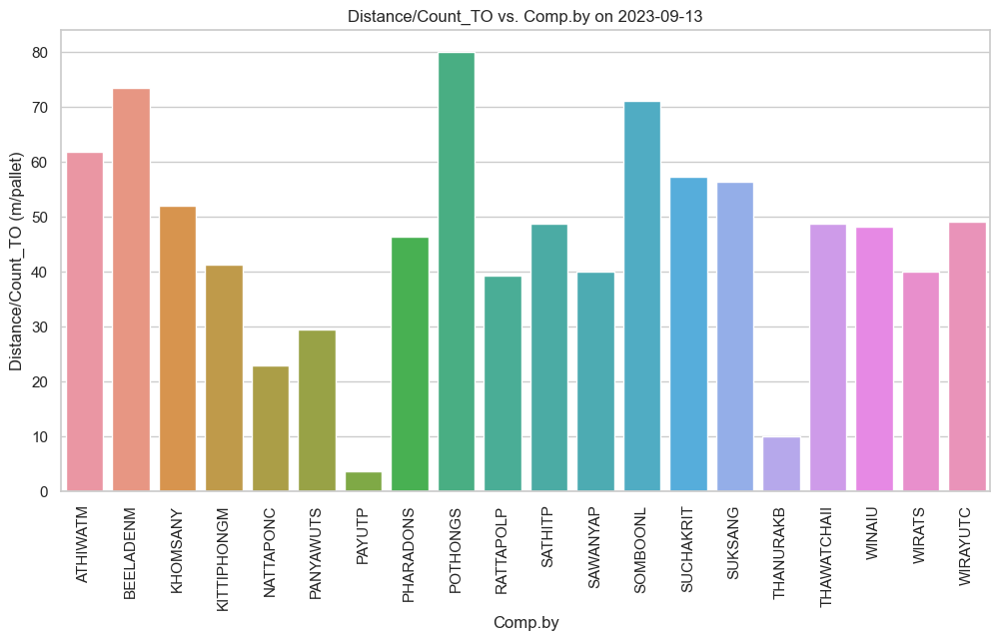

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


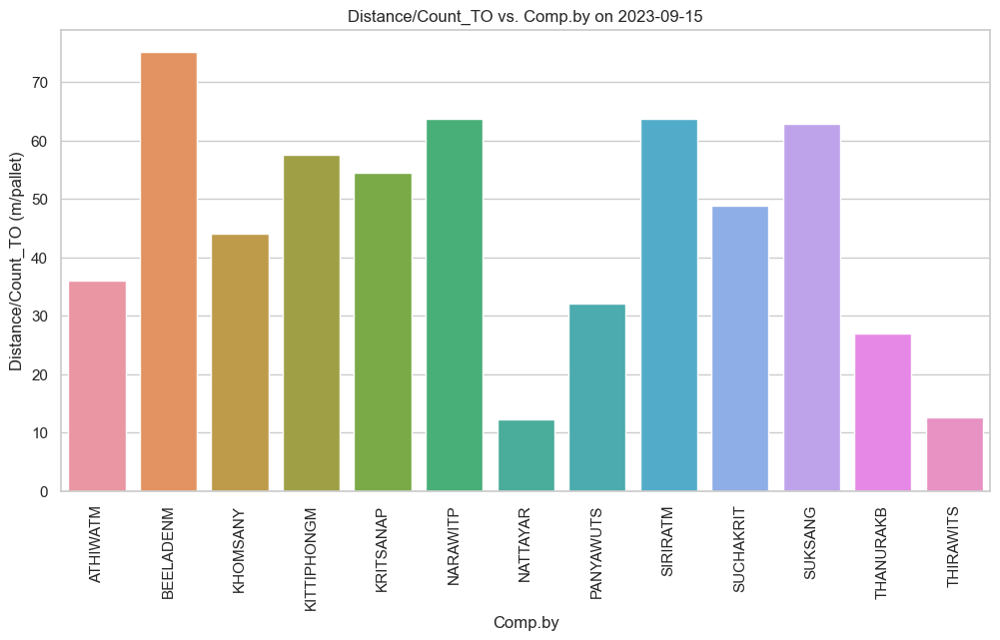

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


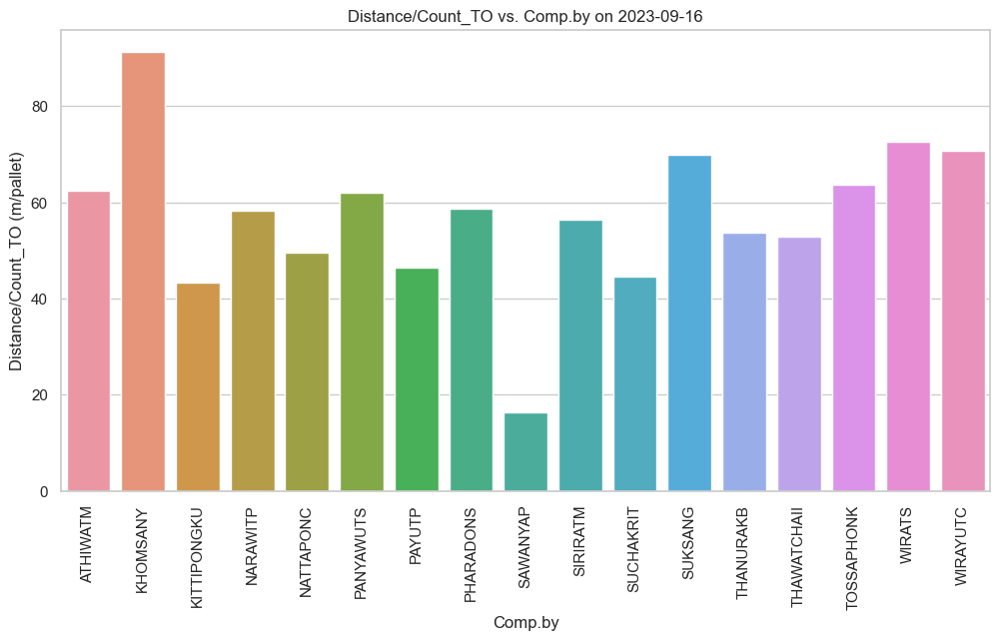

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


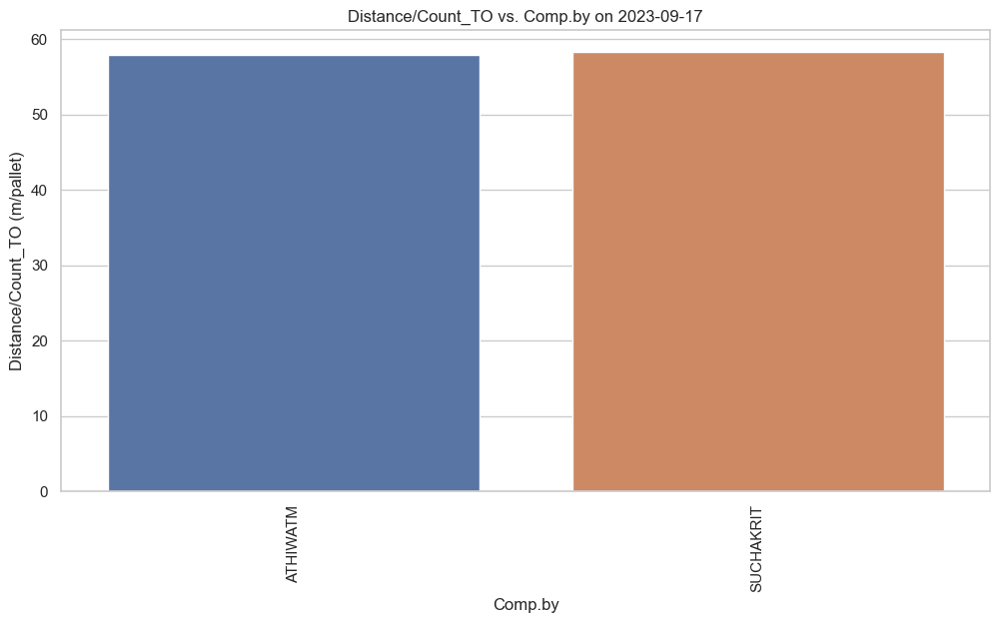

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


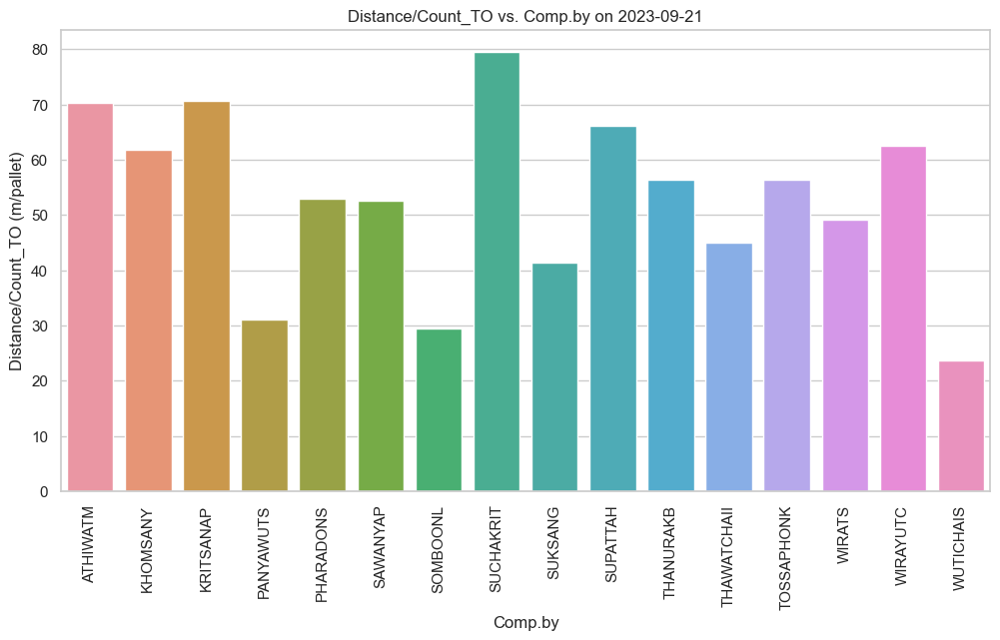

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


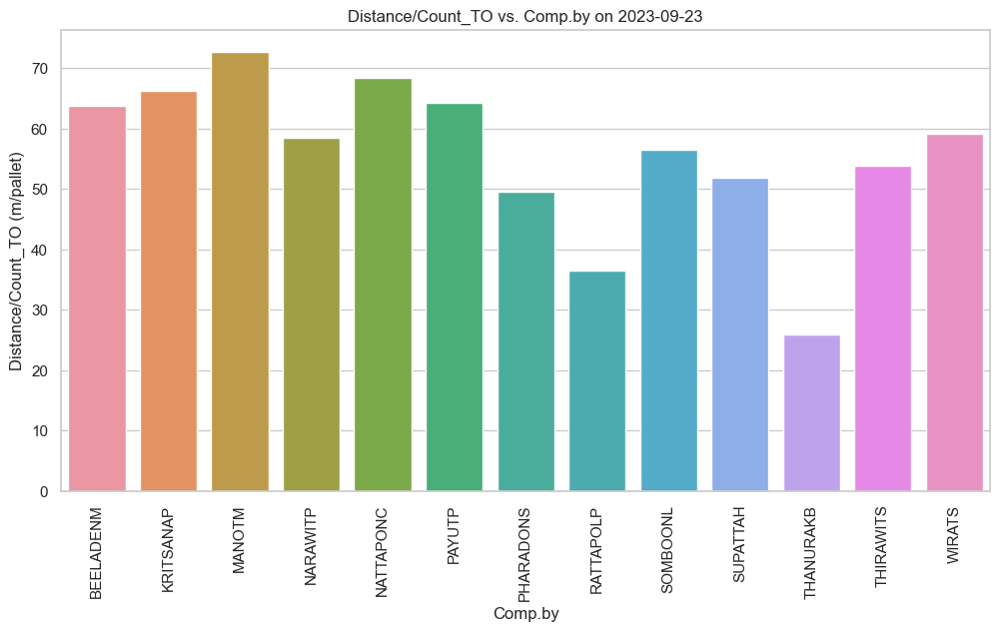

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


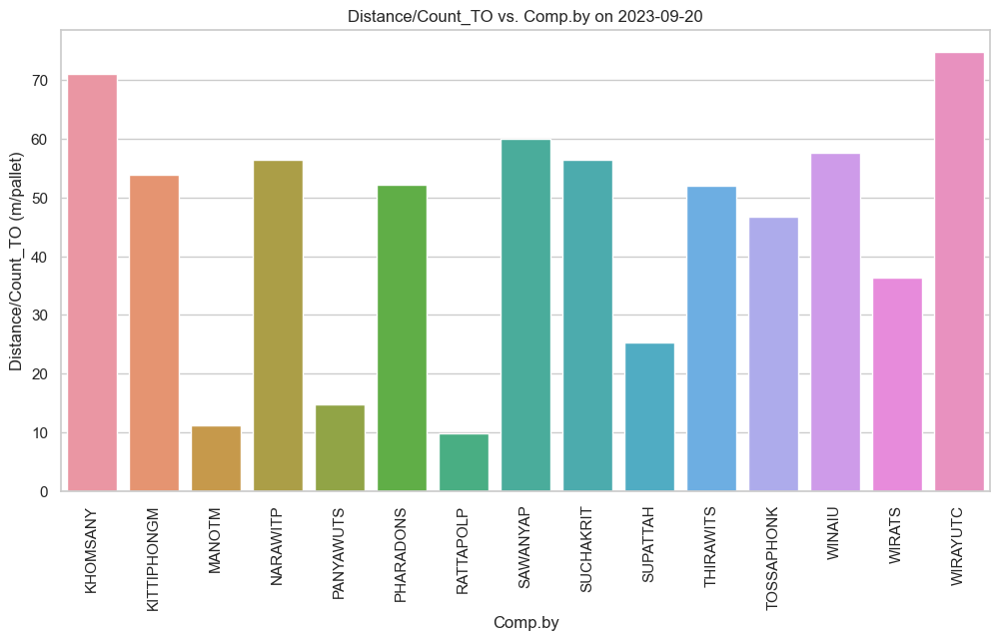

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


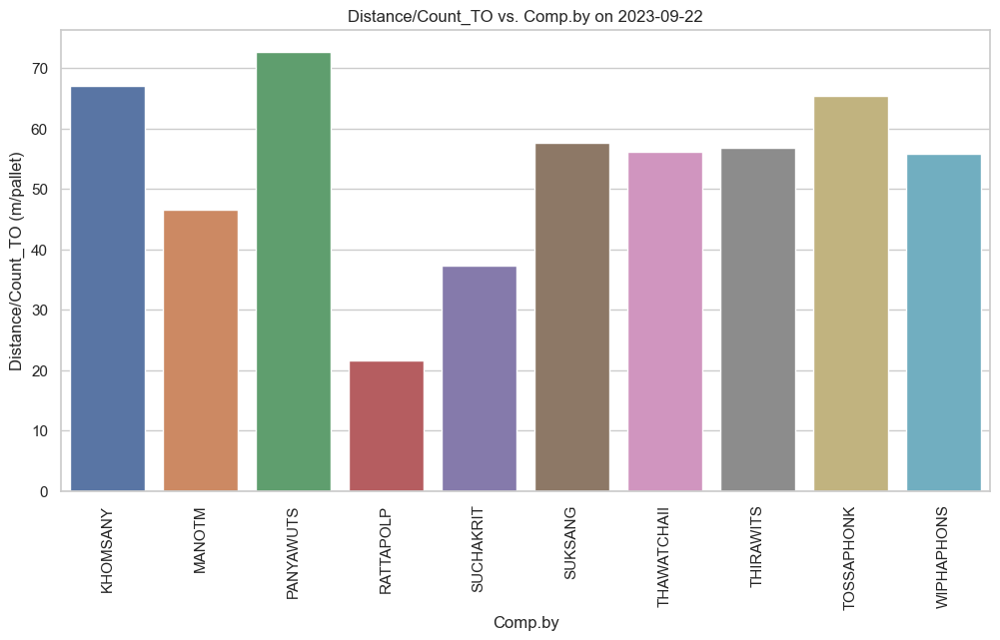

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


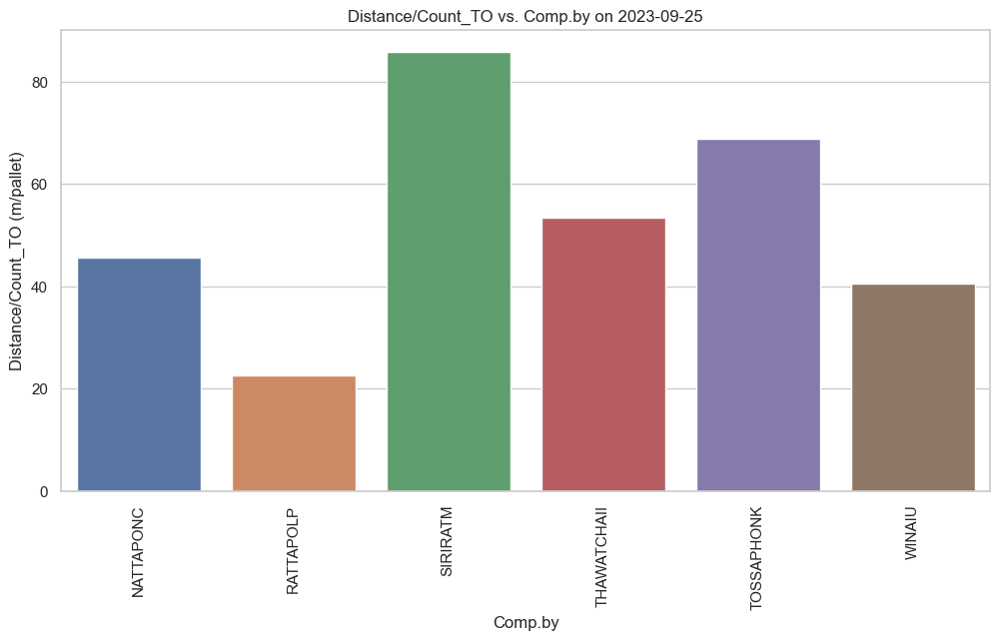

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


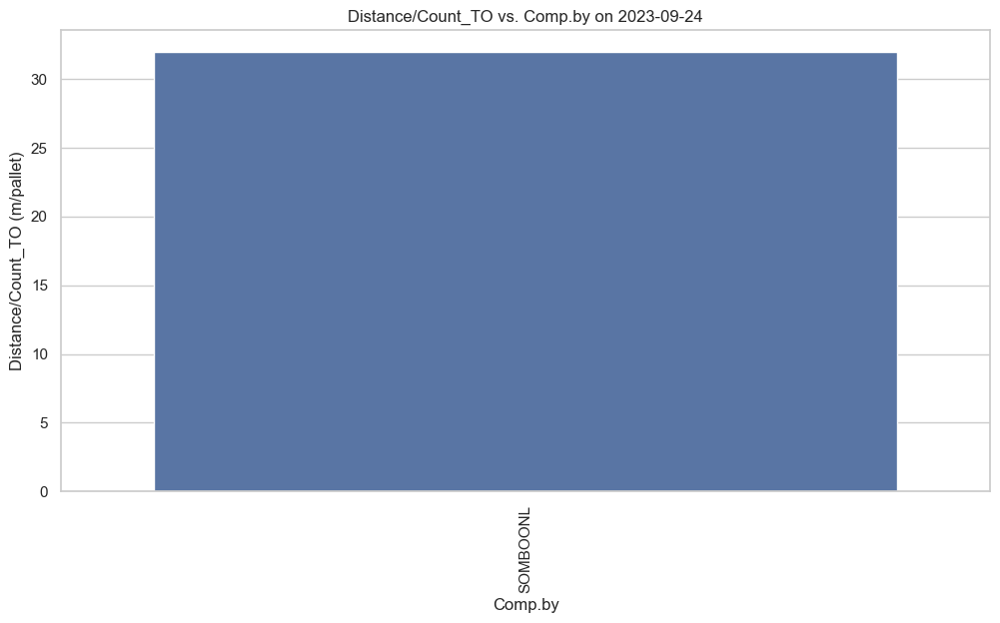

In [307]:
unique_date = list(sum_df_1['Comp.Date'].unique())
for date in unique_date:
    data = sum_df_1[sum_df_1['Comp.Date'] == date]
    # Set the style for the plot
    sns.set(style="whitegrid")

    # Create the bar plot using Seaborn
    plt.figure(figsize=(12, 6))  # Set the figure size
    sns.barplot(x='Comp.by', y='Distance/Count_TO', data=data)

    # Add labels and title
    plt.xlabel('Comp.by')
    plt.ylabel('Distance/Count_TO (m/pallet)')
    plt.title(f'Distance/Count_TO vs. Comp.by on {date}')
    # Rotate the x-axis labels for better readability
    plt.xticks(rotation=90)
    # Show the plot
    plt.show()

#### Visualize each user, total date

##### Distance/Count_TO

In [308]:
# ***3. the calculated weight (distance) only consider 2D, the different level is not included in the calculation yet.
sum_df_1_1 = sum_df_1.pivot_table(index=['Comp.by'],
                                   values=['Count_TO', 'time_diff', 'Distance(m)'], 
                                   aggfunc={'Count_TO': 'count', 'time_diff': 'sum', 'Distance(m)': 'sum'}, 
                                   fill_value=0)

sum_df_1_1 = sum_df_1.reset_index()
sum_df_1_1['Distance/Count_TO'] = sum_df_1_1['Distance(m)']/sum_df_1_1['Count_TO']
sum_df_1_1

,index,Comp.by,Comp.Date,Count_TO,time_diff,Distance(m),Distance/Count_TO
0,0,ANUPHONS,2023-09-11,2,81.0,102.179791,51.089896
1,1,ANUPHONS,2023-09-14,1,30.0,68.265467,68.265467
2,2,ANUPHONS,2023-09-18,19,561.0,959.790961,50.515314
3,3,ANUPHONS,2023-09-19,12,347.0,644.621895,53.718491
4,4,ANUPHONS,2023-09-26,1,6.0,56.398858,56.398858
...,...,...,...,...,...,...,...
253,253,WUTICHAIM,2023-09-28,1,113.0,80.898858,80.898858
254,254,WUTICHAIM,2023-09-29,3,1092.0,72.828649,24.276216
255,255,WUTICHAIS,2023-09-12,22,46.0,1131.948606,51.452209
256,256,WUTICHAIS,2023-09-21,21,99.0,495.310127,23.586197


In [309]:
#sum_df_1.to_csv('sum_df_1.csv')

In [310]:
min_date = sum_df_1_1['Comp.Date'].min()
max_date = sum_df_1_1['Comp.Date'].max()
print(f'Data since {min_date} to {max_date}')

Data since 2023-09-11 to 2023-09-30


C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


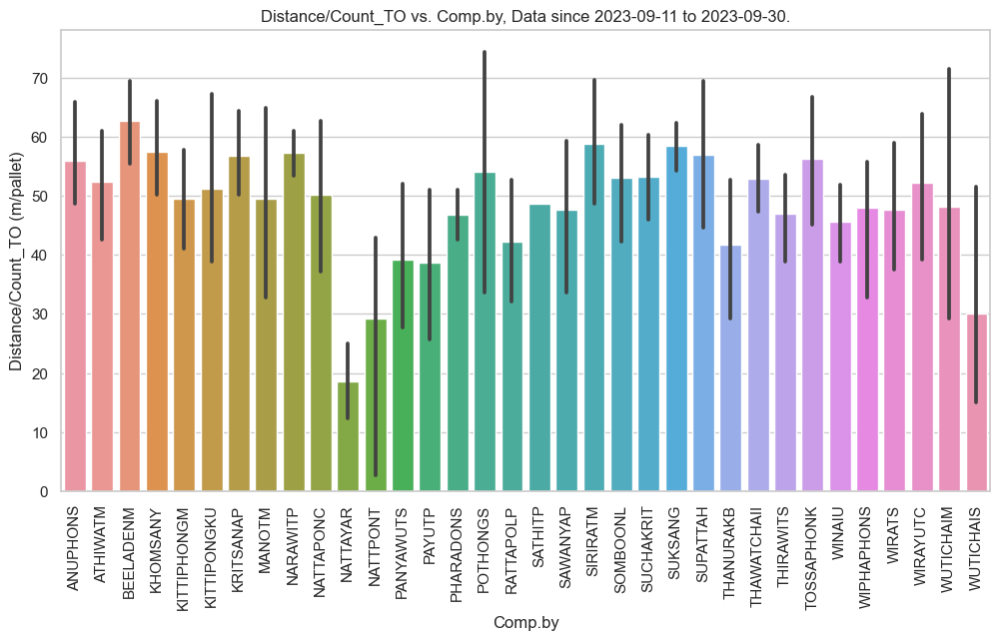

In [311]:
# Set the style for the plot
sns.set(style="whitegrid")
# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
sns.barplot(x='Comp.by', y='Distance/Count_TO', data=sum_df_1_1)
# Add labels and title
plt.xlabel('Comp.by')
plt.ylabel('Distance/Count_TO (m/pallet)')
plt.title(f'Distance/Count_TO vs. Comp.by, Data since {min_date} to {max_date}.')
# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)
# Show the plot
plt.show()

##### Distance

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


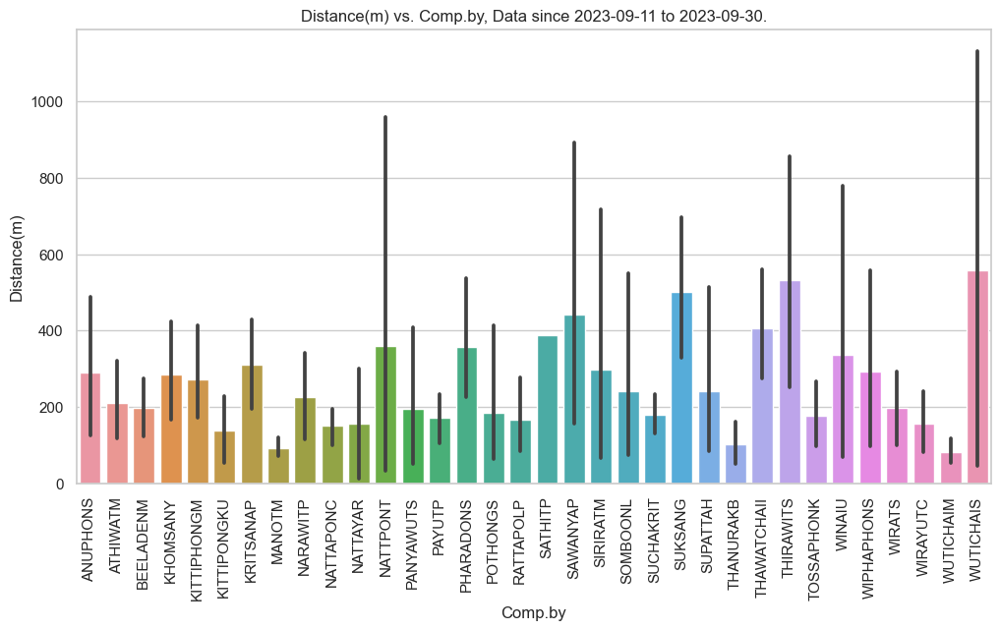

In [312]:
# Set the style for the plot
sns.set(style="whitegrid")
# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
sns.barplot(x='Comp.by', y='Distance(m)', data=sum_df_1_1)
# Add labels and title
plt.xlabel('Comp.by')
plt.ylabel('Distance(m)')
plt.title(f'Distance(m) vs. Comp.by, Data since {min_date} to {max_date}.')
# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)
# Show the plot
plt.show()

### 2nd approach try to 
- Get node journey of each day (node list) 
    - ***by "not" consider the time gap between each subsesquence work
    - ***by "separate" work activity
- Graph & weight cal & visualize

Note
1. if bin is the dummy bin, it will be set to be node I/O.
2. if bin is the source/destination bin that is not in the focused area, it will be set to be node I/O.
3. the calculated weight (distance) only consider 2D, the different level is not included in the calculation yet.
4. time_diff = 0 means that no data to obtain from log file > ***drop all rows that cannot detect timestamp from log file


In [313]:
def sum_df2(concat_user_dic,graph):
    all_weight_df = None
    for user in concat_user_dic:
        user_df = concat_user_dic[user].copy()
        user_df = user_df.sort_values('Comp._Datetime')

        condition1 = (user_df['S_Rack-Bay'] == 'dummy') | (~user_df['S_Rack'].isin(['020', '022', '021']))
        condition2 = (user_df['Dest_Rack-Bay'] == 'dummy') | (~user_df['Dest_Rack'].isin(['020', '022', '021']))

        user_df.loc[condition1,'S_Rack-Bay'] = 'I_O'
        user_df.loc[~condition1,'S_Rack-Bay'] = user_df['S_Rack-Bay'] + '-01'
        user_df.loc[condition2,'Dest_Rack-Bay'] = 'I_O'
        user_df.loc[~condition2,'Dest_Rack-Bay'] = user_df['Dest_Rack-Bay'] + '-01'
        #display(user_df)

        unique_Comp_Date = user_df['Comp.Date'].unique() 
        node_dic = {}

        for date in unique_Comp_Date:

            same_date = user_df[user_df['Comp.Date'] == date]
            same_date = same_date.loc[:,['S_Rack-Bay','Dest_Rack-Bay','Activity','Comp._Datetime','TO Number.']]
            same_date = same_date.sort_values('Comp._Datetime').reset_index(drop=True)

            #check duplicate
            duplicates = same_date[same_date.duplicated(subset=['Comp._Datetime'], keep=False)]

            node_dic_dt = {}
            if duplicates.shape[0] == 0:
                # use datetime because their are duplicate of TO number!
                for i,dt in enumerate(list(same_date['Comp._Datetime'].values)): #range(len(same_date))
                    # Initialize node_lst for the current row
                    node_lst = []
                    # Append 'I_O' node if the first node is not it.
                    if i == 0 and same_date.at[i, 'S_Rack-Bay'] != 'I_O':
                        node_lst.append('I_O')
                    # Append Dest_Rack-Bay of the previous row (if not the first row)
                    elif i > 0:
                        node_lst.append(same_date.at[i - 1, 'Dest_Rack-Bay'])

                    # Append S_Rack-Bay of the current row
                    node_lst.append(same_date.at[i, 'S_Rack-Bay'])
                    # Append Dest_Rack-Bay of the current row
                    node_lst.append(same_date.at[i, 'Dest_Rack-Bay'])

                    # If it's the last row and 'Dest_Rack-Bay' is not 'I_O'.
                    if i == len(same_date) - 1:
                        if same_date.at[i, 'Dest_Rack-Bay'] != 'I_O':
                            node_lst.append('I_O')
                    node_dic_dt[dt] = node_lst
                node_dic[date] = node_dic_dt
            else:
                print(f'Warning!! Found "Comp._Datetime" has duplicates of user "{user}" below is "same_date df".')
                display(same_date)
                raise ValueError

        weight_dic = {}
        for date in node_dic:
            weight_dic_dt = {}
            for dt in node_dic[date]:
                total_weight, path_sequence = get_shortest_path (graph,sequence_of_nodes=node_dic[date][dt], same_I_O = True, back_to_out = False)
                weight_dic_dt[dt] = total_weight
                #visualize_travel(graph, pos, node_labels, node_colors, total_weight, path_sequence, graph_pattern=1)
            weight_dic[date] = weight_dic_dt
        print('weight_dic: ', weight_dic) 

        weight_df = pd.DataFrame(weight_dic).reset_index()
        weight_df = pd.melt(weight_df, id_vars='index', var_name='Comp.Date', value_name='Distance(m)')
        weight_df = weight_df.dropna().reset_index(drop=True)
        weight_df = weight_df.rename(columns={'index': 'Comp._Datetime'})
        weight_df['Comp.by'] = user

        if all_weight_df is None:
            all_weight_df = weight_df.copy()
        else:
            all_weight_df = pd.concat([all_weight_df, weight_df], ignore_index=True)
    display(all_weight_df)
    return(all_weight_df)

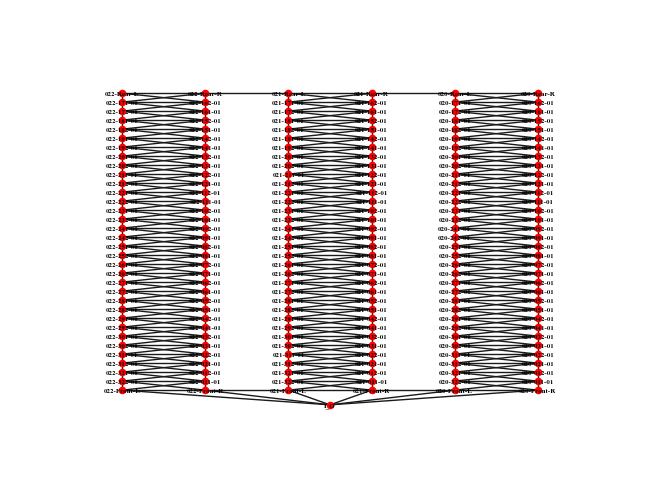

weight_dic:  {'2023-09-11': {'2023-09-11 13:56:35': 31.029791376, '2023-09-11 15:14:42': 71.15000000000003}, '2023-09-14': {'2023-09-14 07:04:25': 68.26546678700002}, '2023-09-18': {'2023-09-18 21:31:28': 22.15, '2023-09-18 21:31:57': 44.148857802, '2023-09-18 21:32:35': 56.398857802000016, '2023-09-18 21:33:02': 63.748857802000025, '2023-09-18 21:37:49': 58.90000000000002, '2023-09-18 21:41:12': 68.64885780200004, '2023-09-18 21:41:51': 75.99885780200003, '2023-09-18 21:42:17': 80.89885780200004, '2023-09-18 21:43:01': 35.929791376, '2023-09-18 21:51:38': 24.599999999999998, '2023-09-18 21:52:33': 58.90000000000002, '2023-09-18 21:54:00': 31.029791376, '2023-09-18 21:54:30': 33.479791375999994, '2023-09-18 21:54:59': 53.07979137600002, '2023-09-18 21:55:41': 89.82979137600003, '2023-09-18 21:56:08': 29.448857802, '2023-09-18 21:56:59': 39.3, '2023-09-18 21:57:31': 44.2, '2023-09-18 21:57:57': 49.10000000000001}, '2023-09-19': {'2023-09-19 01:19:04': 42.46489568800002, '2023-09-19 01:1

,Comp._Datetime,Comp.Date,Distance(m),Comp.by
0,2023-09-11 13:56:35,2023-09-11,31.029791,ANUPHONS
1,2023-09-11 15:14:42,2023-09-11,71.150000,ANUPHONS
2,2023-09-14 07:04:25,2023-09-14,68.265467,ANUPHONS
3,2023-09-18 21:31:28,2023-09-18,22.150000,ANUPHONS
4,2023-09-18 21:31:57,2023-09-18,44.148858,ANUPHONS
...,...,...,...,...
1341,2023-09-21 13:01:36,2023-09-21,56.398858,WUTICHAIS
1342,2023-09-21 13:02:50,2023-09-21,97.204220,WUTICHAIS
1343,2023-09-26 18:13:23,2023-09-26,8.164896,WUTICHAIS
1344,2023-09-26 18:14:38,2023-09-26,16.329791,WUTICHAIS


In [314]:
graph, pos, node_labels, node_colors = create_graph(graph_pattern=1)
all_weight_df = sum_df2(concat_user_dic,graph)

In [315]:
sum_df2 = All_df.merge(all_weight_df[['Comp._Datetime', 'Comp.by', 'Distance(m)']],
                       on=['Comp.by', 'Comp._Datetime'],
                       how='left')
sum_df2

,TO Number.,S.Type,Source BIN,Dest.Type,Dest.BIN,Comp._Datetime,Comp_Month,Comp.time,Comp.Date,Comp.by,...,S_level,Dest_Rack-Bay,Dest_Rack,Dest_level,S2Dest,Activity,Create_timestamp,Comp_timestamp,time_diff,Distance(m)
0,74528219.0,IDP,235316341,MH8,021-172-04,2023-09-08 17:31:08,9,17:31:08,2023-09-08,ANUPHONS,...,dummy,021-172,021,04,dummy_to_021,Putaway,NaT,NaT,0.0,NaN
1,74528223.0,IDP,235316340,MH8,021-172-05,2023-09-08 17:32:40,9,17:32:40,2023-09-08,ANUPHONS,...,dummy,021-172,021,05,dummy_to_021,Putaway,NaT,NaT,0.0,NaN
2,74528225.0,IDP,235316334,MH8,021-181-04,2023-09-08 17:33:40,9,17:33:40,2023-09-08,ANUPHONS,...,dummy,021-181,021,04,dummy_to_021,Putaway,NaT,NaT,0.0,NaN
3,74528227.0,IDP,235316333,MH8,021-182-04,2023-09-08 17:34:56,9,17:34:56,2023-09-08,ANUPHONS,...,dummy,021-182,021,04,dummy_to_021,Putaway,NaT,NaT,0.0,NaN
4,74528229.0,IDP,235316335,MH8,021-111-05,2023-09-08 17:36:02,9,17:36:02,2023-09-08,ANUPHONS,...,dummy,021-111,021,05,dummy_to_021,Putaway,NaT,NaT,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1827,74669520.0,IDP,235738765,MH8,020-101-02,2023-09-21 14:23:25,9,14:23:25,2023-09-21,WUTICHAIS,...,dummy,020-101,020,02,dummy_to_020,Putaway,NaT,NaT,0.0,NaN
1828,74727018.0,IDP,235904611,MH8,022-322-04,2023-09-26 18:13:23,9,18:13:23,2023-09-26,WUTICHAIS,...,dummy,022-322,022,04,dummy_to_022,Putaway,2023-09-26 18:13:20,2023-09-26 18:13:23,3.0,8.164896
1829,74727019.0,IDP,235904608,MH8,022-322-05,2023-09-26 18:14:38,9,18:14:38,2023-09-26,WUTICHAIS,...,dummy,022-322,022,05,dummy_to_022,Putaway,2023-09-26 18:14:36,2023-09-26 18:14:38,2.0,16.329791
1830,74727020.0,IDP,235904602,MH8,022-011-04,2023-09-26 18:15:58,9,18:15:58,2023-09-26,WUTICHAIS,...,dummy,022-011,022,04,dummy_to_022,Putaway,2023-09-26 18:15:55,2023-09-26 18:15:58,3.0,20.463753


In [316]:
# ***drop all rows that cannot detect timestamp from log file in 'sum_df2'
sum_df2 = sum_df2[sum_df2['time_diff'] != 0]
sum_df2

,TO Number.,S.Type,Source BIN,Dest.Type,Dest.BIN,Comp._Datetime,Comp_Month,Comp.time,Comp.Date,Comp.by,...,S_level,Dest_Rack-Bay,Dest_Rack,Dest_level,S2Dest,Activity,Create_timestamp,Comp_timestamp,time_diff,Distance(m)
9,74544559.0,MH8,022-292-04,200,2007391458,2023-09-11 13:56:35,9,13:56:35,2023-09-11,ANUPHONS,...,04,dummy,dummy,dummy,022_to_dummy,Picking,2023-09-11 13:56:18,2023-09-11 13:56:46,28.0,31.029791
10,74545552.0,MH8,021-192-07,200,2007391524,2023-09-11 15:14:42,9,15:14:42,2023-09-11,ANUPHONS,...,07,dummy,dummy,dummy,021_to_dummy,Picking,2023-09-11 15:13:55,2023-09-11 15:14:48,53.0,71.150000
11,74632067.0,MH8,020-051-02,200,2007401210,2023-09-18 21:43:01,9,21:43:01,2023-09-18,ANUPHONS,...,02,dummy,dummy,dummy,020_to_dummy,Picking,2023-09-18 21:42:21,2023-09-18 21:43:02,41.0,35.929791
12,74632068.0,MH8,020-182-02,200,2007401210,2023-09-18 21:42:17,9,21:42:17,2023-09-18,ANUPHONS,...,02,dummy,dummy,dummy,020_to_dummy,Picking,2023-09-18 21:41:56,2023-09-18 21:42:18,22.0,80.898858
13,74632069.0,MH8,020-192-03,200,2007401210,2023-09-18 21:41:51,9,21:41:51,2023-09-18,ANUPHONS,...,03,dummy,dummy,dummy,020_to_dummy,Picking,2023-09-18 21:41:22,2023-09-18 21:41:52,30.0,75.998858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1824,74669468.0,IDP,235737594,MH8,022-102-05,2023-09-21 13:01:36,9,13:01:36,2023-09-21,WUTICHAIS,...,dummy,022-102,022,05,dummy_to_022,Putaway,2023-09-21 13:01:15,2023-09-21 13:01:36,21.0,56.398858
1825,74669470.0,IDP,235737596,MH8,022-221-04,2023-09-21 13:02:50,9,13:02:50,2023-09-21,WUTICHAIS,...,dummy,022-221,022,04,dummy_to_022,Putaway,2023-09-21 13:02:48,2023-09-21 13:02:50,2.0,97.204220
1828,74727018.0,IDP,235904611,MH8,022-322-04,2023-09-26 18:13:23,9,18:13:23,2023-09-26,WUTICHAIS,...,dummy,022-322,022,04,dummy_to_022,Putaway,2023-09-26 18:13:20,2023-09-26 18:13:23,3.0,8.164896
1829,74727019.0,IDP,235904608,MH8,022-322-05,2023-09-26 18:14:38,9,18:14:38,2023-09-26,WUTICHAIS,...,dummy,022-322,022,05,dummy_to_022,Putaway,2023-09-26 18:14:36,2023-09-26 18:14:38,2.0,16.329791


#### Calculate time of each order from distance
Note 
let v = 7 km/hr

In [317]:
v = 7*1000/3600
sum_df2.loc[:,'Cal_t (sec)'] = sum_df2['Distance(m)']/v
sum_df2.loc[:,'IsCal_t_longer'] = (sum_df2['Cal_t (sec)'] > sum_df2['time_diff']).astype(int)
sum_df2

C:\Users\Lenovo Legion\AppData\Local\Temp\ipykernel_9484\2154546170.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sum_df2.loc[:,'Cal_t (sec)'] = sum_df2['Distance(m)']/v
C:\Users\Lenovo Legion\AppData\Local\Temp\ipykernel_9484\2154546170.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sum_df2.loc[:,'IsCal_t_longer'] = (sum_df2['Cal_t (sec)'] > sum_df2['time_diff']).astype(int)


,TO Number.,S.Type,Source BIN,Dest.Type,Dest.BIN,Comp._Datetime,Comp_Month,Comp.time,Comp.Date,Comp.by,...,Dest_Rack,Dest_level,S2Dest,Activity,Create_timestamp,Comp_timestamp,time_diff,Distance(m),Cal_t (sec),IsCal_t_longer
9,74544559.0,MH8,022-292-04,200,2007391458,2023-09-11 13:56:35,9,13:56:35,2023-09-11,ANUPHONS,...,dummy,dummy,022_to_dummy,Picking,2023-09-11 13:56:18,2023-09-11 13:56:46,28.0,31.029791,15.958178,0
10,74545552.0,MH8,021-192-07,200,2007391524,2023-09-11 15:14:42,9,15:14:42,2023-09-11,ANUPHONS,...,dummy,dummy,021_to_dummy,Picking,2023-09-11 15:13:55,2023-09-11 15:14:48,53.0,71.150000,36.591429,0
11,74632067.0,MH8,020-051-02,200,2007401210,2023-09-18 21:43:01,9,21:43:01,2023-09-18,ANUPHONS,...,dummy,dummy,020_to_dummy,Picking,2023-09-18 21:42:21,2023-09-18 21:43:02,41.0,35.929791,18.478178,0
12,74632068.0,MH8,020-182-02,200,2007401210,2023-09-18 21:42:17,9,21:42:17,2023-09-18,ANUPHONS,...,dummy,dummy,020_to_dummy,Picking,2023-09-18 21:41:56,2023-09-18 21:42:18,22.0,80.898858,41.605127,1
13,74632069.0,MH8,020-192-03,200,2007401210,2023-09-18 21:41:51,9,21:41:51,2023-09-18,ANUPHONS,...,dummy,dummy,020_to_dummy,Picking,2023-09-18 21:41:22,2023-09-18 21:41:52,30.0,75.998858,39.085127,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1824,74669468.0,IDP,235737594,MH8,022-102-05,2023-09-21 13:01:36,9,13:01:36,2023-09-21,WUTICHAIS,...,022,05,dummy_to_022,Putaway,2023-09-21 13:01:15,2023-09-21 13:01:36,21.0,56.398858,29.005127,1
1825,74669470.0,IDP,235737596,MH8,022-221-04,2023-09-21 13:02:50,9,13:02:50,2023-09-21,WUTICHAIS,...,022,04,dummy_to_022,Putaway,2023-09-21 13:02:48,2023-09-21 13:02:50,2.0,97.204220,49.990742,1
1828,74727018.0,IDP,235904611,MH8,022-322-04,2023-09-26 18:13:23,9,18:13:23,2023-09-26,WUTICHAIS,...,022,04,dummy_to_022,Putaway,2023-09-26 18:13:20,2023-09-26 18:13:23,3.0,8.164896,4.199089,1
1829,74727019.0,IDP,235904608,MH8,022-322-05,2023-09-26 18:14:38,9,18:14:38,2023-09-26,WUTICHAIS,...,022,05,dummy_to_022,Putaway,2023-09-26 18:14:36,2023-09-26 18:14:38,2.0,16.329791,8.398178,1


In [318]:
# ***3. the calculated weight (distance) only consider 2D, the different level is not included in the calculation yet.
pivot_table2 = sum_df2.pivot_table(index=['Comp.by', 'Comp.Date', 'Activity'],
                                   values=['TO Number.', 'time_diff', 'Distance(m)'], 
                                   aggfunc={'TO Number.': 'count', 'time_diff': 'sum', 'Distance(m)': 'sum'}, 
                                   #columns='Activity', 
                                   fill_value=0)
pivot_table2 = pivot_table2.reset_index()
pivot_table2 = pivot_table2.rename(columns={'TO Number.': 'Count_TO'})
pivot_table2['Distance/Count_TO'] = pivot_table2['Distance(m)']/pivot_table2['Count_TO']
pivot_table2

,Comp.by,Comp.Date,Activity,Distance(m),Count_TO,time_diff,Distance/Count_TO
0,ANUPHONS,2023-09-11,Picking,102.179791,2,81.0,51.089896
1,ANUPHONS,2023-09-14,Replenishment,68.265467,1,30.0,68.265467
2,ANUPHONS,2023-09-18,Picking,959.790961,19,561.0,50.515314
3,ANUPHONS,2023-09-19,Putaway,644.621895,12,347.0,53.718491
4,ANUPHONS,2023-09-26,Replenishment,56.398858,1,6.0,56.398858
...,...,...,...,...,...,...,...
297,WUTICHAIM,2023-09-29,Picking,31.998858,2,343.0,15.999429
298,WUTICHAIM,2023-09-29,Putaway,40.829791,1,749.0,40.829791
299,WUTICHAIS,2023-09-12,Putaway,1131.948606,22,46.0,51.452209
300,WUTICHAIS,2023-09-21,Putaway,495.310127,17,99.0,29.135890


#### Visualize each user, each activity, each day

##### Distance/Count_TO

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

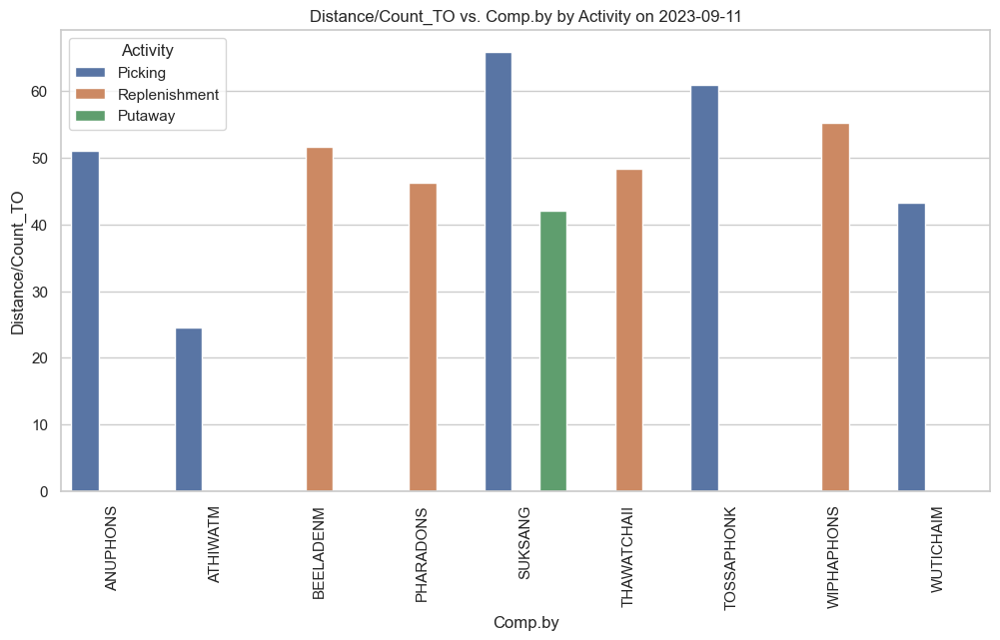

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

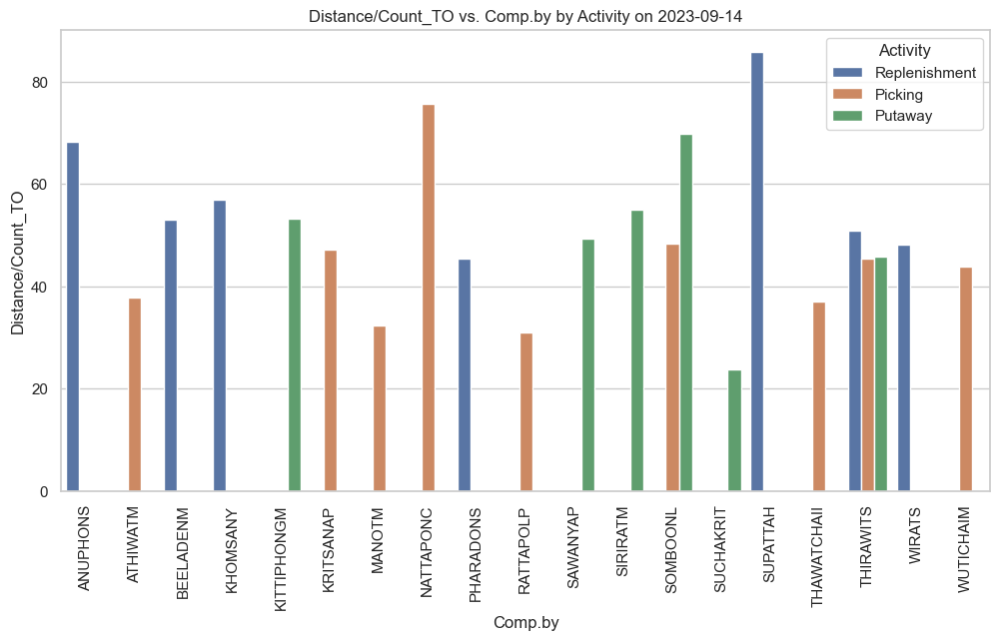

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

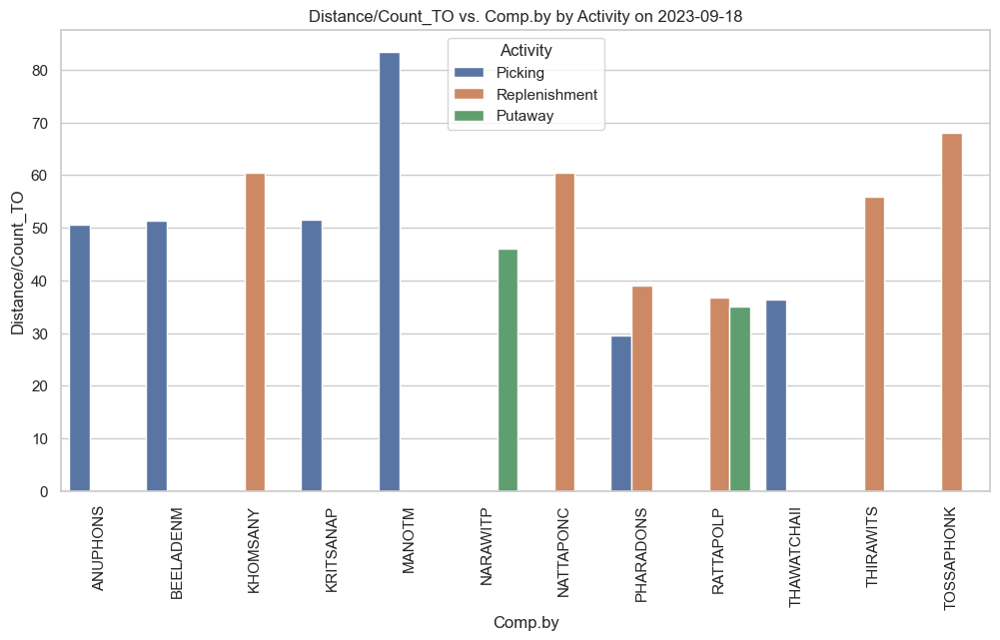

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

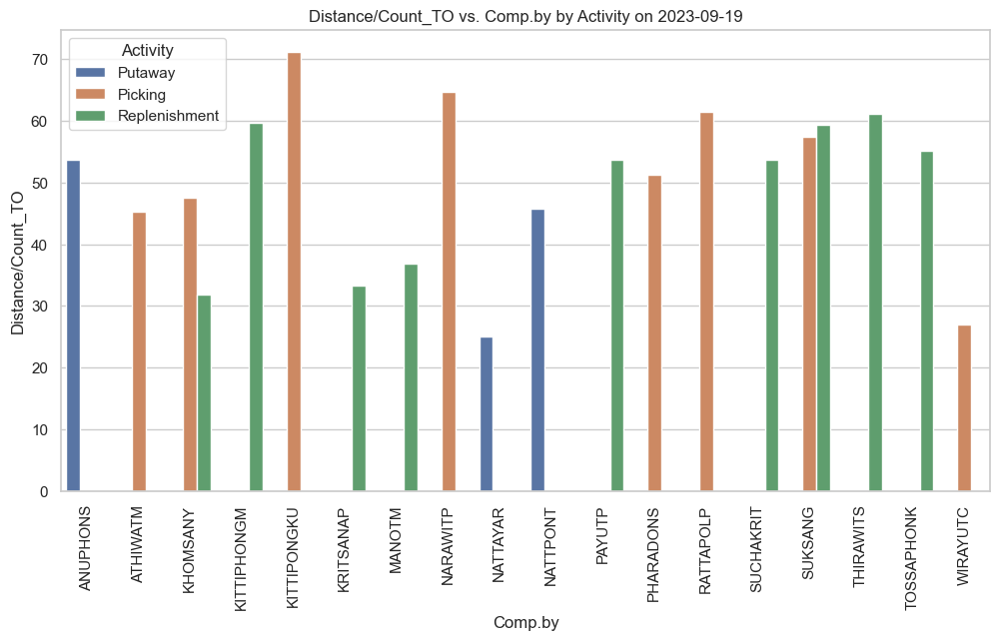

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

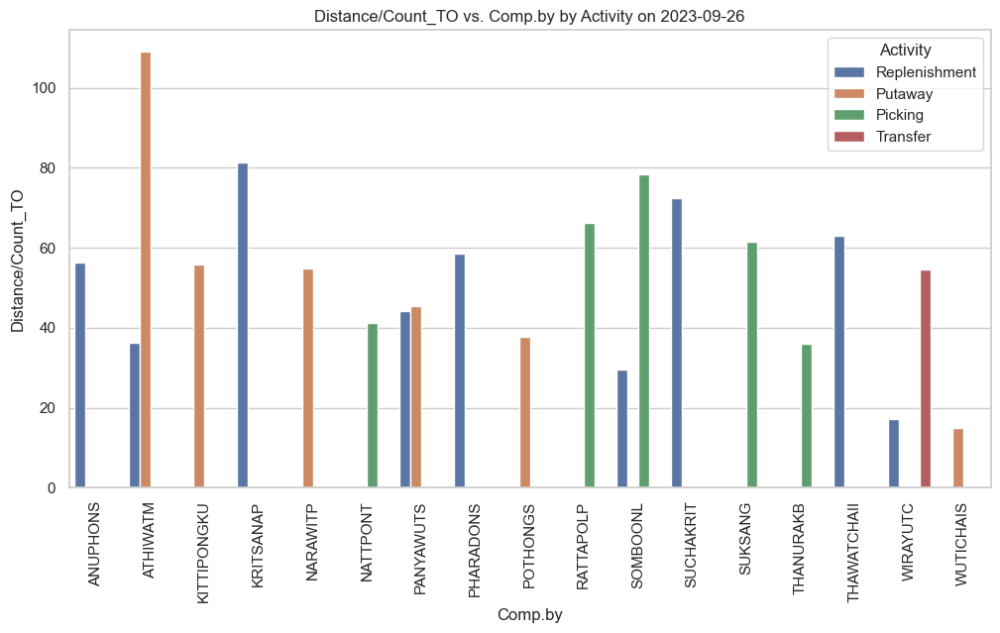

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

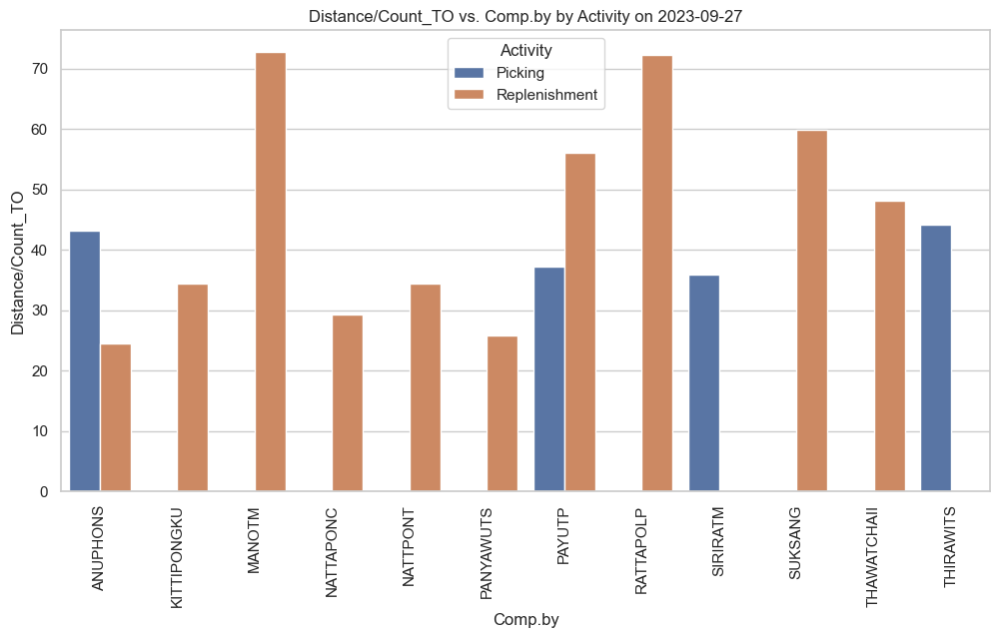

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

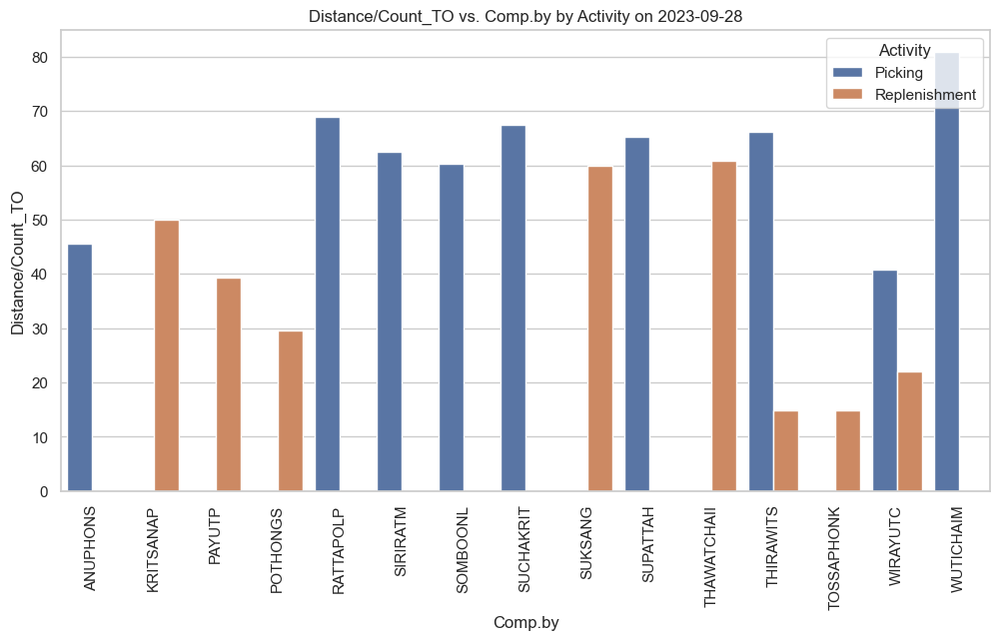

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

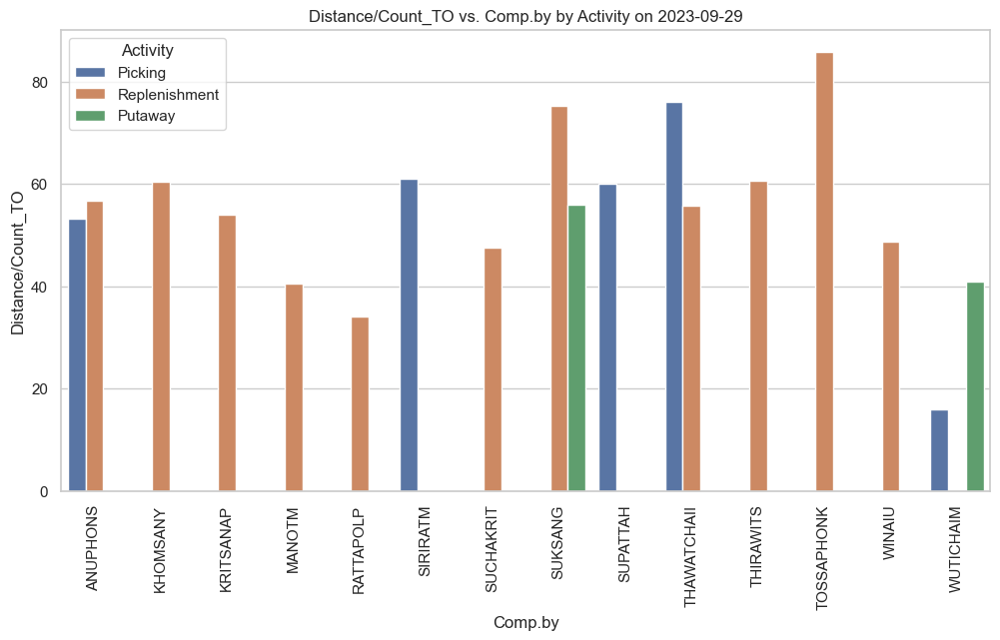

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

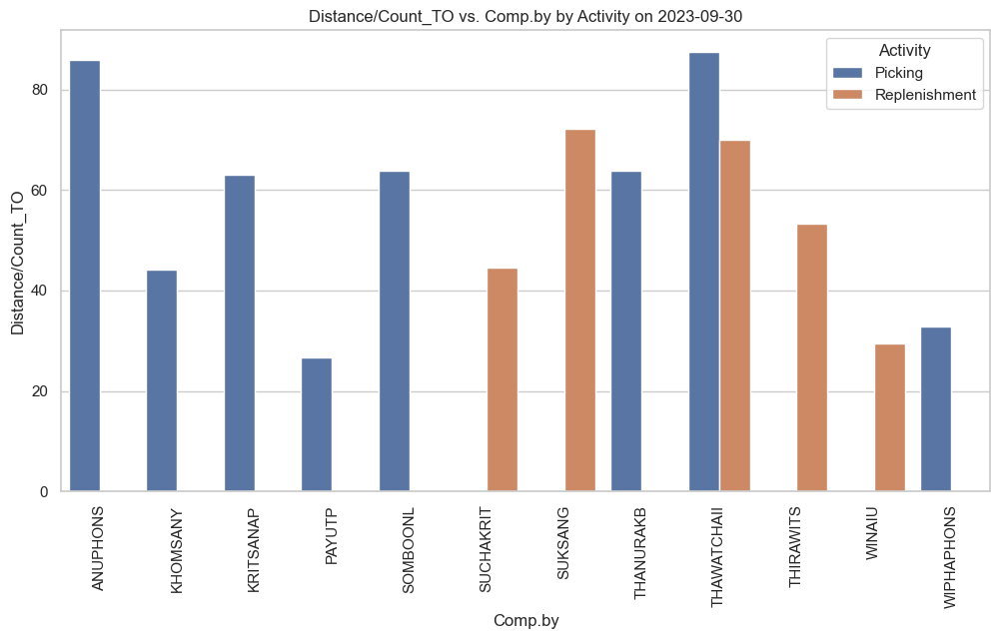

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

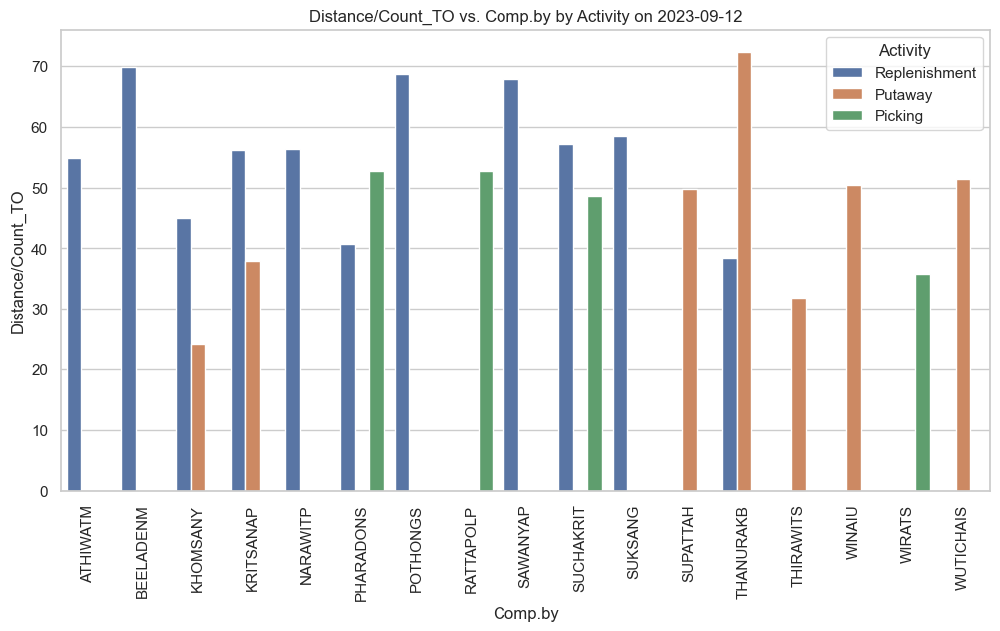

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

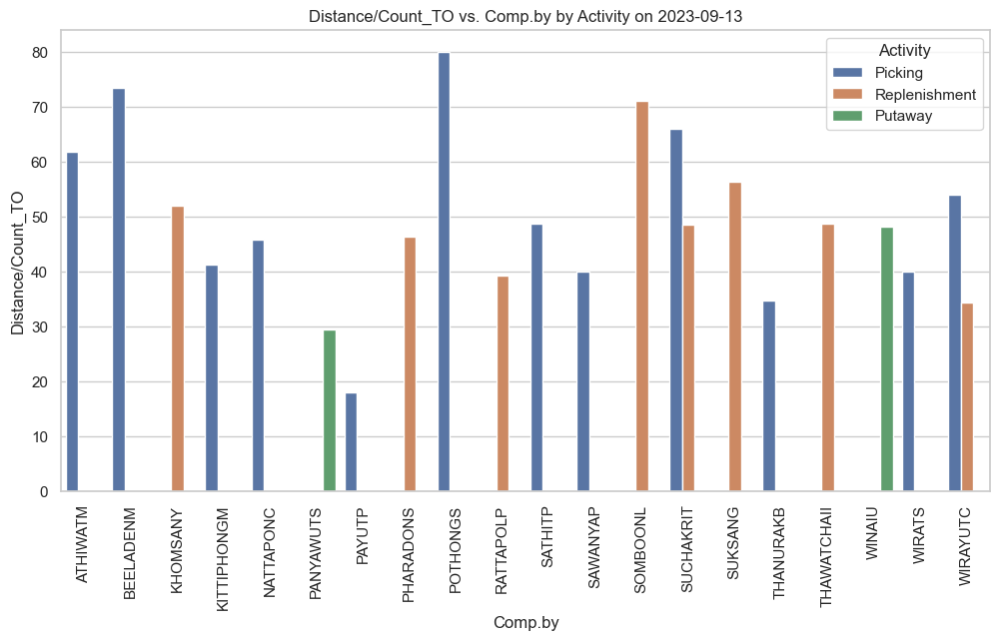

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

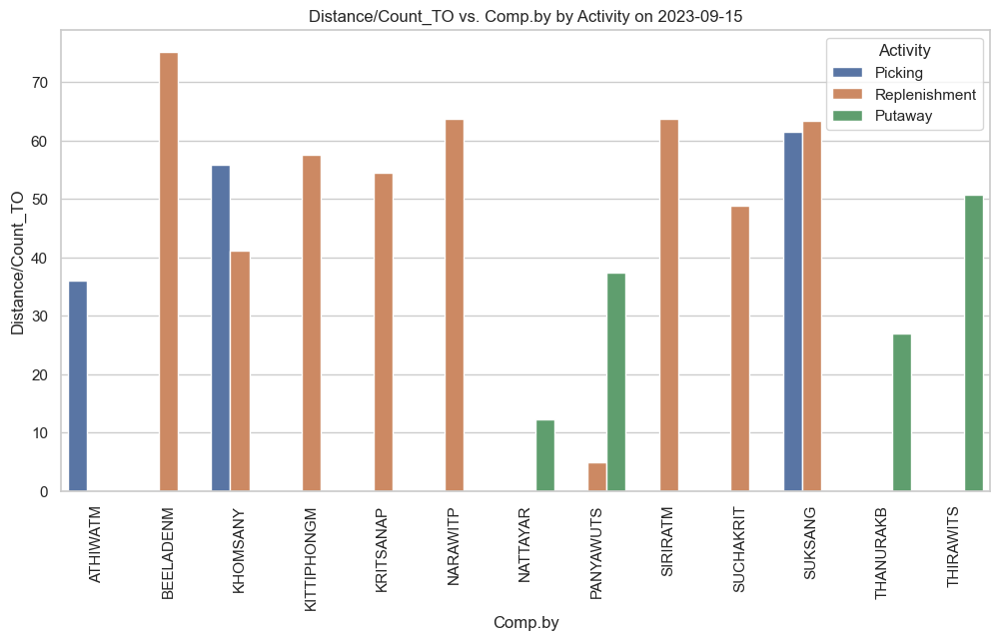

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

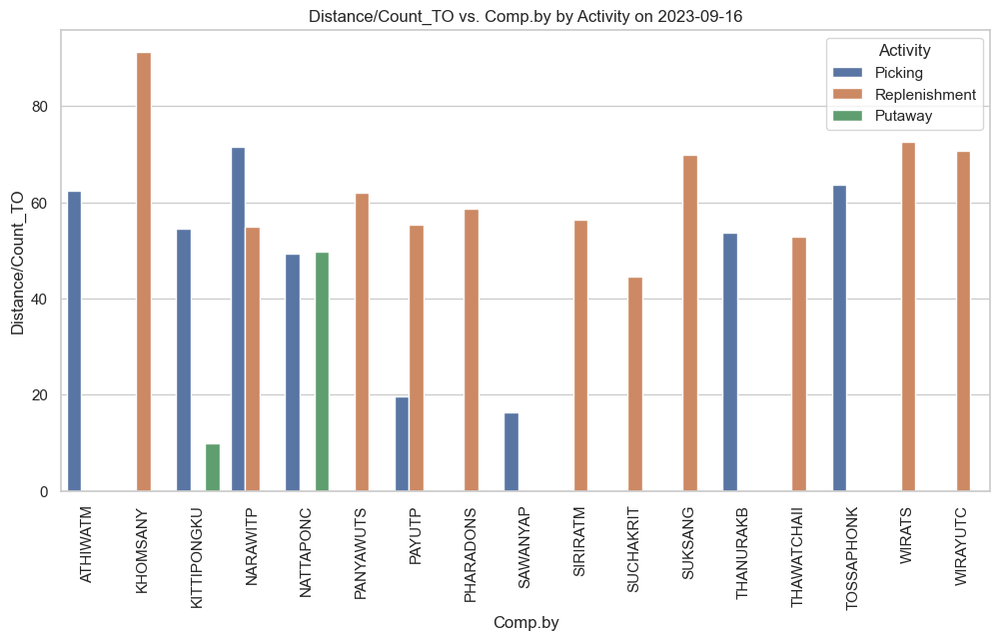

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

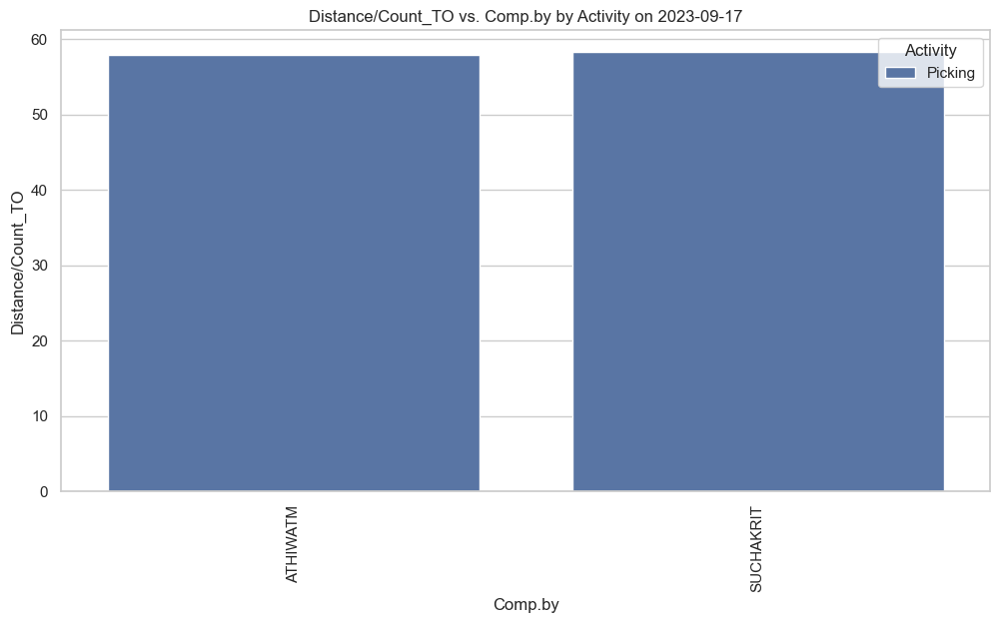

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

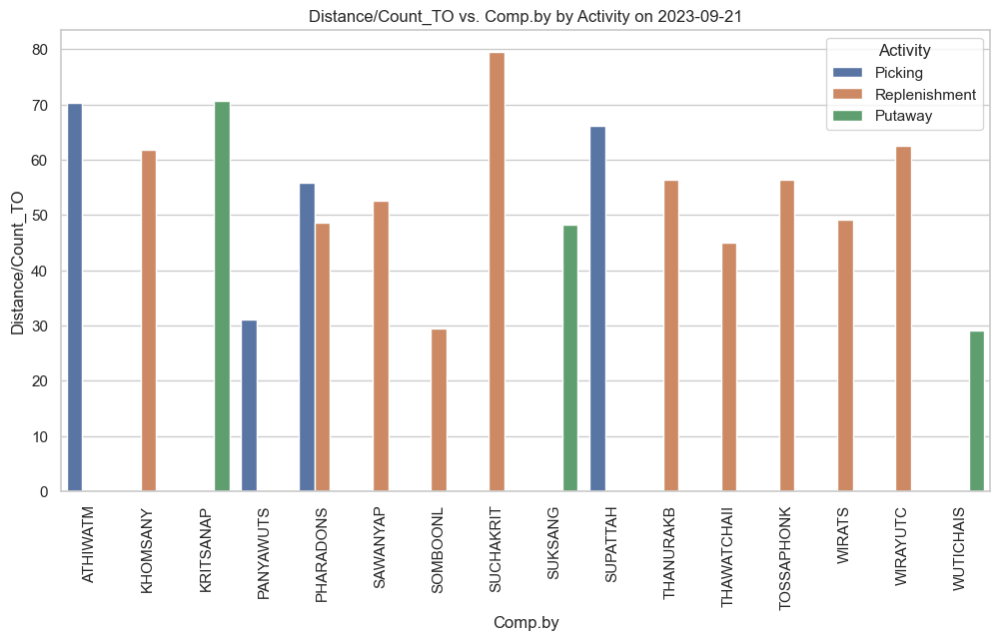

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

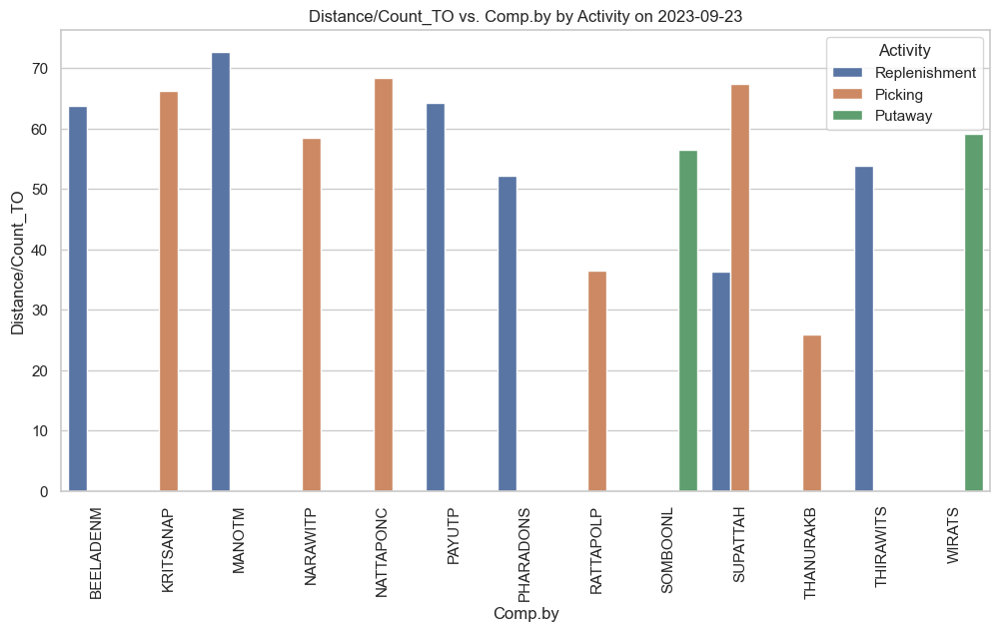

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

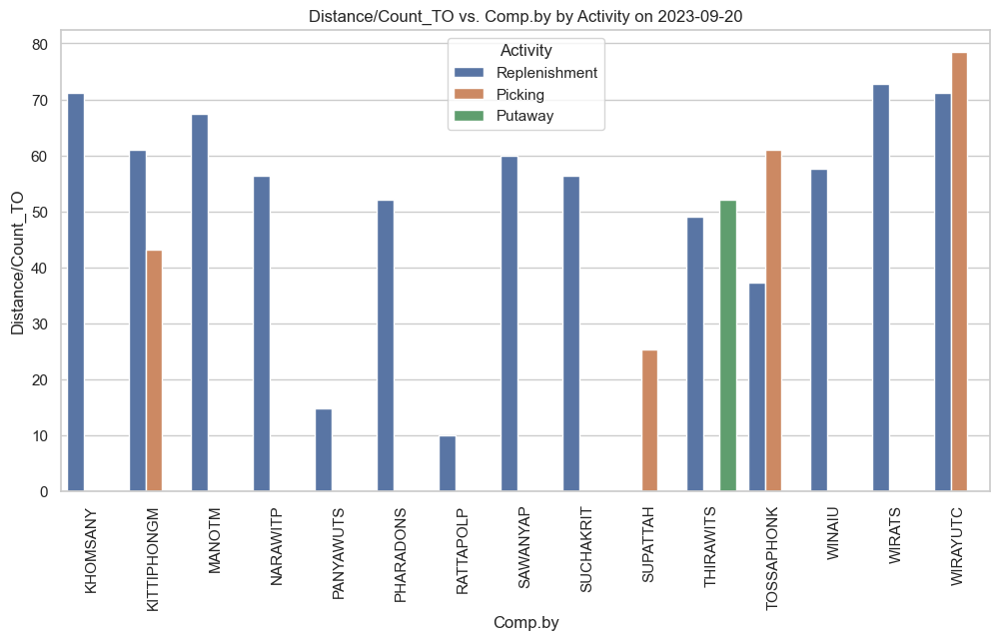

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

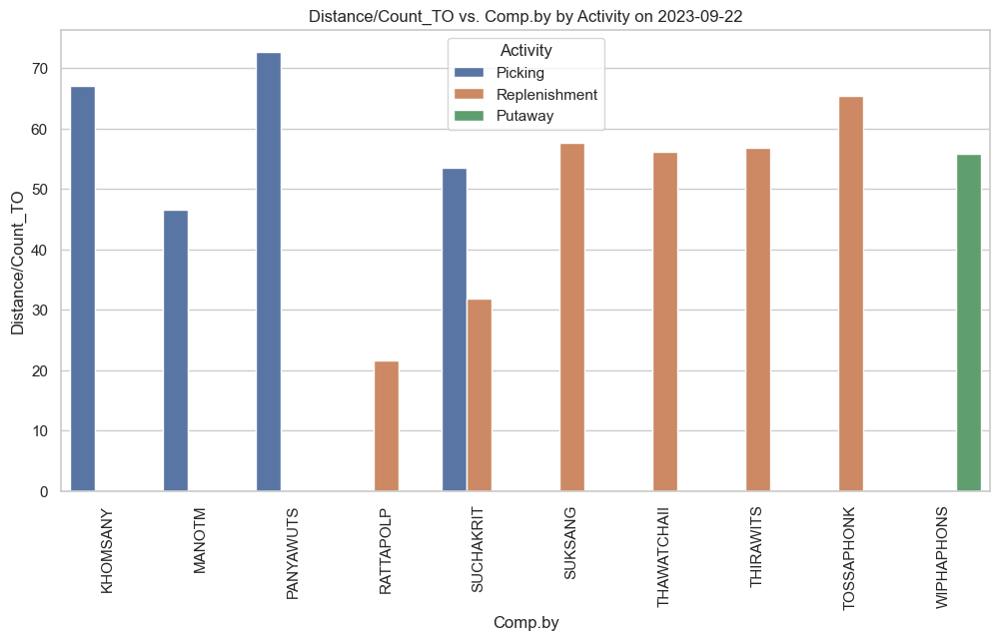

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

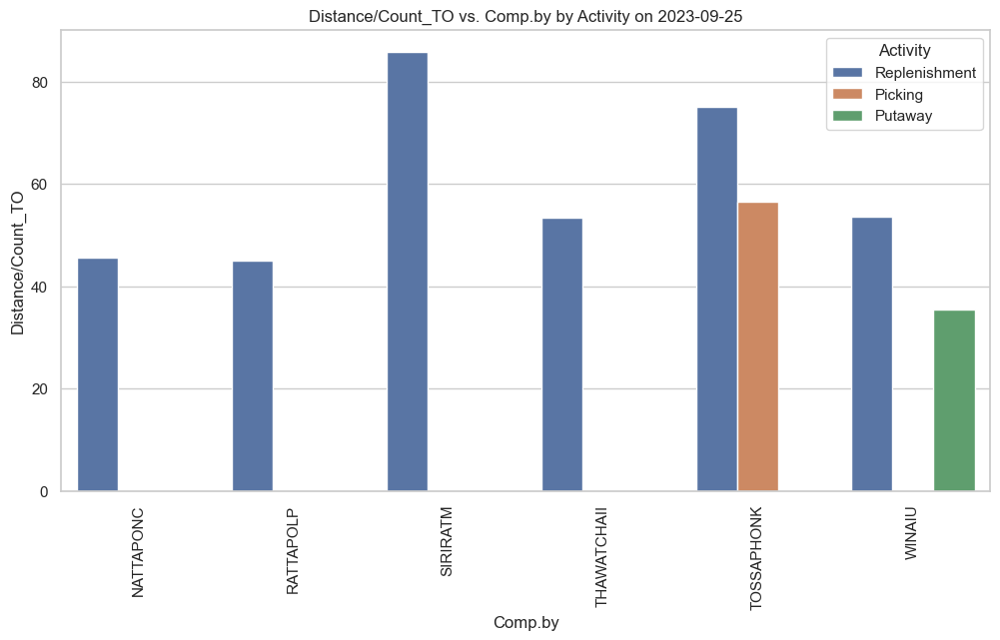

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

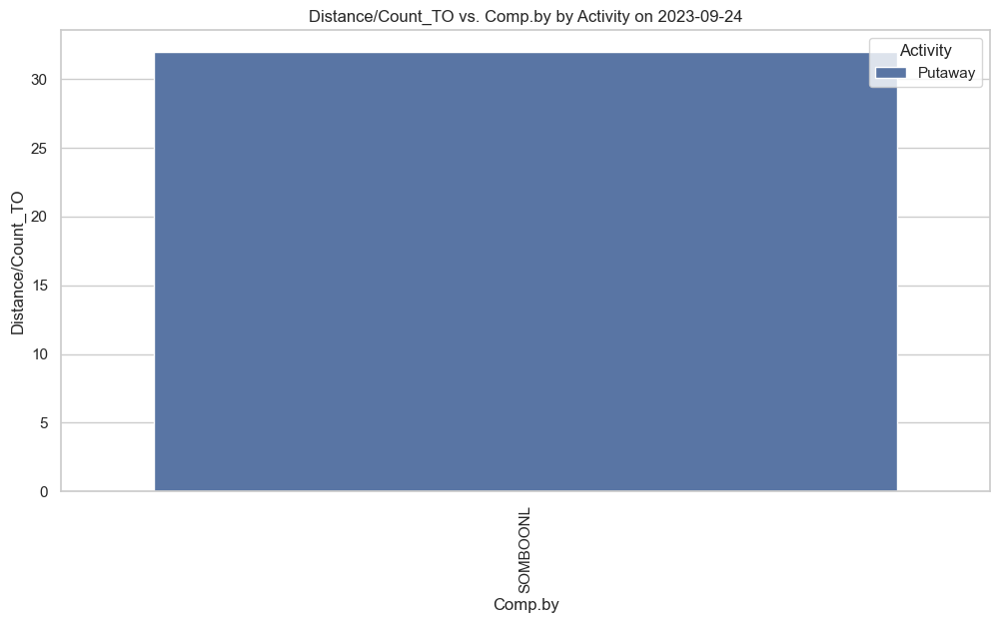

In [319]:
unique_date = list(pivot_table2['Comp.Date'].unique())
for date in unique_date:
    data = pivot_table2[pivot_table2['Comp.Date'] == date]
    # Set the style for the plot
    sns.set(style="whitegrid")

    # Create the bar plot using Seaborn
    plt.figure(figsize=(12, 6))  # Set the figure size
    sns.barplot(x='Comp.by', y='Distance/Count_TO', hue='Activity', data=data)

    # Add labels and title
    plt.xlabel('Comp.by')
    plt.ylabel('Distance/Count_TO')
    plt.title(f'Distance/Count_TO vs. Comp.by by Activity on {date}')
    # Rotate the x-axis labels for better readability
    plt.xticks(rotation=90)
    # Show the plot
    plt.show()

#### Visualize each user, each activity, total date

In [320]:
min_date = pivot_table2['Comp.Date'].min()
max_date = pivot_table2['Comp.Date'].max()
print(f'Data since {min_date} to {max_date}')

Data since 2023-09-11 to 2023-09-30


In [321]:
# ***3. the calculated weight (distance) only consider 2D, the different level is not included in the calculation yet.
pivot_table2_1 = pivot_table2.pivot_table(index=['Comp.by', 'Activity'],
                                   values=['Count_TO', 'time_diff', 'Distance(m)'], 
                                   aggfunc={'Count_TO': 'count', 'time_diff': 'sum', 'Distance(m)': 'sum'}, 
                                   #columns='Activity', 
                                   fill_value=0)

pivot_table2_1 = pivot_table2_1.reset_index()
pivot_table2_1['Distance/Count_TO'] = pivot_table2_1['Distance(m)']/pivot_table2_1['Count_TO']
pivot_table2_1['time/Count_TO'] = pivot_table2_1['time_diff']/pivot_table2_1['Count_TO'] #second/pallet
pivot_table2_1['Distance/time'] = pivot_table2_1['Distance(m)']/pivot_table2_1['time_diff']
pivot_table2_1

,Comp.by,Activity,Count_TO,Distance(m),time_diff,Distance/Count_TO,time/Count_TO,Distance/time
0,ANUPHONS,Picking,6,1763.441283,1145.0,293.906881,190.833333,1.540123
1,ANUPHONS,Putaway,1,644.621895,347.0,644.621895,347.000000,1.857700
2,ANUPHONS,Replenishment,4,206.013753,353.0,51.503438,88.250000,0.583608
3,ATHIWATM,Picking,8,1786.771297,4053.0,223.346412,506.625000,0.440852
4,ATHIWATM,Putaway,1,109.019687,3.0,109.019687,3.000000,36.339896
...,...,...,...,...,...,...,...,...
83,WIRAYUTC,Replenishment,6,411.226365,1049.0,68.537727,174.833333,0.392018
84,WIRAYUTC,Transfer,1,382.475843,25942.0,382.475843,25942.000000,0.014743
85,WUTICHAIM,Picking,4,287.806156,1650.0,71.951539,412.500000,0.174428
86,WUTICHAIM,Putaway,1,40.829791,749.0,40.829791,749.000000,0.054512


##### Distance

###### All activity in 1 chart

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

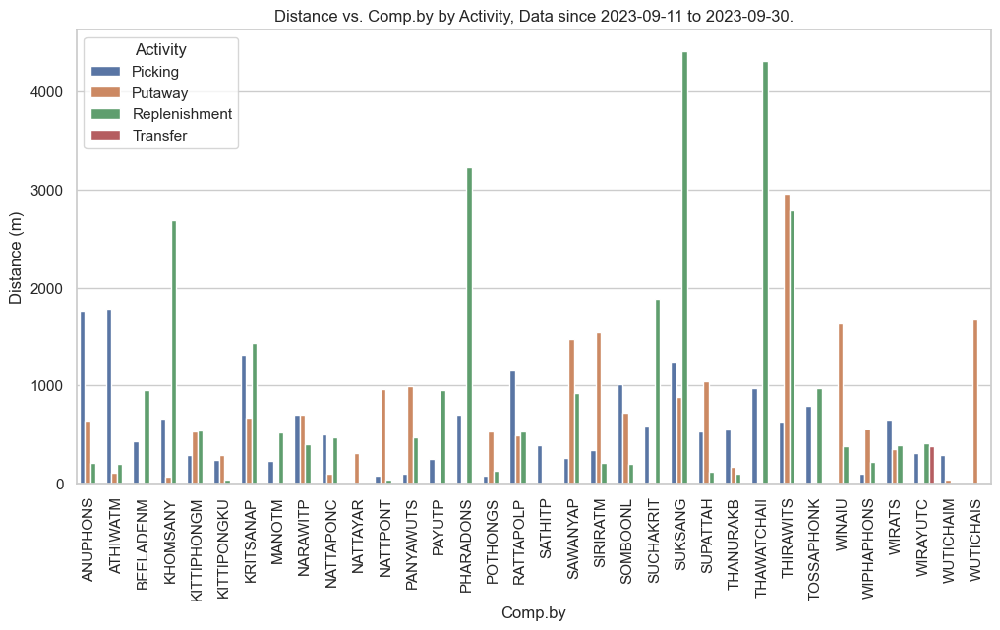

In [322]:
# Set the style for the plot
sns.set(style="whitegrid")
# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
sns.barplot(x='Comp.by', y='Distance(m)', hue='Activity', data=pivot_table2_1)
# Add labels and title
plt.xlabel('Comp.by')
plt.ylabel('Distance (m)')
plt.title(f'Distance vs. Comp.by by Activity, Data since {min_date} to {max_date}.')
# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)
# Show the plot
plt.show()

In [323]:
pivot_table2_1[pivot_table2_1['Activity']=='Transfer']

,Comp.by,Activity,Count_TO,Distance(m),time_diff,Distance/Count_TO,time/Count_TO,Distance/time
84,WIRAYUTC,Transfer,1,382.475843,25942.0,382.475843,25942.0,0.014743


###### Each activity per chart

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

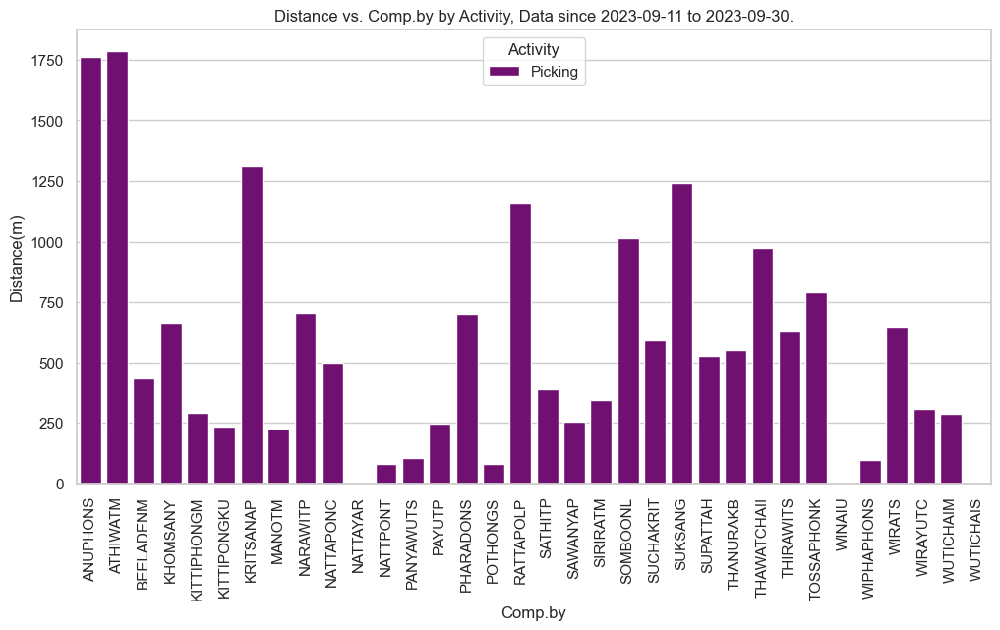

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

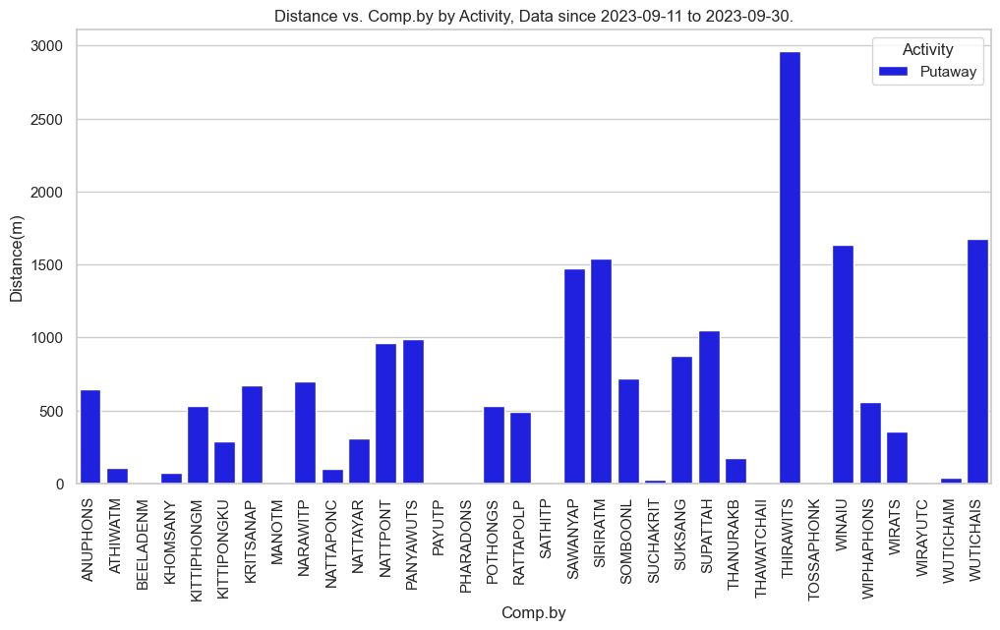

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

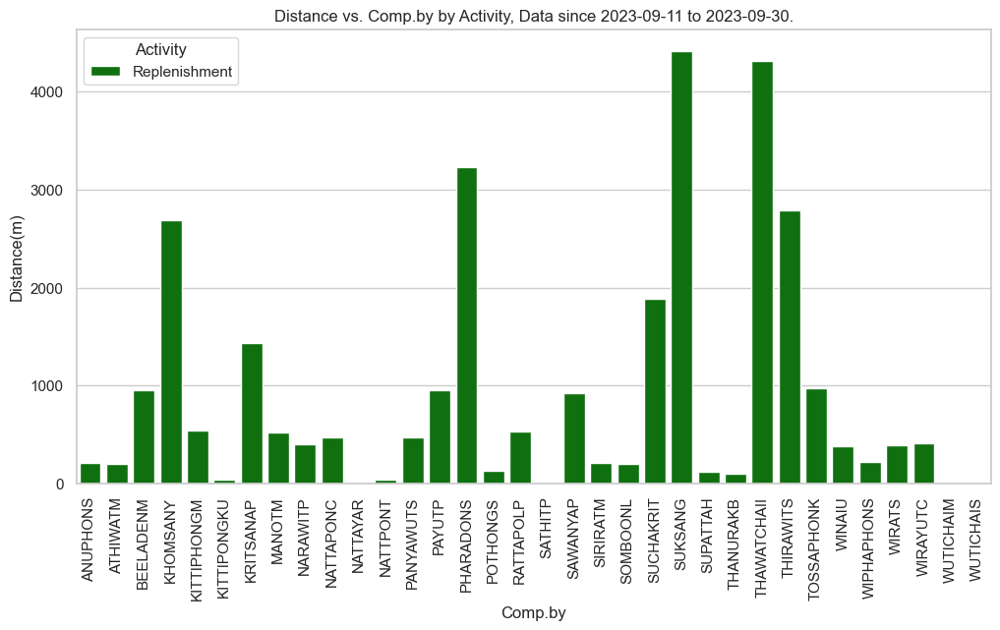

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

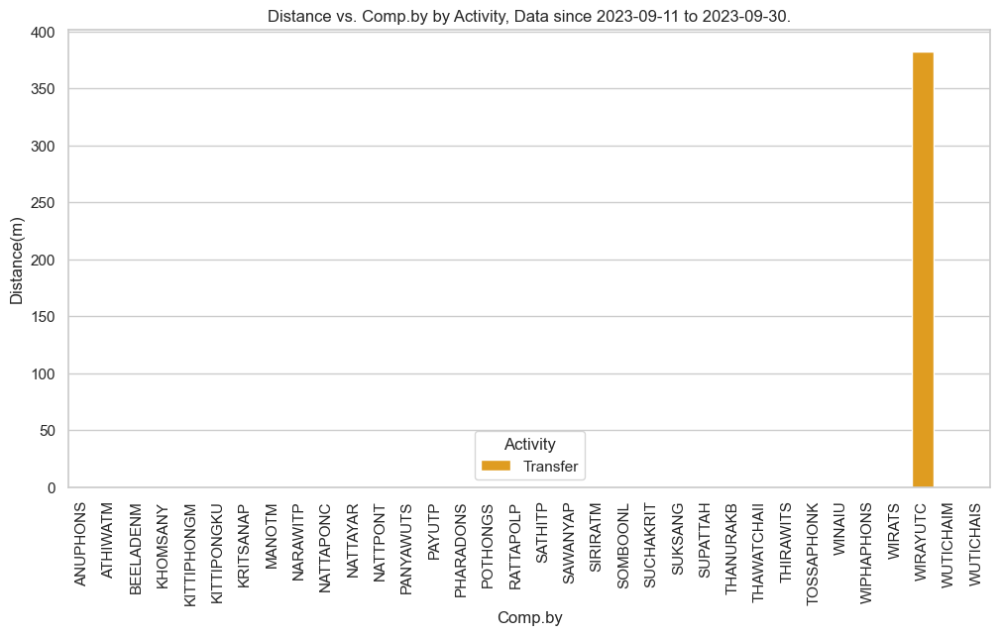

In [324]:
unique_act = list(pivot_table2_1['Activity'].unique())

# Create a master list of all unique 'Comp.by' values
all_comp_by_values = pivot_table2_1['Comp.by'].unique()

# Define a custom color dictionary for each activity
color_dict = {
    0: 'purple',
    1: 'blue',
    2: 'green',
    3: 'orange',
}

for i, act in enumerate(unique_act):
    # Create a DataFrame for the current activity with all unique 'Comp.by' values
    data = pd.DataFrame({'Comp.by': all_comp_by_values})
    data = pd.merge(data, pivot_table2_1[pivot_table2_1['Activity'] == act], on='Comp.by', how='left')

    # Set the style for the plot
    sns.set(style="whitegrid")

    # Create the bar plot using Seaborn and specify custom colors
    plt.figure(figsize=(12, 6))  # Set the figure size
    sns.barplot(x='Comp.by', y='Distance(m)', hue='Activity', data=data, palette=[color_dict[i]])

    # Add labels and title
    plt.xlabel('Comp.by')
    plt.ylabel('Distance(m)')
    plt.title(f'Distance vs. Comp.by by Activity, Data since {min_date} to {max_date}.')
    # Rotate the x-axis labels for better readability
    plt.xticks(range(len(all_comp_by_values)), all_comp_by_values, rotation=90)  # Use master list for x-axis ticks
    # Show the plot
    plt.show()


##### Distance/Count_TO

###### All activity in 1 chart

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

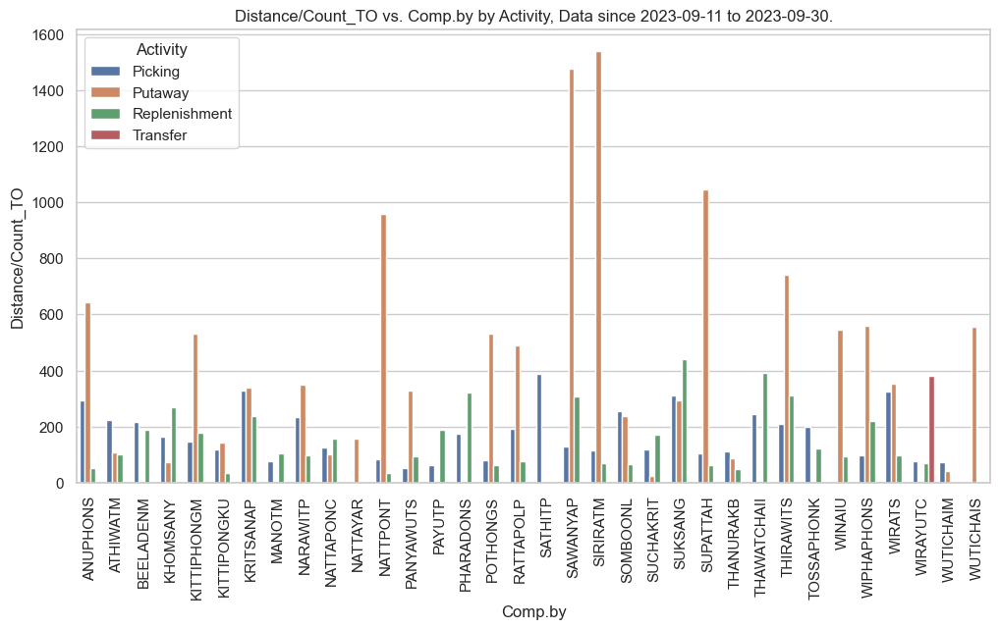

In [325]:
# Set the style for the plot
sns.set(style="whitegrid")
# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
sns.barplot(x='Comp.by', y='Distance/Count_TO', hue='Activity', data=pivot_table2_1)
# Add labels and title
plt.xlabel('Comp.by')
plt.ylabel('Distance/Count_TO')
plt.title(f'Distance/Count_TO vs. Comp.by by Activity, Data since {min_date} to {max_date}.')
# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)
# Show the plot
plt.show()

###### Each activity per chart

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

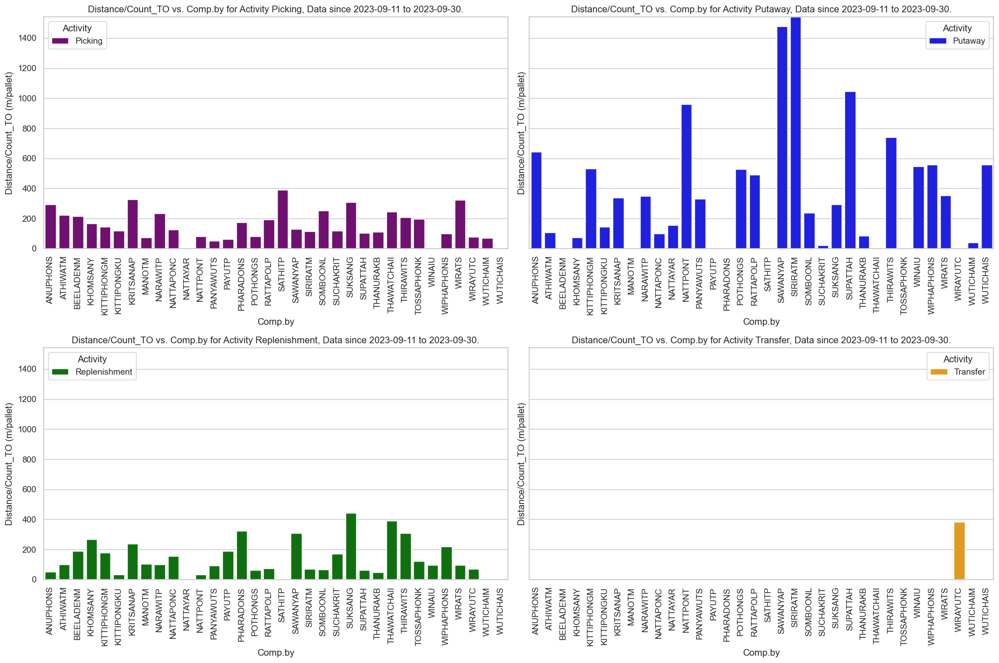

In [326]:
unique_act = list(pivot_table2_1['Activity'].unique())

# Create a master list of all unique 'Comp.by' values
all_comp_by_values = pivot_table2_1['Comp.by'].unique()

# Define a custom color dictionary for each activity
color_dict = {
    0: 'purple',
    1: 'blue',
    2: 'green',
    3: 'orange',
}

# Calculate the number of subplots needed
num_subplots = int(np.ceil(len(unique_act) / 2))

# Set up subplots with shared y-axis
fig, axes = plt.subplots(nrows=num_subplots, ncols=2, figsize=(18, 6 * num_subplots), sharey=True)

# Manually set the y-axis limits to a common range
y_axis_range = (0, pivot_table2_1['Distance/Count_TO'].max())  # Adjust this range as needed

for i, act in enumerate(unique_act):
    # Create a DataFrame for the current activity with all unique 'Comp.by' values
    data = pd.DataFrame({'Comp.by': all_comp_by_values})
    data = pd.merge(data, pivot_table2_1[pivot_table2_1['Activity'] == act], on='Comp.by', how='left')

    # Set the style for the plot
    sns.set(style="whitegrid")

    # Create the bar plot using Seaborn and specify custom colors
    row = i // 2  # Calculate the row index for 2D indexing
    col = i % 2   # Calculate the column index for 2D indexing
    sns.barplot(x='Comp.by', y='Distance/Count_TO', hue='Activity', data=data, palette=[color_dict[i]], ax=axes[row, col])

    # Set y-axis limits
    axes[row, col].set_ylim(y_axis_range)

    # Add labels and title
    axes[row, col].set_xlabel('Comp.by')
    axes[row, col].set_ylabel('Distance/Count_TO (m/pallet)')
    axes[row, col].set_title(f'Distance/Count_TO vs. Comp.by for Activity {act}, Data since {min_date} to {max_date}.')
    # Rotate the x-axis labels for better readability
    axes[row, col].set_xticks(range(len(all_comp_by_values)))  # Use master list for x-axis ticks
    axes[row, col].set_xticklabels(all_comp_by_values, rotation=90)

    # Label only the left y-axis
    if col == 0:
        axes[row, col].set_ylabel('Distance/Count_TO (m/pallet)')

# Adjust layout to prevent clipping
plt.tight_layout()

# Show the plot
plt.show()


### Graph pattern 2
Note
for comparing between graph pattern 1 & 2 to prove that which one gave the shortest distance

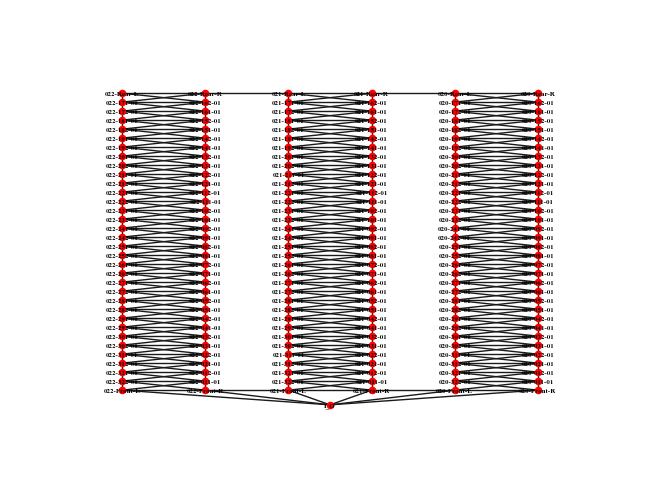

Total Weight: 102.17979137600003
[['I_O', '022-Front-R', '022-011-01', '022-321-01', '022-312-01', '022-311-01', '022-302-01', '022-301-01', '022-292-01'], ['022-292-01', '022-301-01', '022-302-01', '022-311-01', '022-312-01', '022-321-01', '022-011-01', '022-Front-R', 'I_O'], ['I_O', '021-Front-L', '021-322-01', '021-321-01', '021-312-01', '021-311-01', '021-302-01', '021-301-01', '021-292-01', '021-291-01', '021-282-01', '021-281-01', '021-272-01', '021-271-01', '021-262-01', '021-261-01', '021-252-01', '021-251-01', '021-242-01', '021-241-01', '021-232-01', '021-231-01', '021-222-01', '021-221-01', '021-212-01', '021-211-01', '021-202-01', '021-201-01', '021-192-01'], ['021-192-01', '021-201-01', '021-202-01', '021-211-01', '021-212-01', '021-221-01', '021-222-01', '021-231-01', '021-232-01', '021-241-01', '021-242-01', '021-251-01', '021-252-01', '021-261-01', '021-262-01', '021-271-01', '021-272-01', '021-281-01', '021-282-01', '021-291-01', '021-292-01', '021-301-01', '021-302-01

,Comp.Date,Distance(m),Comp.by
0,2023-09-11,102.179791,ANUPHONS
1,2023-09-14,68.265467,ANUPHONS
2,2023-09-18,959.790961,ANUPHONS
3,2023-09-19,644.621895,ANUPHONS
4,2023-09-26,56.398858,ANUPHONS
...,...,...,...
253,2023-09-28,80.898858,WUTICHAIM
254,2023-09-29,72.828649,WUTICHAIM
255,2023-09-12,1131.948606,WUTICHAIS
256,2023-09-21,495.310127,WUTICHAIS


In [327]:
graph, pos, node_labels, node_colors = create_graph(graph_pattern=1)
all_weight_df1 = sum_df1(concat_user_dic,graph)

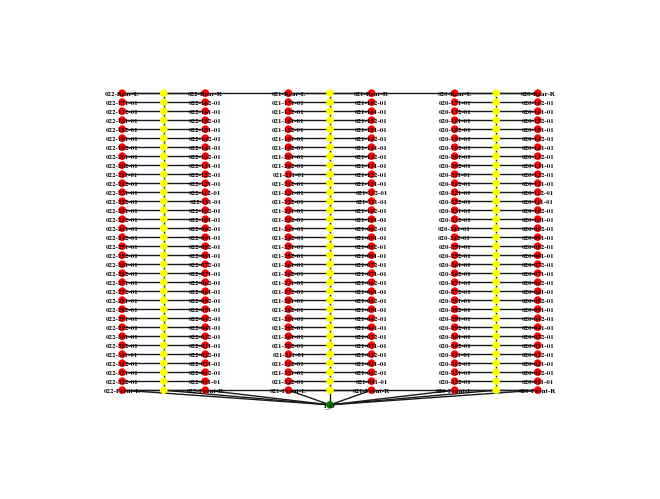

Total Weight: 105.94911064000003
[['I_O', '022-Front-Mid', '022-322-01_to_022-011-01', '022-321-01_to_022-012-01', '022-312-01_to_022-021-01', '022-311-01_to_022-022-01', '022-302-01_to_022-031-01', '022-301-01_to_022-032-01', '022-292-01_to_022-041-01', '022-292-01'], ['022-292-01', '022-292-01_to_022-041-01', '022-301-01_to_022-032-01', '022-302-01_to_022-031-01', '022-311-01_to_022-022-01', '022-312-01_to_022-021-01', '022-321-01_to_022-012-01', '022-322-01_to_022-011-01', '022-Front-Mid', 'I_O'], ['I_O', '021-Front-Mid', '021-322-01_to_021-011-01', '021-321-01_to_021-012-01', '021-312-01_to_021-021-01', '021-311-01_to_021-022-01', '021-302-01_to_021-031-01', '021-301-01_to_021-032-01', '021-292-01_to_021-041-01', '021-291-01_to_021-042-01', '021-282-01_to_021-051-01', '021-281-01_to_021-052-01', '021-272-01_to_021-061-01', '021-271-01_to_021-062-01', '021-262-01_to_021-071-01', '021-261-01_to_021-072-01', '021-252-01_to_021-081-01', '021-251-01_to_021-082-01', '021-242-01_to_021-09

,Comp.Date,Distance(m),Comp.by
0,2023-09-11,105.949111,ANUPHONS
1,2023-09-14,71.250000,ANUPHONS
2,2023-09-18,1023.239328,ANUPHONS
3,2023-09-19,690.039328,ANUPHONS
4,2023-09-26,62.199111,ANUPHONS
...,...,...,...
253,2023-09-28,86.699111,WUTICHAIM
254,2023-09-29,82.398221,WUTICHAIM
255,2023-09-12,1243.430434,WUTICHAIS
256,2023-09-21,553.835770,WUTICHAIS


In [328]:
graph2, pos2, node_labels2, node_colors2 = create_graph(graph_pattern=2)
all_weight_df2 = sum_df1(concat_user_dic,graph2)

In [329]:
# compare between graph pattern1&2
distant1 = all_weight_df1['Distance(m)'].sum()
distant2 = all_weight_df2['Distance(m)'].sum()

print('Sum distant of graph pattern 1:',distant1)
print('Sum distant of graph pattern 2:',distant2)

Distant_diff = all_weight_df1['Distance(m)'] - all_weight_df2['Distance(m)']
print(Distant_diff)

print(len(Distant_diff[Distant_diff >= 0]))
# graph 1 gives shorter distance

Sum distant of graph pattern 1: 68888.10874444003
Sum distant of graph pattern 2: 73759.31341408002
0       -3.769319
1       -2.984533
2      -63.448366
3      -45.417433
4       -5.800253
          ...    
253     -5.800253
254     -9.569572
255   -111.481828
256    -58.525643
257     -9.338891
Name: Distance(m), Length: 258, dtype: float64
0


## 5. Ranking each activity

In [330]:
pivot_table2_1.loc[:,'pallet/hr'] = 1/(pivot_table2_1['time/Count_TO']/3600)
pivot_table2_1

,Comp.by,Activity,Count_TO,Distance(m),time_diff,Distance/Count_TO,time/Count_TO,Distance/time,pallet/hr
0,ANUPHONS,Picking,6,1763.441283,1145.0,293.906881,190.833333,1.540123,18.864629
1,ANUPHONS,Putaway,1,644.621895,347.0,644.621895,347.000000,1.857700,10.374640
2,ANUPHONS,Replenishment,4,206.013753,353.0,51.503438,88.250000,0.583608,40.793201
3,ATHIWATM,Picking,8,1786.771297,4053.0,223.346412,506.625000,0.440852,7.105848
4,ATHIWATM,Putaway,1,109.019687,3.0,109.019687,3.000000,36.339896,1200.000000
...,...,...,...,...,...,...,...,...,...
83,WIRAYUTC,Replenishment,6,411.226365,1049.0,68.537727,174.833333,0.392018,20.591039
84,WIRAYUTC,Transfer,1,382.475843,25942.0,382.475843,25942.000000,0.014743,0.138771
85,WUTICHAIM,Picking,4,287.806156,1650.0,71.951539,412.500000,0.174428,8.727273
86,WUTICHAIM,Putaway,1,40.829791,749.0,40.829791,749.000000,0.054512,4.806409


### Rank by Distance/Count_TO (Smallest to Largest)
Note
time in seconds unit

In [331]:
dic_rank_act = {}
for act in unique_act:
    rank = pivot_table2_1[pivot_table2_1['Activity'] == act].sort_values('Distance/Count_TO',ascending=True)
    rank = rank.loc[:,['Comp.by','Activity','Count_TO',
                       'Distance/Count_TO','time/Count_TO','Distance/time',
                       'pallet/hr']]
    print(act,'row#:',rank.shape[0])
    display(rank.head())

Picking row#: 31


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time,pallet/hr
32,PANYAWUTS,Picking,2,51.854791,115.50,0.448959,31.168831
35,PAYUTP,Picking,4,61.863139,129.25,0.478632,27.852998
85,WUTICHAIM,Picking,4,71.951539,412.50,0.174428,8.727273
20,MANOTM,Picking,3,75.758788,80.00,0.946985,45.000000
82,WIRAYUTC,Picking,4,77.027265,435.75,0.176769,8.261618


Putaway row#: 26


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time,pallet/hr
56,SUCHAKRIT,Putaway,1,23.679791,56.0,0.422853,64.285714
86,WUTICHAIM,Putaway,1,40.829791,749.0,0.054512,4.806409
9,KHOMSANY,Putaway,1,72.397145,9.0,8.044127,400.000000
65,THANURAKB,Putaway,2,85.873858,3.5,24.535388,1028.571429
26,NATTAPONC,Putaway,1,99.678649,3.0,33.226216,1200.000000


Replenishment row#: 30


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time,pallet/hr
31,NATTPONT,Replenishment,1,34.400000,164.00,0.209756,21.951220
16,KITTIPONGKU,Replenishment,1,34.400000,139.00,0.247482,25.899281
66,THANURAKB,Replenishment,2,47.434844,42.00,1.129401,85.714286
2,ANUPHONS,Replenishment,4,51.503438,88.25,0.583608,40.793201
63,SUPATTAH,Replenishment,2,61.069377,25.50,2.394878,141.176471


Transfer row#: 1


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time,pallet/hr
84,WIRAYUTC,Transfer,1,382.475843,25942.0,0.014743,0.138771


### Rank by time/Count_TO (Smallest to Largest)

In [332]:
dic_rank_act = {}
for act in unique_act:
    rank = pivot_table2_1[pivot_table2_1['Activity'] == act].sort_values('time/Count_TO',ascending=True)
    rank = rank.loc[:,['Comp.by','Activity','Count_TO',
                       'Distance/Count_TO','time/Count_TO','Distance/time',
                       'pallet/hr']]
    print(act,'row#:',rank.shape[0])
    display(rank.head())

Picking row#: 31


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time,pallet/hr
29,NATTPONT,Picking,1,82.579791,30.000000,2.752660,120.000000
49,SIRIRATM,Picking,3,114.702433,41.666667,2.752858,86.400000
64,THANURAKB,Picking,5,110.692919,47.000000,2.355168,76.595745
76,WIPHAPHONS,Picking,1,98.300000,50.000000,1.966000,72.000000
61,SUPATTAH,Picking,5,105.184940,56.000000,1.878303,64.285714


Putaway row#: 26


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time,pallet/hr
4,ATHIWATM,Putaway,1,109.019687,3.0,36.339896,1200.000000
26,NATTAPONC,Putaway,1,99.678649,3.0,33.226216,1200.000000
65,THANURAKB,Putaway,2,85.873858,3.5,24.535388,1028.571429
15,KITTIPONGKU,Putaway,2,144.364325,6.5,22.209896,553.846154
9,KHOMSANY,Putaway,1,72.397145,9.0,8.044127,400.000000


Replenishment row#: 30


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time,pallet/hr
63,SUPATTAH,Replenishment,2,61.069377,25.50,2.394878,141.176471
66,THANURAKB,Replenishment,2,47.434844,42.00,1.129401,85.714286
75,WINAIU,Replenishment,4,94.697629,59.00,1.605045,61.016949
2,ANUPHONS,Replenishment,4,51.503438,88.25,0.583608,40.793201
51,SIRIRATM,Replenishment,3,68.648858,126.00,0.544832,28.571429


Transfer row#: 1


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time,pallet/hr
84,WIRAYUTC,Transfer,1,382.475843,25942.0,0.014743,0.138771


### Rank by Distance/time (Largest to Smallest)

In [333]:
dic_rank_act = {}
for act in unique_act:
    rank = pivot_table2_1[pivot_table2_1['Activity'] == act].sort_values('Distance/time',ascending=False)
    rank = rank.loc[:,['Comp.by','Activity','Count_TO',
                       'Distance/Count_TO','time/Count_TO','Distance/time',
                       'pallet/hr']]
    print(act,'row#:',rank.shape[0])
    display(rank.head())

Picking row#: 31


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time,pallet/hr
49,SIRIRATM,Picking,3,114.702433,41.666667,2.752858,86.400000
29,NATTPONT,Picking,1,82.579791,30.000000,2.752660,120.000000
64,THANURAKB,Picking,5,110.692919,47.000000,2.355168,76.595745
76,WIPHAPHONS,Picking,1,98.300000,50.000000,1.966000,72.000000
61,SUPATTAH,Picking,5,105.184940,56.000000,1.878303,64.285714


Putaway row#: 26


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time,pallet/hr
4,ATHIWATM,Putaway,1,109.019687,3.0,36.339896,1200.000000
26,NATTAPONC,Putaway,1,99.678649,3.0,33.226216,1200.000000
18,KRITSANAP,Putaway,2,337.206442,10.5,32.114899,342.857143
12,KITTIPHONGM,Putaway,1,532.650000,17.0,31.332353,211.764706
65,THANURAKB,Putaway,2,85.873858,3.5,24.535388,1028.571429


Replenishment row#: 30


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time,pallet/hr
63,SUPATTAH,Replenishment,2,61.069377,25.500000,2.394878,141.176471
75,WINAIU,Replenishment,4,94.697629,59.000000,1.605045,61.016949
66,THANURAKB,Replenishment,2,47.434844,42.000000,1.129401,85.714286
68,THAWATCHAII,Replenishment,11,392.036720,633.090909,0.619242,5.686387
19,KRITSANAP,Replenishment,6,238.187930,395.333333,0.602499,9.106239


Transfer row#: 1


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time,pallet/hr
84,WIRAYUTC,Transfer,1,382.475843,25942.0,0.014743,0.138771


## 6. Find Mean, Median, Mode of each activity

In [334]:
sum_df2_1 = sum_df2.loc[:,['TO Number.', 
                           'Comp._Datetime', 
                           'Comp.Date', 
                           'Comp.by', 
                           'Activity', 
                           'time_diff', 
                           'Distance(m)', 
                           'Cal_t (sec)', 
                           'IsCal_t_longer']]
#sum_df2_1['Distance/time'] = sum_df2_1['Distance(m)']/sum_df2_1['time_diff']
sum_df2_1

,TO Number.,Comp._Datetime,Comp.Date,Comp.by,Activity,time_diff,Distance(m),Cal_t (sec),IsCal_t_longer
9,74544559.0,2023-09-11 13:56:35,2023-09-11,ANUPHONS,Picking,28.0,31.029791,15.958178,0
10,74545552.0,2023-09-11 15:14:42,2023-09-11,ANUPHONS,Picking,53.0,71.150000,36.591429,0
11,74632067.0,2023-09-18 21:43:01,2023-09-18,ANUPHONS,Picking,41.0,35.929791,18.478178,0
12,74632068.0,2023-09-18 21:42:17,2023-09-18,ANUPHONS,Picking,22.0,80.898858,41.605127,1
13,74632069.0,2023-09-18 21:41:51,2023-09-18,ANUPHONS,Picking,30.0,75.998858,39.085127,1
...,...,...,...,...,...,...,...,...,...
1824,74669468.0,2023-09-21 13:01:36,2023-09-21,WUTICHAIS,Putaway,21.0,56.398858,29.005127,1
1825,74669470.0,2023-09-21 13:02:50,2023-09-21,WUTICHAIS,Putaway,2.0,97.204220,49.990742,1
1828,74727018.0,2023-09-26 18:13:23,2023-09-26,WUTICHAIS,Putaway,3.0,8.164896,4.199089,1
1829,74727019.0,2023-09-26 18:14:38,2023-09-26,WUTICHAIS,Putaway,2.0,16.329791,8.398178,1


### Calculate by not consider the different of user

In [335]:
avg = []
median = []
mode = []
sd = []
for act in unique_act:
    col1 = 'time_diff'
    col2 = 'Distance(m)'
    col3 = 'Cal_t (sec)'
    sum_df2_1_act = sum_df2_1[sum_df2_1['Activity'] == act]

    mean_values = [act] + list(sum_df2_1_act[[col1, col2, col3]].mean())
    median_values = [act] + list(sum_df2_1_act[[col1, col2, col3]].median())
    mode_values = [act] + list(sum_df2_1_act[[col1, col2, col3]].mode().iloc[0])
    sd_values = [act] + list(sum_df2_1_act[[col1, col2, col3]].std())
    avg.append(mean_values)
    median.append(median_values)
    mode.append(mode_values)
    sd.append(sd_values)

# Convert the lists of lists to DataFrames
Coln1 = 'Activity'
df_avg = pd.DataFrame(avg, columns=[Coln1, col1, col2, col3])
df_avg['Cal'] = 'Mean'
df_median = pd.DataFrame(median, columns=[Coln1, col1, col2, col3])
df_median['Cal'] = 'Median'
df_mode = pd.DataFrame(mode, columns=[Coln1, col1, col2, col3])
df_mode['Cal'] = 'Mode'
df_sd = pd.DataFrame(sd, columns=[Coln1, col1, col2, col3])
df_sd['Cal'] = 'SD'

# Combine the DataFrames into a single DataFrame
result_df = pd.concat([df_avg, df_median, df_mode, df_sd], axis=0)

In [336]:
result_df

,Activity,time_diff,Distance(m),Cal_t (sec),Cal
0,Picking,155.544000,50.501550,25.972226,Mean
1,Putaway,14.368550,47.854105,24.610682,Mean
2,Replenishment,116.359066,54.023216,27.783368,Mean
3,Transfer,3706.000000,54.639406,28.100266,Mean
0,Picking,88.000000,49.100000,25.251429,Median
1,Putaway,3.000000,46.164325,23.741653,Median
2,Replenishment,95.000000,54.805934,28.185909,Median
3,Transfer,3706.000000,63.748858,32.785127,Median
0,Picking,17.000000,58.848858,30.265127,Mode
1,Putaway,2.000000,33.914325,17.441653,Mode


In [337]:
result_df_1 = result_df.sort_values('Activity')
result_df_1 = result_df_1.iloc[:,[0,-1,1,2,3]]
result_df_1

,Activity,Cal,time_diff,Distance(m),Cal_t (sec)
0,Picking,Mean,155.544000,50.501550,25.972226
0,Picking,Median,88.000000,49.100000,25.251429
0,Picking,Mode,17.000000,58.848858,30.265127
0,Picking,SD,252.546332,21.516256,11.065503
1,Putaway,Mean,14.368550,47.854105,24.610682
1,Putaway,Median,3.000000,46.164325,23.741653
1,Putaway,Mode,2.000000,33.914325,17.441653
1,Putaway,SD,47.627938,21.459062,11.036089
2,Replenishment,Mean,116.359066,54.023216,27.783368
2,Replenishment,Median,95.000000,54.805934,28.185909


In [338]:
for act in unique_act:
    result_df_2 = result_df[result_df['Activity'] == act]
    result_df_2.set_index('Activity', inplace=True)
    result_df_2 = result_df_2.loc[:,['Cal', 'time_diff', 'Distance(m)', 'Cal_t (sec)']]
    #result_df_2 = result_df_2.transpose()
    display(result_df_2)

,Cal,time_diff,Distance(m),Cal_t (sec)
Activity,,,,
Picking,Mean,155.544000,50.501550,25.972226
Picking,Median,88.000000,49.100000,25.251429
Picking,Mode,17.000000,58.848858,30.265127
Picking,SD,252.546332,21.516256,11.065503


,Cal,time_diff,Distance(m),Cal_t (sec)
Activity,,,,
Putaway,Mean,14.368550,47.854105,24.610682
Putaway,Median,3.000000,46.164325,23.741653
Putaway,Mode,2.000000,33.914325,17.441653
Putaway,SD,47.627938,21.459062,11.036089


,Cal,time_diff,Distance(m),Cal_t (sec)
Activity,,,,
Replenishment,Mean,116.359066,54.023216,27.783368
Replenishment,Median,95.000000,54.805934,28.185909
Replenishment,Mode,85.000000,42.899429,22.062563
Replenishment,SD,118.165901,23.089940,11.874826


,Cal,time_diff,Distance(m),Cal_t (sec)
Activity,,,,
Transfer,Mean,3706.0,54.639406,28.100266
Transfer,Median,3706.0,63.748858,32.785127
Transfer,Mode,3706.0,24.548858,12.625127
Transfer,SD,0.0,21.803820,11.213393


### Plot Histogram

Picking row#: 31


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time
49,SIRIRATM,Picking,3,114.702433,41.666667,2.752858
29,NATTPONT,Picking,1,82.579791,30.000000,2.752660
64,THANURAKB,Picking,5,110.692919,47.000000,2.355168
76,WIPHAPHONS,Picking,1,98.300000,50.000000,1.966000
61,SUPATTAH,Picking,5,105.184940,56.000000,1.878303


Putaway row#: 26


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time
4,ATHIWATM,Putaway,1,109.019687,3.0,36.339896
26,NATTAPONC,Putaway,1,99.678649,3.0,33.226216
18,KRITSANAP,Putaway,2,337.206442,10.5,32.114899
12,KITTIPHONGM,Putaway,1,532.650000,17.0,31.332353
65,THANURAKB,Putaway,2,85.873858,3.5,24.535388


Replenishment row#: 30


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time
63,SUPATTAH,Replenishment,2,61.069377,25.500000,2.394878
75,WINAIU,Replenishment,4,94.697629,59.000000,1.605045
66,THANURAKB,Replenishment,2,47.434844,42.000000,1.129401
68,THAWATCHAII,Replenishment,11,392.036720,633.090909,0.619242
19,KRITSANAP,Replenishment,6,238.187930,395.333333,0.602499


Transfer row#: 1


,Comp.by,Activity,Count_TO,Distance/Count_TO,time/Count_TO,Distance/time
84,WIRAYUTC,Transfer,1,382.475843,25942.0,0.014743


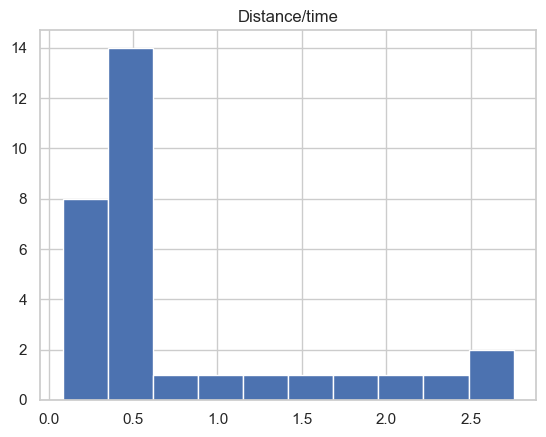

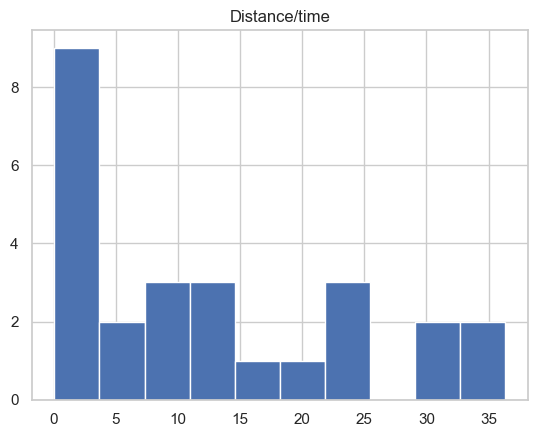

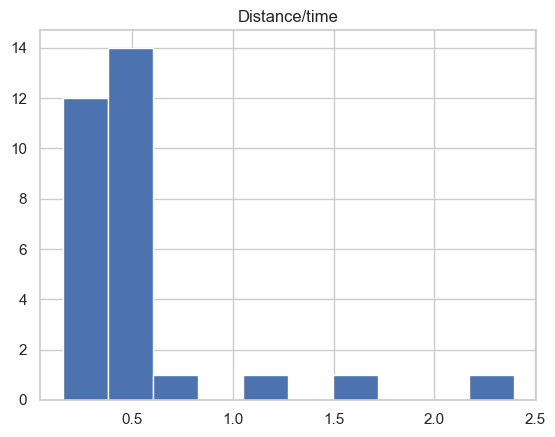

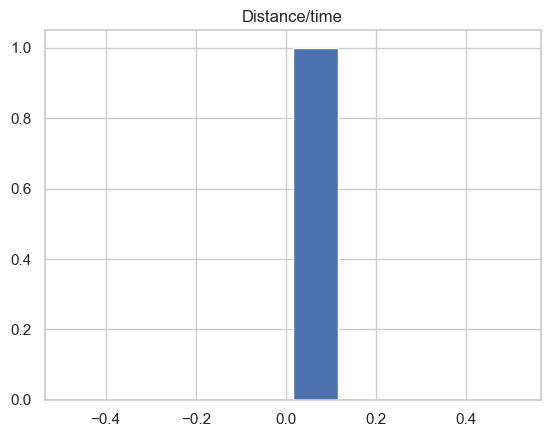

In [339]:
dic_rank_act = {}
for act in unique_act:
    rank = pivot_table2_1[pivot_table2_1['Activity'] == act].sort_values('Distance/time',ascending=False)
    rank = rank.loc[:,['Comp.by','Activity','Count_TO','Distance/Count_TO','time/Count_TO','Distance/time']]
    print(act,'row#:',rank.shape[0])
    display(rank.head())
    rank.hist(column='Distance/time')
    #break

Picking row#: 375
Putaway row#: 407
Replenishment row#: 557
Transfer row#: 7


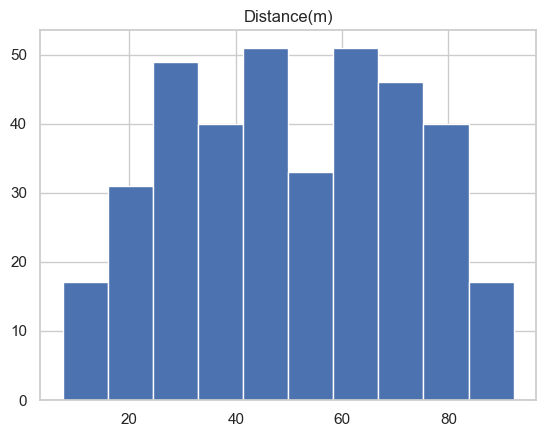

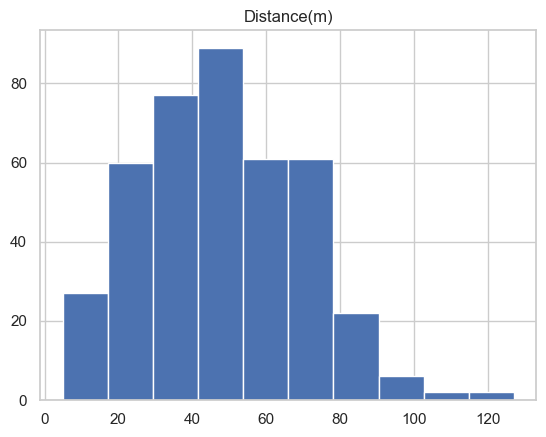

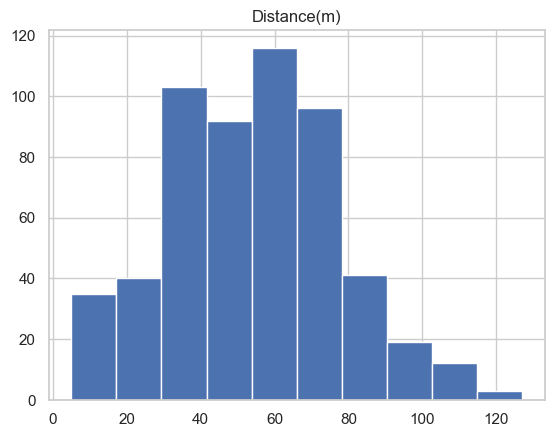

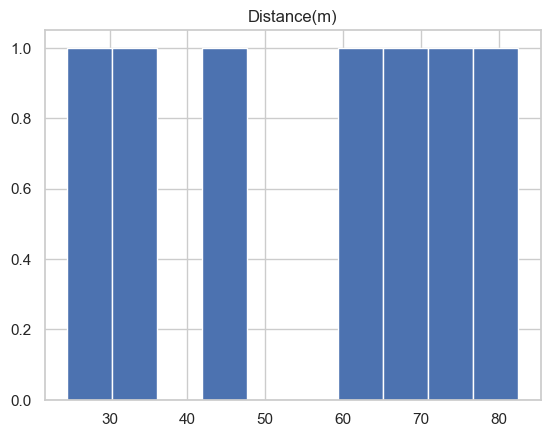

In [340]:
dic_sum_df2_1_act_act = {}
for act in unique_act:
    sum_df2_1_act = sum_df2_1[sum_df2_1['Activity'] == act]
    sum_df2_1_act = sum_df2_1_act.sort_values('Distance(m)',ascending=False)
    print(act,'row#:',sum_df2_1_act.shape[0])
    #display(sum_df2_1_act)
    sum_df2_1_act.hist(column='Distance(m)')

Picking row#: 375


,TO Number.,Comp._Datetime,Comp.Date,Comp.by,Activity,time_diff,Distance(m),Cal_t (sec),IsCal_t_longer
1062,74629877.0,2023-09-19 15:47:49,2023-09-19,SUKSANG,Picking,2160.0,58.848858,30.265127,0
805,74558542.0,2023-09-13 18:37:06,2023-09-13,SATHITP,Picking,1628.0,61.350000,31.551429,0
806,74558545.0,2023-09-13 17:08:12,2023-09-13,SATHITP,Picking,1503.0,31.898858,16.405127,0
912,74558429.0,2023-09-14 13:44:40,2023-09-14,SOMBOONL,Picking,1494.0,17.198858,8.845127,0
931,74757401.0,2023-09-28 20:33:55,2023-09-28,SOMBOONL,Picking,1490.0,88.248858,45.385127,0
...,...,...,...,...,...,...,...,...,...
348,74773506.0,2023-09-30 03:18:40,2023-09-30,KRITSANAP,Picking,11.0,83.348858,42.865127,1
349,74773507.0,2023-09-30 03:18:54,2023-09-30,KRITSANAP,Picking,9.0,73.548858,37.825127,1
610,74776894.0,2023-09-30 14:10:57,2023-09-30,PAYUTP,Picking,9.0,43.279791,22.258178,1
608,74776410.0,2023-09-30 11:19:29,2023-09-30,PAYUTP,Picking,7.0,24.600000,12.651429,1


Putaway row#: 407


,TO Number.,Comp._Datetime,Comp.Date,Comp.by,Activity,time_diff,Distance(m),Cal_t (sec),IsCal_t_longer
1732,74765749.0,2023-09-29 13:40:58,2023-09-29,WUTICHAIM,Putaway,749.0,40.829791,20.998178,0
477,74638162.0,2023-09-19 09:00:02,2023-09-19,NATTAYAR,Putaway,528.0,33.479791,17.218178,0
823,74590024.0,2023-09-14 17:14:47,2023-09-14,SAWANYAP,Putaway,167.0,69.004791,35.488178,0
923,74585915.0,2023-09-14 11:43:40,2023-09-14,SOMBOONL,Putaway,107.0,75.129791,38.638178,0
1621,74691304.0,2023-09-22 23:07:17,2023-09-22,WIPHAPHONS,Putaway,87.0,69.873858,35.935127,0
...,...,...,...,...,...,...,...,...,...
1433,74662320.0,2023-09-20 22:19:02,2023-09-20,THIRAWITS,Putaway,1.0,72.375000,37.221429,1
832,74590795.0,2023-09-14 17:35:33,2023-09-14,SAWANYAP,Putaway,1.0,48.614325,25.001653,1
229,74590978.0,2023-09-14 17:59:32,2023-09-14,KITTIPHONGM,Putaway,1.0,52.775000,27.141429,1
1763,74565136.0,2023-09-12 22:18:33,2023-09-12,WUTICHAIS,Putaway,1.0,30.673858,15.775127,1


Replenishment row#: 557


,TO Number.,Comp._Datetime,Comp.Date,Comp.by,Activity,time_diff,Distance(m),Cal_t (sec),IsCal_t_longer
976,74667183.0,2023-09-21 10:40:20,2023-09-21,SUCHAKRIT,Replenishment,1541.0,53.605362,27.568472,0
1108,74606106.0,2023-09-15 21:09:58,2023-09-15,SUKSANG,Replenishment,1253.0,52.749429,27.128278,0
969,74641749.0,2023-09-19 17:03:19,2023-09-19,SUCHAKRIT,Replenishment,1184.0,56.398858,29.005127,0
1161,74751273.0,2023-09-28 11:20:48,2023-09-28,SUKSANG,Replenishment,959.0,60.611867,31.171817,0
980,74682536.0,2023-09-22 11:45:34,2023-09-22,SUCHAKRIT,Replenishment,605.0,41.750000,21.471429,0
...,...,...,...,...,...,...,...,...,...
1220,74702854.0,2023-09-23 20:58:02,2023-09-23,SUPATTAH,Replenishment,13.0,36.339896,18.689089,1
1607,74773387.0,2023-09-30 04:57:39,2023-09-30,WINAIU,Replenishment,12.0,44.250000,22.757143,1
1600,74658774.0,2023-09-20 19:08:30,2023-09-20,WINAIU,Replenishment,12.0,42.899429,22.062563,1
1605,74772283.0,2023-09-29 22:44:20,2023-09-29,WINAIU,Replenishment,8.0,58.505362,30.088472,1


Transfer row#: 7


,TO Number.,Comp._Datetime,Comp.Date,Comp.by,Activity,time_diff,Distance(m),Cal_t (sec),IsCal_t_longer
1688,74711266.0,2023-09-26 19:49:40,2023-09-26,WIRAYUTC,Transfer,3706.0,82.479791,42.418178,0
1689,74711266.0,2023-09-26 19:54:08,2023-09-26,WIRAYUTC,Transfer,3706.0,66.198858,34.045127,0
1690,74711266.0,2023-09-26 19:55:44,2023-09-26,WIRAYUTC,Transfer,3706.0,63.748858,32.785127,0
1691,74711266.0,2023-09-26 19:46:48,2023-09-26,WIRAYUTC,Transfer,3706.0,43.370829,22.304998,0
1692,74711266.0,2023-09-26 19:48:05,2023-09-26,WIRAYUTC,Transfer,3706.0,31.029791,15.958178,0
1693,74711266.0,2023-09-26 19:51:39,2023-09-26,WIRAYUTC,Transfer,3706.0,71.098858,36.565127,0
1694,74711266.0,2023-09-26 19:58:34,2023-09-26,WIRAYUTC,Transfer,3706.0,24.548858,12.625127,0


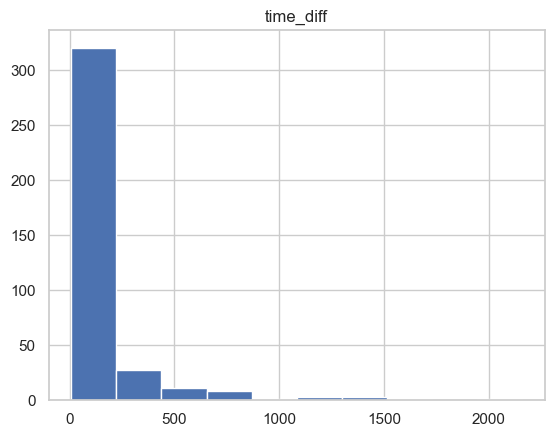

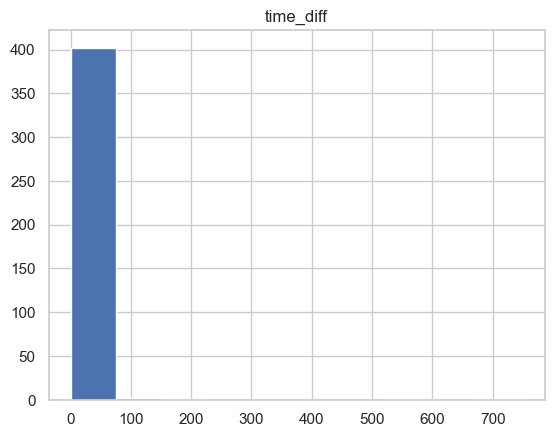

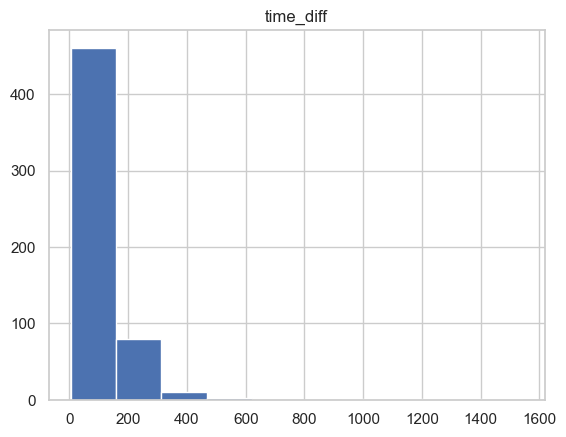

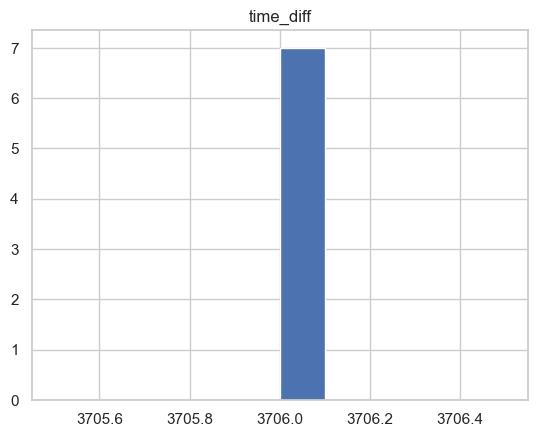

In [341]:
dic_sum_df2_1_act_act = {}
for act in unique_act:
    sum_df2_1_act = sum_df2_1[sum_df2_1['Activity'] == act]
    sum_df2_1_act = sum_df2_1_act.sort_values('time_diff',ascending=False)
    print(act,'row#:',sum_df2_1_act.shape[0])
    display(sum_df2_1_act)
    sum_df2_1_act.hist(column='time_diff')

## 7. Cut off by mean, median, mode

In [342]:
cut_off = sum_df2.copy()
lst = ['Mean','Median','Mode']
for j in lst:
    for idx, row in cut_off.iterrows():
        activity = row['Activity']

        # Filter rows from result_df_1 based on matching conditions
        selected_row = result_df_1[(result_df_1['Activity'] == activity) & (result_df_1['Cal'] == j)]

        # If a row is found in result_df_1, update the corresponding column in cut_off
        if not selected_row.empty:
            cut_off.at[idx, f'{j}_time(sec)'] = selected_row['time_diff'].values[0]
            cut_off.at[idx, f'{j}_Distance(m)'] = selected_row['Distance(m)'].values[0]
cut_off

,TO Number.,S.Type,Source BIN,Dest.Type,Dest.BIN,Comp._Datetime,Comp_Month,Comp.time,Comp.Date,Comp.by,...,time_diff,Distance(m),Cal_t (sec),IsCal_t_longer,Mean_time(sec),Mean_Distance(m),Median_time(sec),Median_Distance(m),Mode_time(sec),Mode_Distance(m)
9,74544559.0,MH8,022-292-04,200,2007391458,2023-09-11 13:56:35,9,13:56:35,2023-09-11,ANUPHONS,...,28.0,31.029791,15.958178,0,155.54400,50.501550,88.0,49.100000,17.0,58.848858
10,74545552.0,MH8,021-192-07,200,2007391524,2023-09-11 15:14:42,9,15:14:42,2023-09-11,ANUPHONS,...,53.0,71.150000,36.591429,0,155.54400,50.501550,88.0,49.100000,17.0,58.848858
11,74632067.0,MH8,020-051-02,200,2007401210,2023-09-18 21:43:01,9,21:43:01,2023-09-18,ANUPHONS,...,41.0,35.929791,18.478178,0,155.54400,50.501550,88.0,49.100000,17.0,58.848858
12,74632068.0,MH8,020-182-02,200,2007401210,2023-09-18 21:42:17,9,21:42:17,2023-09-18,ANUPHONS,...,22.0,80.898858,41.605127,1,155.54400,50.501550,88.0,49.100000,17.0,58.848858
13,74632069.0,MH8,020-192-03,200,2007401210,2023-09-18 21:41:51,9,21:41:51,2023-09-18,ANUPHONS,...,30.0,75.998858,39.085127,1,155.54400,50.501550,88.0,49.100000,17.0,58.848858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1824,74669468.0,IDP,235737594,MH8,022-102-05,2023-09-21 13:01:36,9,13:01:36,2023-09-21,WUTICHAIS,...,21.0,56.398858,29.005127,1,14.36855,47.854105,3.0,46.164325,2.0,33.914325
1825,74669470.0,IDP,235737596,MH8,022-221-04,2023-09-21 13:02:50,9,13:02:50,2023-09-21,WUTICHAIS,...,2.0,97.204220,49.990742,1,14.36855,47.854105,3.0,46.164325,2.0,33.914325
1828,74727018.0,IDP,235904611,MH8,022-322-04,2023-09-26 18:13:23,9,18:13:23,2023-09-26,WUTICHAIS,...,3.0,8.164896,4.199089,1,14.36855,47.854105,3.0,46.164325,2.0,33.914325
1829,74727019.0,IDP,235904608,MH8,022-322-05,2023-09-26 18:14:38,9,18:14:38,2023-09-26,WUTICHAIS,...,2.0,16.329791,8.398178,1,14.36855,47.854105,3.0,46.164325,2.0,33.914325


In [343]:
cut_off_1 = cut_off.loc[:,['TO Number.', 'Comp.by', 'Activity','Comp._Datetime', 'Comp.Date', 'time_diff', 'Distance(m)',
                            'Mean_time(sec)','Mean_Distance(m)',
                            'Median_time(sec)','Median_Distance(m)',
                            'Mode_time(sec)','Mode_Distance(m)']].copy()
for j in lst:
    cut_off_1.loc[:,[f'lower_{j}_time(sec)']] = np.where(cut_off_1['time_diff'] < cut_off_1[f'{j}_time(sec)'],
                                                  1, 0)
    cut_off_1.loc[:,[f'higher_{j}_Distance(m)']] = np.where(cut_off_1['Distance(m)'] >= cut_off_1[f'{j}_Distance(m)'],
                                                  1, 0)
cut_off_1

,TO Number.,Comp.by,Activity,Comp._Datetime,Comp.Date,time_diff,Distance(m),Mean_time(sec),Mean_Distance(m),Median_time(sec),Median_Distance(m),Mode_time(sec),Mode_Distance(m),lower_Mean_time(sec),higher_Mean_Distance(m),lower_Median_time(sec),higher_Median_Distance(m),lower_Mode_time(sec),higher_Mode_Distance(m)
9,74544559.0,ANUPHONS,Picking,2023-09-11 13:56:35,2023-09-11,28.0,31.029791,155.54400,50.501550,88.0,49.100000,17.0,58.848858,1,0,1,0,0,0
10,74545552.0,ANUPHONS,Picking,2023-09-11 15:14:42,2023-09-11,53.0,71.150000,155.54400,50.501550,88.0,49.100000,17.0,58.848858,1,1,1,1,0,1
11,74632067.0,ANUPHONS,Picking,2023-09-18 21:43:01,2023-09-18,41.0,35.929791,155.54400,50.501550,88.0,49.100000,17.0,58.848858,1,0,1,0,0,0
12,74632068.0,ANUPHONS,Picking,2023-09-18 21:42:17,2023-09-18,22.0,80.898858,155.54400,50.501550,88.0,49.100000,17.0,58.848858,1,1,1,1,0,1
13,74632069.0,ANUPHONS,Picking,2023-09-18 21:41:51,2023-09-18,30.0,75.998858,155.54400,50.501550,88.0,49.100000,17.0,58.848858,1,1,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1824,74669468.0,WUTICHAIS,Putaway,2023-09-21 13:01:36,2023-09-21,21.0,56.398858,14.36855,47.854105,3.0,46.164325,2.0,33.914325,0,1,0,1,0,1
1825,74669470.0,WUTICHAIS,Putaway,2023-09-21 13:02:50,2023-09-21,2.0,97.204220,14.36855,47.854105,3.0,46.164325,2.0,33.914325,1,1,1,1,0,1
1828,74727018.0,WUTICHAIS,Putaway,2023-09-26 18:13:23,2023-09-26,3.0,8.164896,14.36855,47.854105,3.0,46.164325,2.0,33.914325,1,0,0,0,0,0
1829,74727019.0,WUTICHAIS,Putaway,2023-09-26 18:14:38,2023-09-26,2.0,16.329791,14.36855,47.854105,3.0,46.164325,2.0,33.914325,1,0,1,0,0,0


mean

In [344]:
pivot_cutoff_mean = cut_off_1.pivot_table(
                    index=['Comp.by'],
                    columns='Activity',
                    values=['TO Number.','lower_Mean_time(sec)'],
                    aggfunc={'TO Number.': 'count', 'lower_Mean_time(sec)': 'sum'}, 
                    #fill_value=0
                    )
pivot_cutoff_mean = pivot_cutoff_mean.reset_index()
pivot_TO = pivot_cutoff_mean['TO Number.']
pivot_TO.loc[:,'Comp.by'] = pivot_cutoff_mean['Comp.by']

pivot_lower_Mean_time = pivot_cutoff_mean['lower_Mean_time(sec)'] 
pivot_lower_Mean_time.loc[:,'Comp.by'] = pivot_cutoff_mean['Comp.by']
pivot_lower_Mean_time = pivot_lower_Mean_time.iloc[:,[-1,0,1,2,3]]
for act in unique_act:
    pivot_lower_Mean_time[act] = pivot_lower_Mean_time[act]/pivot_TO[act]*100

pivot_lower_Mean_time

C:\Users\Lenovo Legion\AppData\Local\Temp\ipykernel_9484\755286835.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pivot_TO.loc[:,'Comp.by'] = pivot_cutoff_mean['Comp.by']
C:\Users\Lenovo Legion\AppData\Local\Temp\ipykernel_9484\755286835.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pivot_lower_Mean_time.loc[:,'Comp.by'] = pivot_cutoff_mean['Comp.by']


Activity,Comp.by,Picking,Putaway,Replenishment,Transfer
0,ANUPHONS,97.142857,0.000000,50.000000,NaN
1,ATHIWATM,80.555556,100.000000,0.000000,NaN
2,BEELADENM,100.000000,NaN,56.250000,NaN
3,KHOMSANY,84.615385,100.000000,76.595745,NaN
4,KITTIPHONGM,100.000000,100.000000,33.333333,NaN
5,KITTIPONGKU,75.000000,100.000000,0.000000,NaN
6,KRITSANAP,44.000000,100.000000,78.571429,NaN
7,MANOTM,80.000000,NaN,20.000000,NaN
8,NARAWITP,81.818182,100.000000,14.285714,NaN
9,NATTAPONC,100.000000,100.000000,60.000000,NaN


In [345]:
pivot_cutoff_mean

Comp.by TO Number.                                 \
Activity                 Picking Putaway Replenishment Transfer   
0            ANUPHONS       35.0    12.0           4.0      NaN   
1            ATHIWATM       36.0     1.0           4.0      NaN   
2           BEELADENM        8.0     NaN          16.0      NaN   
3            KHOMSANY       13.0     3.0          47.0      NaN   
4         KITTIPHONGM        7.0    10.0           9.0      NaN   
5         KITTIPONGKU        4.0     6.0           1.0      NaN   
6           KRITSANAP       25.0    10.0          28.0      NaN   
7              MANOTM        5.0     NaN          10.0      NaN   
8            NARAWITP       11.0    14.0           7.0      NaN   
9           NATTAPONC        8.0     2.0          10.0      NaN   
10           NATTAYAR        NaN    13.0           NaN      NaN   
11           NATTPONT        2.0    21.0           1.0      NaN   
12          PANYAWUTS        2.0    23.0          11.0      NaN   
13             PAYUTP        9.0     NaN          18.0      NaN   
14          PHARADONS       14.0     NaN          63.0      NaN   
15           POTHONGS        1.0    14.0           3.0      NaN   
16          RATTAPOLP       20.0    14.0          14.0      NaN   
17            SATHITP        8.0     NaN           NaN      NaN   
18           SAWANYAP        7.0    30.0          15.0      NaN   
19           SIRIRATM        6.0    28.0           3.0      NaN   
20           SOMBOONL       19.0    11.0           4.0      NaN   
21          SUCHAKRIT       10.0     1.0          37.0      NaN   
22            SUKSANG       20.0    17.0          71.0      NaN   
23           SUPATTAH       10.0    21.0           2.0      NaN   
24          THANURAKB       12.0     3.0           2.0      NaN   
25        THAWATCHAII       24.0     NaN          82.0      NaN   
26          THIRAWITS       13.0    60.0          51.0      NaN   
27         TOSSAPHONK       13.0     NaN          17.0      NaN   
28             WINAIU        NaN    34.0           8.0      NaN   
29         WIPHAPHONS        3.0    10.0           4.0      NaN   
30             WIRATS       17.0     6.0           7.0      NaN   
31           WIRAYUTC        6.0     NaN           8.0      7.0   
32          WUTICHAIM        7.0     1.0           NaN      NaN   
33          WUTICHAIS        NaN    42.0           NaN      NaN   

         lower_Mean_time(sec)                                 
Activity              Picking Putaway Replenishment Transfer  
0                        34.0     0.0           2.0      NaN  
1                        29.0     1.0           0.0      NaN  
2                         8.0     NaN           9.0      NaN  
3                        11.0     3.0          36.0      NaN  
4                         7.0    10.0           3.0      NaN  
5                         3.0     6.0           0.0      NaN  
6                        11.0    10.0          22.0      NaN  
7                         4.0     NaN           2.0      NaN  
8                         9.0    14.0           1.0      NaN  
9                         8.0     2.0           6.0      NaN  
10                        NaN     1.0           NaN      NaN  
11                        2.0    12.0           0.0      NaN  
12                        2.0    23.0           6.0      NaN  
13                        8.0     NaN           3.0      NaN  
14                       12.0     NaN          50.0      NaN  
15                        1.0    14.0           0.0      NaN  
16                       18.0    14.0          11.0      NaN  
17                        1.0     NaN           NaN      NaN  
18                        7.0    29.0           9.0      NaN  
19                        6.0    26.0           1.0      NaN  
20                        6.0     4.0           1.0      NaN  
21                        8.0     0.0          22.0      NaN  
22                       13.0    15.0          46.0      NaN  
23                       1

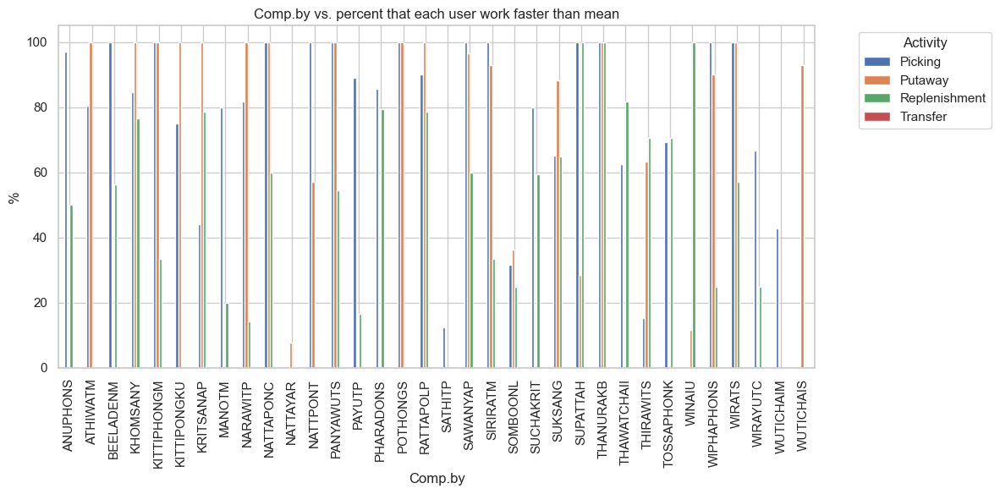

In [346]:
pivot_lower_Mean_time.plot(kind='bar', x='Comp.by', y=['Picking','Putaway','Replenishment','Transfer'], 
                           #hue='Activity', 
                           figsize=(12, 6)
                           )
plt.xlabel('Comp.by')
plt.ylabel('%')
plt.title('Comp.by vs. percent that each user work faster than mean')
plt.xticks(rotation=90)
plt.legend(title='Activity', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

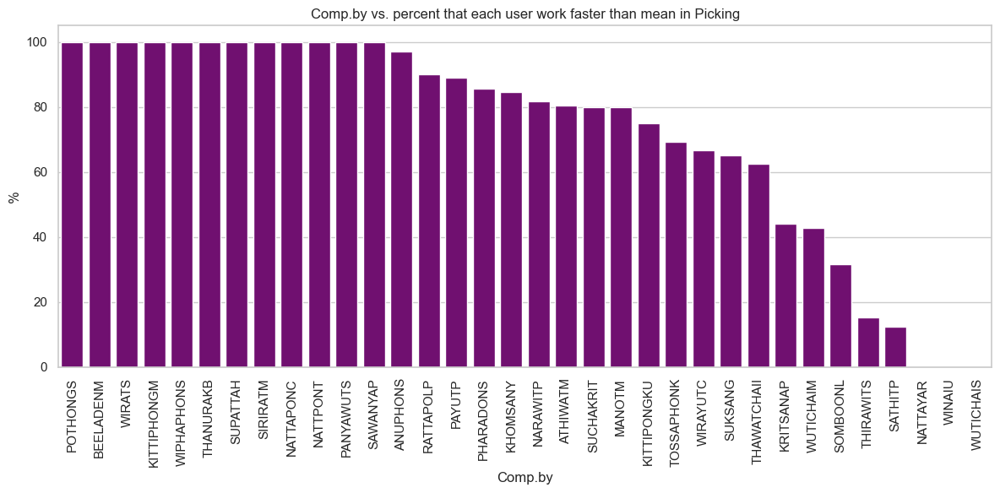

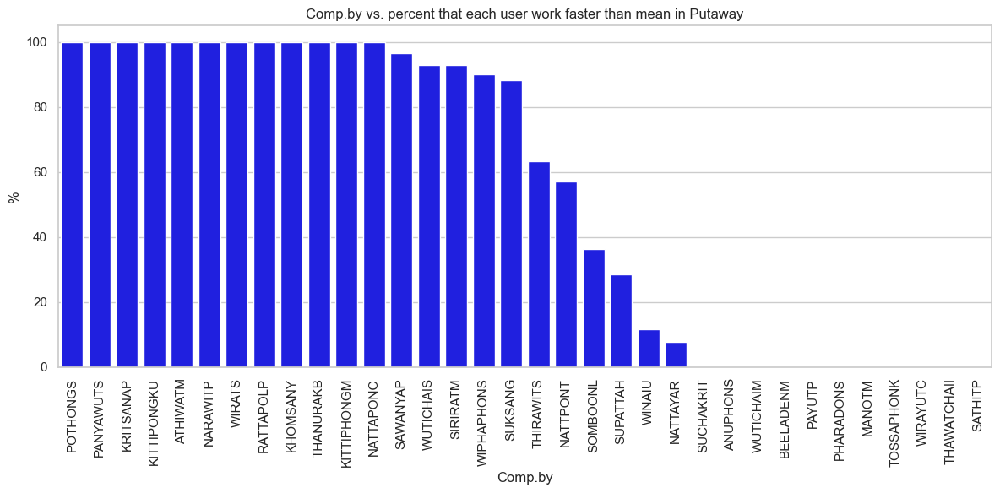

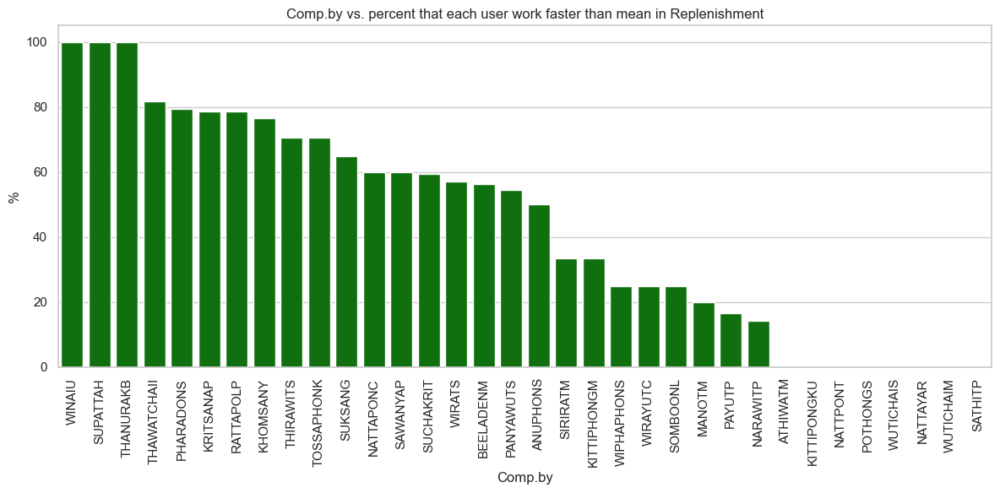

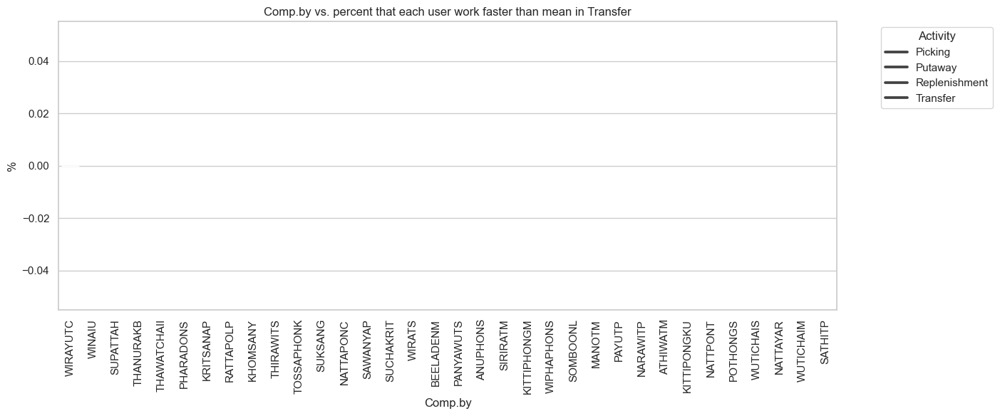

In [347]:
for i, act in enumerate(unique_act):
    # Sort the pivot table by the specified activity in descending order
    pivot_lower_Mean_time = pivot_lower_Mean_time.sort_values(act, ascending=False)
    
    # Plot the bar chart for the current activity with the custom color
    plt.figure(figsize=(12, 6))
    sns.barplot(data=pivot_lower_Mean_time, x='Comp.by', y=act, color=color_dict[i])
    
    plt.xlabel('Comp.by')
    plt.ylabel('%')
    plt.title(f'Comp.by vs. percent that each user work faster than mean in {act}')
    plt.xticks(rotation=90)
    plt.tight_layout()

plt.legend(unique_act, title='Activity', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

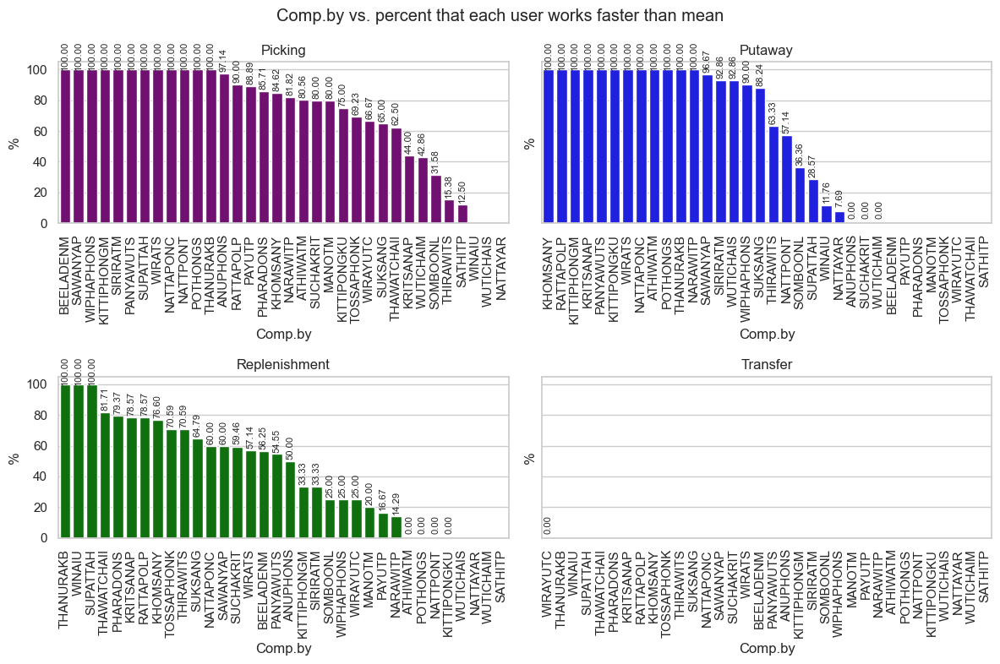

In [348]:
# Define the number of rows and columns for subplots
num_rows = 2  # Define the number of rows for subplots
num_cols = 2  # Define the number of columns for subplots

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 8), sharey=True)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through unique activities
for i, act in enumerate(unique_act):
    # Sort the pivot table by the specified activity in descending order
    pivot_lower_Mean_time = pivot_lower_Mean_time.sort_values(act, ascending=False)
    
    # Plot the bar chart for the current activity with the custom color on the respective subplot
    sns.barplot(data=pivot_lower_Mean_time, x='Comp.by', y=act, color=color_dict[i], ax=axes[i])
    
    # Set labels and title for each subplot
    axes[i].set_xlabel('Comp.by')
    axes[i].set_ylabel('%')
    axes[i].set_title(f'{act}')
    
    # Rotate x-axis labels for better readability
    axes[i].tick_params(axis='x', rotation=90)
    
    # Add labels at the end of each bar
    for p in axes[i].patches:
        axes[i].annotate(format(p.get_height(), '.2f'), 
                         (p.get_x() + p.get_width() / 2., p.get_height()+5), 
                         ha='center', va='center', xytext=(0, 5), 
                         textcoords='offset points', rotation=90, fontsize=8)

# Set a title for the entire plot
plt.suptitle('Comp.by vs. percent that each user works faster than mean')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


In [349]:
# Show counting of TO_number
for act in unique_act:
    pivot_lower_Mean_time = pivot_lower_Mean_time.sort_values(act, ascending=False)
    name = pivot_lower_Mean_time.head(5)
    name = list(name.loc[:, 'Comp.by'])
    pivot_TO1 = pivot_TO.copy()
    pivot_TO1['Comp.by'] = pd.Categorical(pivot_TO['Comp.by'], categories=name, ordered=True)
    filter = pivot_TO1.sort_values('Comp.by')
    filter = filter.head(5)
    filter.index.name = None
    filter.columns.name = None  # Remove columns' names as well
    try:
        filter[act] = filter[act].astype(int)
    except:
        pass
    print(f'Count_TO_number')
    display(filter.loc[:, ['Comp.by', act]])

Count_TO_number


,Comp.by,Picking
2,BEELADENM,8
15,POTHONGS,1
29,WIPHAPHONS,3
19,SIRIRATM,6
4,KITTIPHONGM,7


Count_TO_number


,Comp.by,Putaway
15,POTHONGS,14
9,NATTAPONC,2
6,KRITSANAP,10
5,KITTIPONGKU,6
1,ATHIWATM,1


Count_TO_number


,Comp.by,Replenishment
24,THANURAKB,2
28,WINAIU,8
23,SUPATTAH,2
25,THAWATCHAII,82
14,PHARADONS,63


Count_TO_number


,Comp.by,Transfer
31,WIRAYUTC,7.0
24,THANURAKB,NaN
28,WINAIU,NaN
23,SUPATTAH,NaN
25,THAWATCHAII,NaN


median

In [350]:
pivot_cutoff = cut_off_1.pivot_table(
                    index=['Comp.by'],
                    columns='Activity',
                    values=['TO Number.','lower_Median_time(sec)'],
                    aggfunc={'TO Number.': 'count', 'lower_Median_time(sec)': 'sum'}, 
                    #fill_value=0
                    )
pivot_cutoff = pivot_cutoff.reset_index()
pivot_TO = pivot_cutoff['TO Number.']
pivot_TO.loc[:,'Comp.by'] = pivot_cutoff['Comp.by']

pivot_lower_Median_time = pivot_cutoff['lower_Median_time(sec)'] 
pivot_lower_Median_time.loc[:,'Comp.by'] = pivot_cutoff['Comp.by']
pivot_lower_Median_time = pivot_lower_Median_time.iloc[:,[-1,0,1,2,3]]
for act in unique_act:
    pivot_lower_Median_time[act] = pivot_lower_Median_time[act]/pivot_TO[act]*100

pivot_lower_Median_time

C:\Users\Lenovo Legion\AppData\Local\Temp\ipykernel_9484\2298418824.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pivot_TO.loc[:,'Comp.by'] = pivot_cutoff['Comp.by']
C:\Users\Lenovo Legion\AppData\Local\Temp\ipykernel_9484\2298418824.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pivot_lower_Median_time.loc[:,'Comp.by'] = pivot_cutoff['Comp.by']


Activity,Comp.by,Picking,Putaway,Replenishment,Transfer
0,ANUPHONS,97.142857,0.000000,50.000000,NaN
1,ATHIWATM,36.111111,0.000000,0.000000,NaN
2,BEELADENM,75.000000,NaN,50.000000,NaN
3,KHOMSANY,61.538462,66.666667,40.425532,NaN
4,KITTIPHONGM,14.285714,90.000000,22.222222,NaN
5,KITTIPONGKU,25.000000,83.333333,0.000000,NaN
6,KRITSANAP,28.000000,80.000000,53.571429,NaN
7,MANOTM,80.000000,NaN,10.000000,NaN
8,NARAWITP,54.545455,64.285714,0.000000,NaN
9,NATTAPONC,25.000000,100.000000,60.000000,NaN


C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

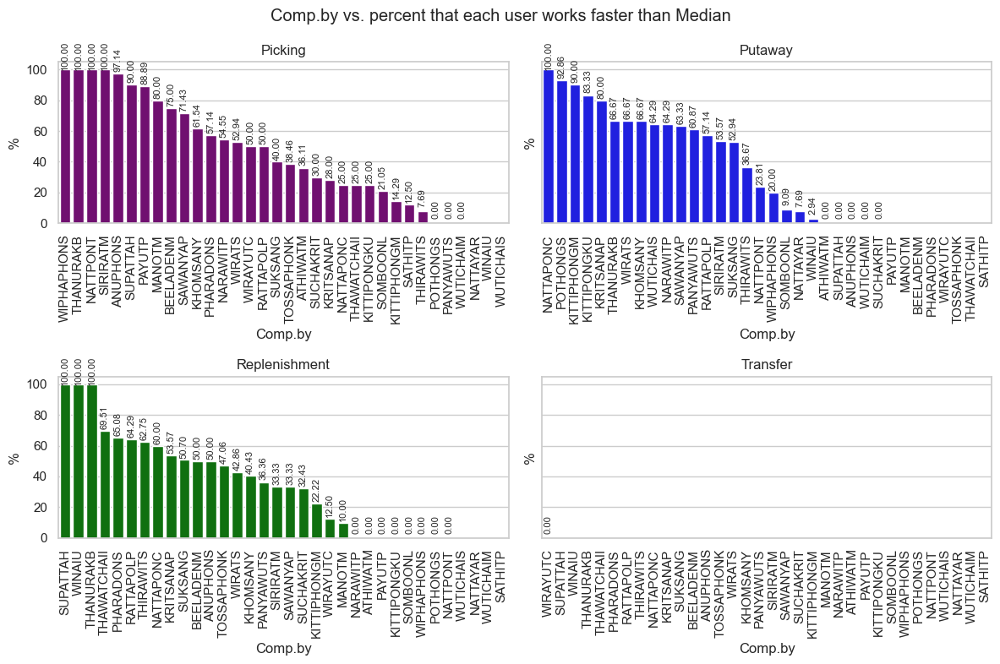

In [351]:
# Define the number of rows and columns for subplots
num_rows = 2  # Define the number of rows for subplots
num_cols = 2  # Define the number of columns for subplots

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 8), sharey=True)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through unique activities
for i, act in enumerate(unique_act):
    # Sort the pivot table by the specified activity in descending order
    pivot_lower_Median_time = pivot_lower_Median_time.sort_values(act, ascending=False)
    
    # Plot the bar chart for the current activity with the custom color on the respective subplot
    sns.barplot(data=pivot_lower_Median_time, x='Comp.by', y=act, color=color_dict[i], ax=axes[i])
    
    # Set labels and title for each subplot
    axes[i].set_xlabel('Comp.by')
    axes[i].set_ylabel('%')
    axes[i].set_title(f'{act}')
    
    # Rotate x-axis labels for better readability
    axes[i].tick_params(axis='x', rotation=90)
    
    # Add labels at the end of each bar
    for p in axes[i].patches:
        axes[i].annotate(format(p.get_height(), '.2f'), 
                         (p.get_x() + p.get_width() / 2., p.get_height()+5), 
                         ha='center', va='center', xytext=(0, 5), 
                         textcoords='offset points', rotation=90, fontsize=8)

# Set a title for the entire plot
plt.suptitle('Comp.by vs. percent that each user works faster than Median')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


Mode

In [352]:
pivot_cutoff = cut_off_1.pivot_table(
                    index=['Comp.by'],
                    columns='Activity',
                    values=['TO Number.','lower_Mode_time(sec)'],
                    aggfunc={'TO Number.': 'count', 'lower_Mode_time(sec)': 'sum'}, 
                    #fill_value=0
                    )
pivot_cutoff = pivot_cutoff.reset_index()
pivot_TO = pivot_cutoff['TO Number.']
pivot_TO.loc[:,'Comp.by'] = pivot_cutoff['Comp.by']

pivot_lower_Mode_time = pivot_cutoff['lower_Mode_time(sec)'] 
pivot_lower_Mode_time.loc[:,'Comp.by'] = pivot_cutoff['Comp.by']
pivot_lower_Mode_time = pivot_lower_Mode_time.iloc[:,[-1,0,1,2,3]]
for act in unique_act:
    pivot_lower_Mode_time[act] = pivot_lower_Mode_time[act]/pivot_TO[act]*100

pivot_lower_Mode_time

C:\Users\Lenovo Legion\AppData\Local\Temp\ipykernel_9484\2613059181.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pivot_TO.loc[:,'Comp.by'] = pivot_cutoff['Comp.by']
C:\Users\Lenovo Legion\AppData\Local\Temp\ipykernel_9484\2613059181.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pivot_lower_Mode_time.loc[:,'Comp.by'] = pivot_cutoff['Comp.by']


Activity,Comp.by,Picking,Putaway,Replenishment,Transfer
0,ANUPHONS,5.714286,0.000000,50.000000,NaN
1,ATHIWATM,0.000000,0.000000,0.000000,NaN
2,BEELADENM,50.000000,NaN,31.250000,NaN
3,KHOMSANY,7.692308,0.000000,29.787234,NaN
4,KITTIPHONGM,0.000000,40.000000,22.222222,NaN
5,KITTIPONGKU,0.000000,66.666667,0.000000,NaN
6,KRITSANAP,16.000000,40.000000,46.428571,NaN
7,MANOTM,20.000000,NaN,10.000000,NaN
8,NARAWITP,0.000000,21.428571,0.000000,NaN
9,NATTAPONC,12.500000,50.000000,50.000000,NaN


C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will 

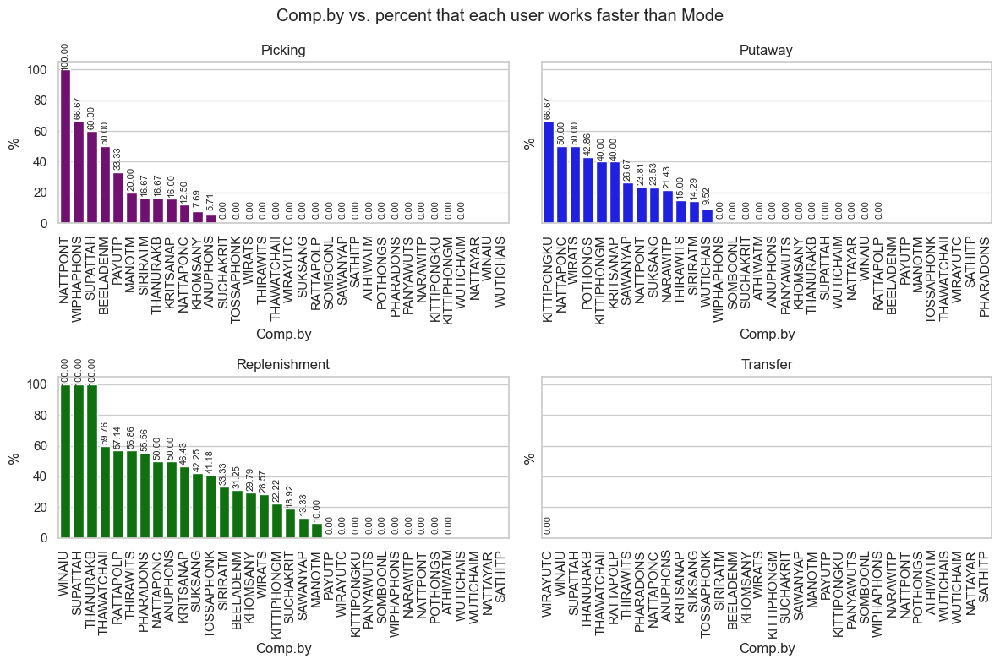

In [353]:
# Define the number of rows and columns for subplots
num_rows = 2  # Define the number of rows for subplots
num_cols = 2  # Define the number of columns for subplots

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 8), sharey=True)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through unique activities
for i, act in enumerate(unique_act):
    # Sort the pivot table by the specified activity in descending order
    pivot_lower_Mode_time = pivot_lower_Mode_time.sort_values(act, ascending=False)
    
    # Plot the bar chart for the current activity with the custom color on the respective subplot
    sns.barplot(data=pivot_lower_Mode_time, x='Comp.by', y=act, color=color_dict[i], ax=axes[i])
    
    # Set labels and title for each subplot
    axes[i].set_xlabel('Comp.by')
    axes[i].set_ylabel('%')
    axes[i].set_title(f'{act}')
    
    # Rotate x-axis labels for better readability
    axes[i].tick_params(axis='x', rotation=90)
    
    # Add labels at the end of each bar
    for p in axes[i].patches:
        axes[i].annotate(format(p.get_height(), '.2f'), 
                         (p.get_x() + p.get_width() / 2., p.get_height()+5), 
                         ha='center', va='center', xytext=(0, 5), 
                         textcoords='offset points', rotation=90, fontsize=8)

# Set a title for the entire plot
plt.suptitle('Comp.by vs. percent that each user works faster than Mode')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


## 8. Cut off allow lower than mean or company std. not more than 5% from total completed order
- indicate good/poor performance

In [354]:
cut_activity = sum_df2.loc[:,['TO Number.','Comp.by','Comp.Date',
                               'Activity','time_diff',
                               ]].copy()

### Picking

Use median value since the time_diff data distribution (from its histogram) extremely shifts left

In [355]:
Activity = 'Picking'

In [356]:
company_std_picking = 3 # pallets per hr
cut_picking_1 = cut_activity[cut_activity['Activity'] == Activity].copy()
cut_picking_1.loc[:,'pallet/hr'] = (1/cut_picking_1['time_diff'])*3600 #3600 sec/hr
cut_picking_1.loc[:,'median_pallet/hr'] = cut_picking_1['pallet/hr'].median()

#cut_picking_1.hist(column='pallet/hr')

cut_picking_1['higher_median_pallet/hr'] = (cut_picking_1['pallet/hr'] > cut_picking_1['median_pallet/hr']).astype(int)
cut_picking_1['higher_company_std_pallet/hr'] = (cut_picking_1['pallet/hr'] > company_std_picking).astype(int)
display(cut_picking_1)

,TO Number.,Comp.by,Comp.Date,Activity,time_diff,pallet/hr,median_pallet/hr,higher_median_pallet/hr,higher_company_std_pallet/hr
9,74544559.0,ANUPHONS,2023-09-11,Picking,28.0,128.571429,40.909091,1,1
10,74545552.0,ANUPHONS,2023-09-11,Picking,53.0,67.924528,40.909091,1,1
11,74632067.0,ANUPHONS,2023-09-18,Picking,41.0,87.804878,40.909091,1,1
12,74632068.0,ANUPHONS,2023-09-18,Picking,22.0,163.636364,40.909091,1,1
13,74632069.0,ANUPHONS,2023-09-18,Picking,30.0,120.000000,40.909091,1,1
...,...,...,...,...,...,...,...,...,...
1719,74586523.0,WUTICHAIM,2023-09-14,Picking,112.0,32.142857,40.909091,0,1
1720,74591529.0,WUTICHAIM,2023-09-14,Picking,466.0,7.725322,40.909091,0,1
1729,74747298.0,WUTICHAIM,2023-09-28,Picking,113.0,31.858407,40.909091,0,1
1730,74764476.0,WUTICHAIM,2023-09-29,Picking,152.0,23.684211,40.909091,0,1


Cut off at 5%

In [357]:
cut_picking_pivot = cut_picking_1.pivot_table(
                    index=['Comp.by'],
                    #columns='Activity',
                    values=['TO Number.','higher_median_pallet/hr','higher_company_std_pallet/hr'],
                    aggfunc={'TO Number.': 'count', 
                             'higher_median_pallet/hr': 'sum',
                             'higher_company_std_pallet/hr': 'sum'}, 
                    #fill_value=0
                    )
cut_picking_pivot = cut_picking_pivot.reset_index()

cut_picking_pivot['percent_pass_comSTD'] = cut_picking_pivot['higher_company_std_pallet/hr']/cut_picking_pivot['TO Number.']*100
cut_picking_pivot['95_pass_comSTD'] = np.where(cut_picking_pivot['percent_pass_comSTD'] >= 95, 1, 0)

cut_picking_pivot['percent_pass_median'] = cut_picking_pivot['higher_median_pallet/hr']/cut_picking_pivot['TO Number.']*100
cut_picking_pivot['95_pass_median'] = np.where(cut_picking_pivot['percent_pass_median'] >= 95, 1, 0)


cut_picking_pivot = cut_picking_pivot.sort_values(by=['percent_pass_comSTD','percent_pass_median','Comp.by',], 
                                                  ascending=[False, False, True]
                                                  )
cut_picking_pivot.loc[:,['Comp.by','95_pass_comSTD','95_pass_median']]

,Comp.by,95_pass_comSTD,95_pass_median
10,NATTPONT,1,1
18,SIRIRATM,1,1
23,THANURAKB,1,1
27,WIPHAPHONS,1,1
0,ANUPHONS,1,1
22,SUPATTAH,1,0
12,PAYUTP,1,0
7,MANOTM,1,0
2,BEELADENM,1,0
17,SAWANYAP,1,0


C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


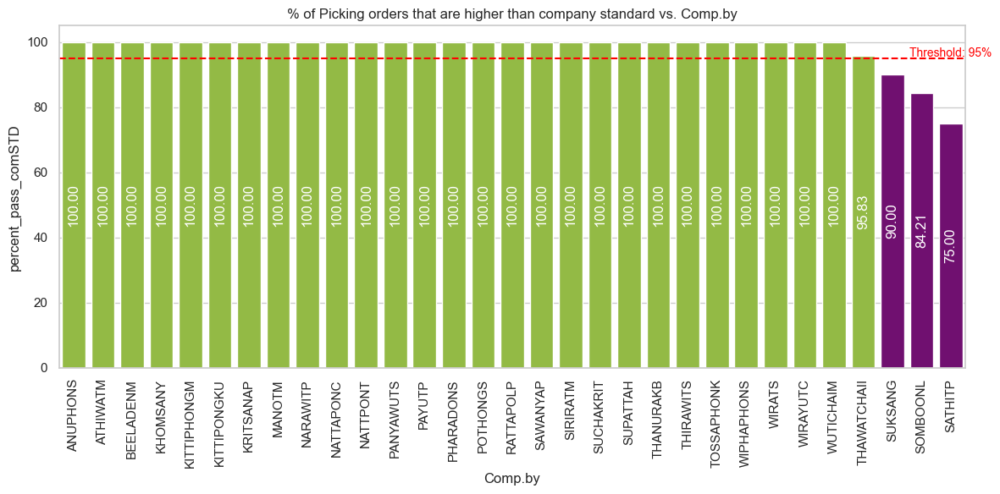

In [358]:
cut_off_type = 'company standard'
data = cut_picking_pivot.sort_values(by=['percent_pass_comSTD', 'Comp.by'], ascending=[False, True])

# Set the style for the plot
sns.set(style="whitegrid")
bar_color = 'purple'

# Create a conditional color mapping function
def color_mapping(value):
    return 'yellowgreen' if value >= 95 else bar_color

# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
ax = sns.barplot(x='Comp.by', y='percent_pass_comSTD',
                 data=data,
                 palette=cut_picking_pivot['percent_pass_comSTD'].apply(color_mapping)
                )

# Add a horizontal line at y=95
ax.axhline(y=95, color='red', linestyle='--') 
# Annotate the line with text
plt.text(len(cut_picking_pivot) - 1, 95.5, 'Threshold: 95%', color='red', fontsize=10, ha='center')

# Add value labels at the center of the bars with a 90-degree rotation
for i, p in enumerate(ax.patches):
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height / 2, f'{height:.2f}', 
            ha='center', va='center',
            color='white',
            rotation=90)

plt.xlabel('Comp.by')
plt.ylabel('percent_pass_comSTD')
plt.title(f'% of {Activity} orders that are higher than {cut_off_type} vs. Comp.by')

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


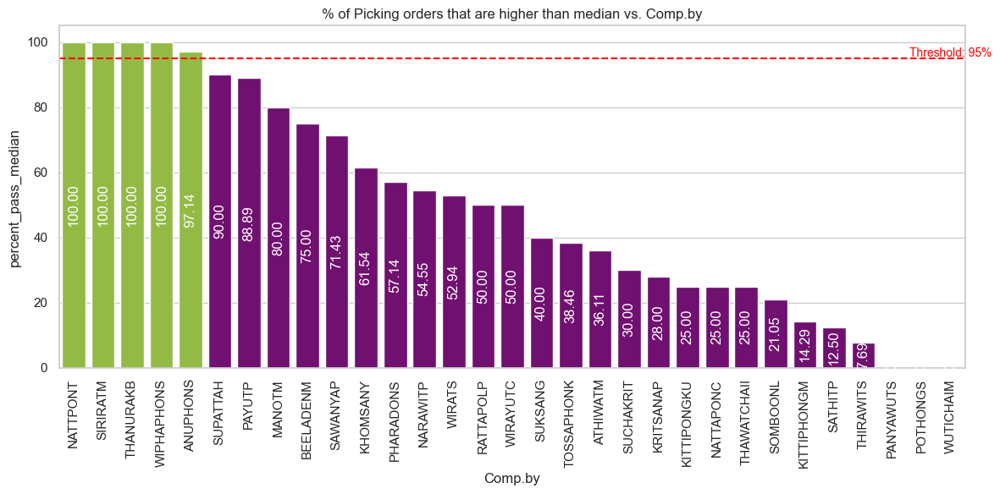

In [359]:
cut_off_type = 'median'
data = cut_picking_pivot.sort_values(by=['percent_pass_median', 'Comp.by'], ascending=[False, True])

# Set the style for the plot
sns.set(style="whitegrid")
bar_color = 'purple'

# Create a conditional color mapping function
def color_mapping(value):
    return 'yellowgreen' if value >= 95 else bar_color

# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
ax = sns.barplot(x='Comp.by', y='percent_pass_median',
                 data=data,
                 palette=cut_picking_pivot['percent_pass_median'].apply(color_mapping)
                )

# Add a horizontal line at y=95
ax.axhline(y=95, color='red', linestyle='--') 
# Annotate the line with text
plt.text(len(cut_picking_pivot) - 1, 95.5, 'Threshold: 95%', color='red', fontsize=10, ha='center')

# Add value labels at the center of the bars with a 90-degree rotation
for i, p in enumerate(ax.patches):
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height / 2, f'{height:.2f}', 
            ha='center', va='center',
            color='white',
            rotation=90)

plt.xlabel('Comp.by')
plt.ylabel('percent_pass_median')
plt.title(f'% of {Activity} orders that are higher than {cut_off_type} vs. Comp.by')

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### Putaway

In [360]:
Activity ='Putaway'

In [361]:
company_std_putaway = 17 # pallets per hr
cut_putaway_1 = cut_activity[cut_activity['Activity'] == Activity].copy()
cut_putaway_1.loc[:,'pallet/hr'] = (1/cut_putaway_1['time_diff'])*3600 #3600 sec/hr
cut_putaway_1.loc[:,'median_pallet/hr'] = cut_putaway_1['pallet/hr'].median()

#cut_putaway_1.hist(column='pallet/hr')

cut_putaway_1['higher_median_pallet/hr'] = (cut_putaway_1['pallet/hr'] > cut_putaway_1['median_pallet/hr']).astype(int)
cut_putaway_1['higher_company_std_pallet/hr'] = (cut_putaway_1['pallet/hr'] > company_std_putaway).astype(int)
display(cut_putaway_1)

,TO Number.,Comp.by,Comp.Date,Activity,time_diff,pallet/hr,median_pallet/hr,higher_median_pallet/hr,higher_company_std_pallet/hr
30,74635492.0,ANUPHONS,2023-09-19,Putaway,35.0,102.857143,1200.0,0,1
31,74635493.0,ANUPHONS,2023-09-19,Putaway,20.0,180.000000,1200.0,0,1
32,74635494.0,ANUPHONS,2023-09-19,Putaway,34.0,105.882353,1200.0,0,1
33,74635495.0,ANUPHONS,2023-09-19,Putaway,34.0,105.882353,1200.0,0,1
34,74635496.0,ANUPHONS,2023-09-19,Putaway,31.0,116.129032,1200.0,0,1
...,...,...,...,...,...,...,...,...,...
1824,74669468.0,WUTICHAIS,2023-09-21,Putaway,21.0,171.428571,1200.0,0,1
1825,74669470.0,WUTICHAIS,2023-09-21,Putaway,2.0,1800.000000,1200.0,1,1
1828,74727018.0,WUTICHAIS,2023-09-26,Putaway,3.0,1200.000000,1200.0,0,1
1829,74727019.0,WUTICHAIS,2023-09-26,Putaway,2.0,1800.000000,1200.0,1,1


In [362]:
cut_putaway_pivot = cut_putaway_1.pivot_table(
                    index=['Comp.by'],
                    #columns='Activity',
                    values=['TO Number.','higher_median_pallet/hr','higher_company_std_pallet/hr'],
                    aggfunc={'TO Number.': 'count', 
                             'higher_median_pallet/hr': 'sum',
                             'higher_company_std_pallet/hr': 'sum'}, 
                    #fill_value=0
                    )
cut_putaway_pivot = cut_putaway_pivot.reset_index()

cut_putaway_pivot['percent_pass_comSTD'] = cut_putaway_pivot['higher_company_std_pallet/hr']/cut_putaway_pivot['TO Number.']*100
cut_putaway_pivot['95_pass_comSTD'] = np.where(cut_putaway_pivot['percent_pass_comSTD'] >= 95, 1, 0)

cut_putaway_pivot['percent_pass_median'] = cut_putaway_pivot['higher_median_pallet/hr']/cut_putaway_pivot['TO Number.']*100
cut_putaway_pivot['95_pass_median'] = np.where(cut_putaway_pivot['percent_pass_median'] >= 95, 1, 0)


cut_putaway_pivot = cut_putaway_pivot.sort_values(by=['percent_pass_comSTD','percent_pass_median','Comp.by',], 
                                                  ascending=[False, False, True]
                                                  )
cut_putaway_pivot.loc[:,['Comp.by','95_pass_comSTD','95_pass_median']]

,Comp.by,95_pass_comSTD,95_pass_median
7,NATTAPONC,1,1
11,POTHONGS,1,0
3,KITTIPHONGM,1,0
4,KITTIPONGKU,1,0
5,KRITSANAP,1,0
2,KHOMSANY,1,0
19,THANURAKB,1,0
23,WIRATS,1,0
6,NARAWITP,1,0
25,WUTICHAIS,1,0


C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


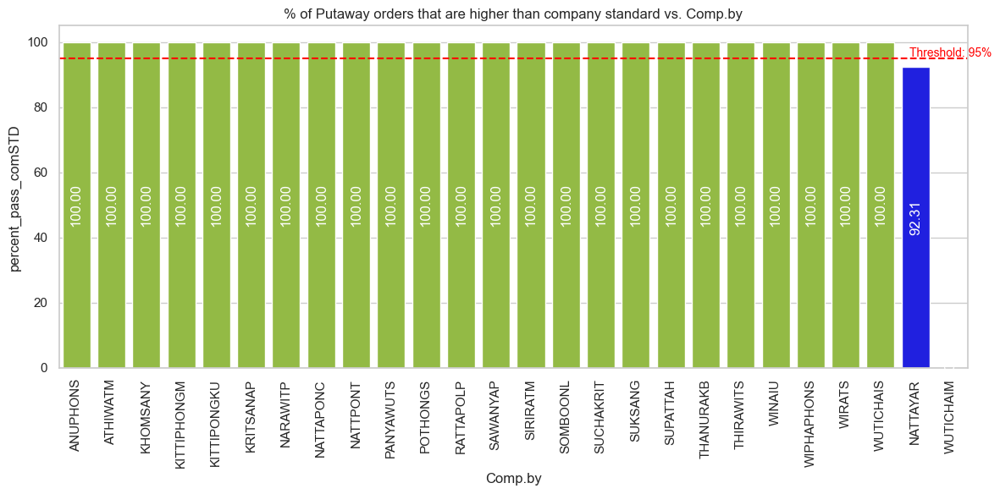

In [363]:
cut_off_type = 'company standard'
data = cut_putaway_pivot.sort_values(by=['percent_pass_comSTD', 'Comp.by'], ascending=[False, True])

# Set the style for the plot
sns.set(style="whitegrid")
bar_color = 'blue'

# Create a conditional color mapping function
def color_mapping(value):
    return 'yellowgreen' if value >= 95 else bar_color

# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
ax = sns.barplot(x='Comp.by', y='percent_pass_comSTD',
                 data=data,
                 palette=cut_putaway_pivot['percent_pass_comSTD'].apply(color_mapping)
                )

# Add a horizontal line at y=95
ax.axhline(y=95, color='red', linestyle='--') 
# Annotate the line with text
plt.text(len(cut_putaway_pivot) - 1, 95.5, 'Threshold: 95%', color='red', fontsize=10, ha='center')

# Add value labels at the center of the bars with a 90-degree rotation
for i, p in enumerate(ax.patches):
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height / 2, f'{height:.2f}', 
            ha='center', va='center',
            color='white',
            rotation=90)

plt.xlabel('Comp.by')
plt.ylabel('percent_pass_comSTD')
plt.title(f'% of {Activity} orders that are higher than {cut_off_type} vs. Comp.by')

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


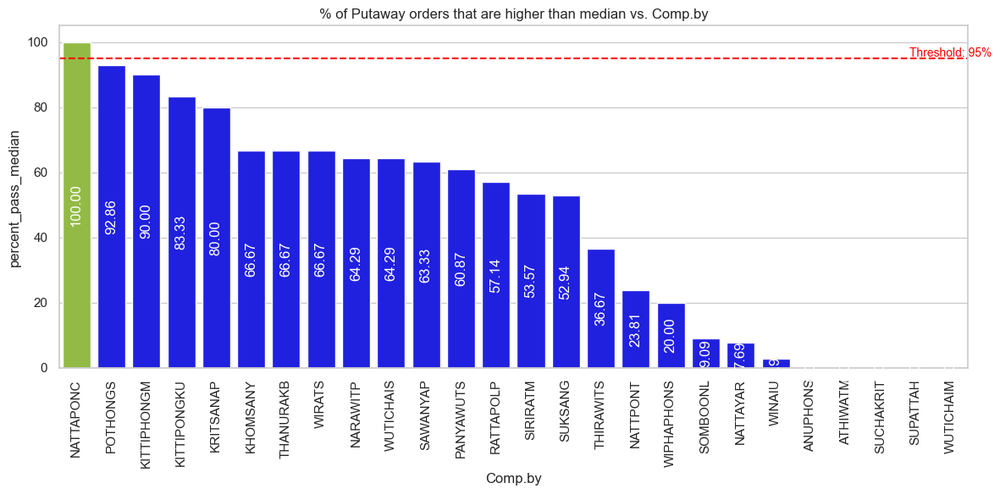

In [364]:
cut_off_type = 'median'
data = cut_putaway_pivot.sort_values(by=['percent_pass_median', 'Comp.by'], ascending=[False, True])

# Set the style for the plot
sns.set(style="whitegrid")
bar_color = 'blue'

# Create a conditional color mapping function
def color_mapping(value):
    return 'yellowgreen' if value >= 95 else bar_color

# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
ax = sns.barplot(x='Comp.by', y='percent_pass_median',
                 data=data,
                 palette=cut_putaway_pivot['percent_pass_median'].apply(color_mapping)
                )

# Add a horizontal line at y=95
ax.axhline(y=95, color='red', linestyle='--') 
# Annotate the line with text
plt.text(len(cut_putaway_pivot) - 1, 95.5, 'Threshold: 95%', color='red', fontsize=10, ha='center')

# Add value labels at the center of the bars with a 90-degree rotation
for i, p in enumerate(ax.patches):
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height / 2, f'{height:.2f}', 
            ha='center', va='center',
            color='white',
            rotation=90)

plt.xlabel('Comp.by')
plt.ylabel('percent_pass_median')
plt.title(f'% of {activity} orders that are higher than {cut_off_type} vs. Comp.by')

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### Replenishment

In [365]:
Activity = 'Replenishment'

In [366]:
company_std_replenishment = 17 # pallets per hr
cut_replenishment_1 = cut_activity[cut_activity['Activity'] == Activity].copy()
cut_replenishment_1.loc[:,'pallet/hr'] = (1/cut_replenishment_1['time_diff'])*3600 #3600 sec/hr
cut_replenishment_1.loc[:,'median_pallet/hr'] = cut_replenishment_1['pallet/hr'].median()

#cut_replenishment_1.hist(column='pallet/hr')

cut_replenishment_1['higher_median_pallet/hr'] = (cut_replenishment_1['pallet/hr'] > cut_replenishment_1['median_pallet/hr']).astype(int)
cut_replenishment_1['higher_company_std_pallet/hr'] = (cut_replenishment_1['pallet/hr'] > company_std_replenishment).astype(int)
display(cut_replenishment_1)

,TO Number.,Comp.by,Comp.Date,Activity,time_diff,pallet/hr,median_pallet/hr,higher_median_pallet/hr,higher_company_std_pallet/hr
56,74581350.0,ANUPHONS,2023-09-14,Replenishment,30.0,120.000000,37.894737,1,1
57,74727524.0,ANUPHONS,2023-09-26,Replenishment,6.0,600.000000,37.894737,1,1
58,74734070.0,ANUPHONS,2023-09-27,Replenishment,147.0,24.489796,37.894737,0,1
59,74760810.0,ANUPHONS,2023-09-29,Replenishment,170.0,21.176471,37.894737,0,1
102,74554087.0,ATHIWATM,2023-09-12,Replenishment,135.0,26.666667,37.894737,0,1
...,...,...,...,...,...,...,...,...,...
1701,74662508.0,WIRAYUTC,2023-09-20,Replenishment,131.0,27.480916,37.894737,0,1
1702,74662509.0,WIRAYUTC,2023-09-21,Replenishment,94.0,38.297872,37.894737,1,1
1703,74664096.0,WIRAYUTC,2023-09-21,Replenishment,123.0,29.268293,37.894737,0,1
1704,74717877.0,WIRAYUTC,2023-09-26,Replenishment,130.0,27.692308,37.894737,0,1


In [367]:
cut_replenishment_pivot = cut_replenishment_1.pivot_table(
                    index=['Comp.by'],
                    #columns='Activity',
                    values=['TO Number.','higher_median_pallet/hr','higher_company_std_pallet/hr'],
                    aggfunc={'TO Number.': 'count', 
                             'higher_median_pallet/hr': 'sum',
                             'higher_company_std_pallet/hr': 'sum'}, 
                    #fill_value=0
                    )
cut_replenishment_pivot = cut_replenishment_pivot.reset_index()

cut_replenishment_pivot['percent_pass_comSTD'] = cut_replenishment_pivot['higher_company_std_pallet/hr']/cut_replenishment_pivot['TO Number.']*100
cut_replenishment_pivot['95_pass_comSTD'] = np.where(cut_replenishment_pivot['percent_pass_comSTD'] >= 95, 1, 0)

cut_replenishment_pivot['percent_pass_median'] = cut_replenishment_pivot['higher_median_pallet/hr']/cut_replenishment_pivot['TO Number.']*100
cut_replenishment_pivot['95_pass_median'] = np.where(cut_replenishment_pivot['percent_pass_median'] >= 95, 1, 0)


cut_replenishment_pivot = cut_replenishment_pivot.sort_values(by=['percent_pass_comSTD','percent_pass_median','Comp.by',], 
                                                  ascending=[False, False, True]
                                                  )
cut_replenishment_pivot.loc[:,['Comp.by','95_pass_comSTD','95_pass_median']]

,Comp.by,95_pass_comSTD,95_pass_median
21,SUPATTAH,1,1
22,THANURAKB,1,1
26,WINAIU,1,1
13,PHARADONS,1,0
15,RATTAPOLP,1,0
6,KRITSANAP,1,0
0,ANUPHONS,1,0
2,BEELADENM,1,0
28,WIRATS,1,0
4,KITTIPHONGM,1,0


C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


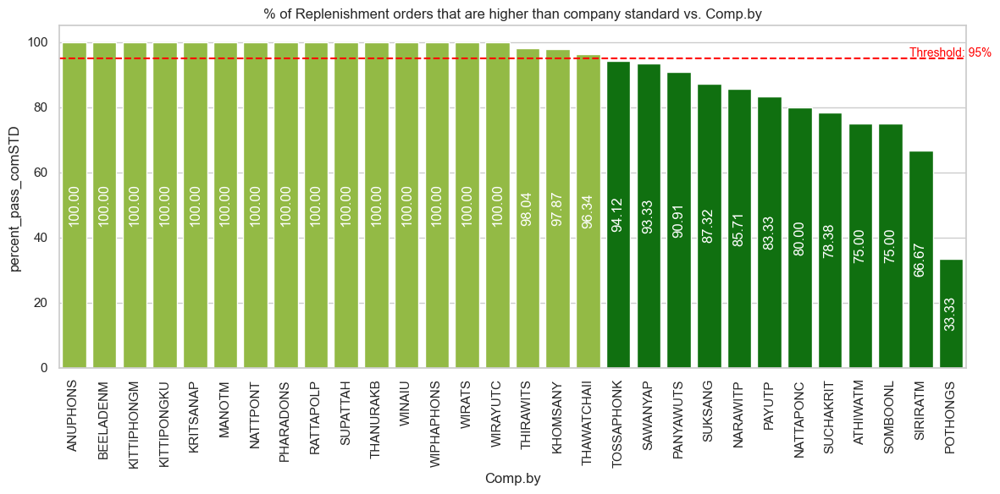

In [368]:
cut_off_type = 'company standard'
data = cut_replenishment_pivot.sort_values(by=['percent_pass_comSTD', 'Comp.by'], ascending=[False, True])

# Set the style for the plot
sns.set(style="whitegrid")
bar_color = 'green'

# Create a conditional color mapping function
def color_mapping(value):
    return 'yellowgreen' if value >= 95 else bar_color

# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
ax = sns.barplot(x='Comp.by', y='percent_pass_comSTD',
                 data=data,
                 palette=cut_replenishment_pivot['percent_pass_comSTD'].apply(color_mapping)
                )

# Add a horizontal line at y=95
ax.axhline(y=95, color='red', linestyle='--') 
# Annotate the line with text
plt.text(len(cut_replenishment_pivot) - 1, 95.5, 'Threshold: 95%', color='red', fontsize=10, ha='center')

# Add value labels at the center of the bars with a 90-degree rotation
for i, p in enumerate(ax.patches):
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height / 2, f'{height:.2f}', 
            ha='center', va='center',
            color='white',
            rotation=90)

plt.xlabel('Comp.by')
plt.ylabel('percent_pass_comSTD')
plt.title(f'% of {Activity} orders that are higher than {cut_off_type} vs. Comp.by')

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


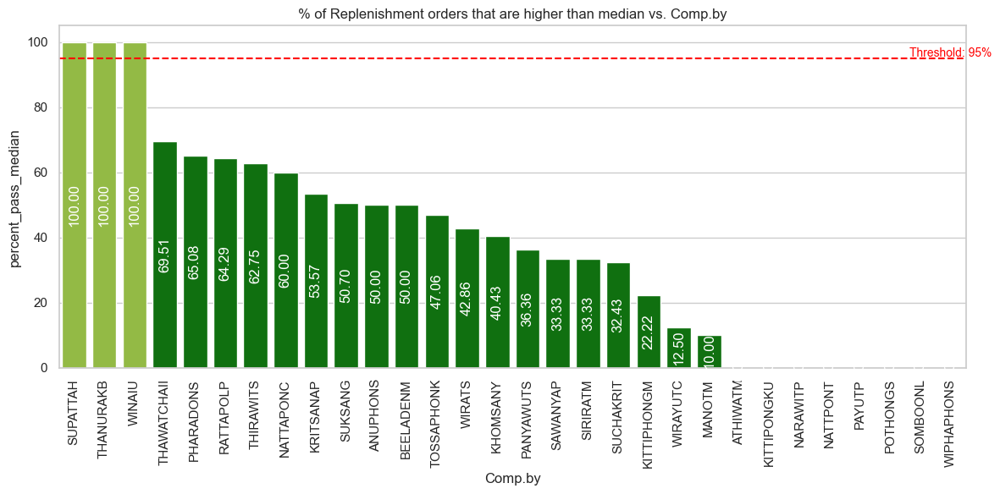

In [369]:
cut_off_type = 'median'
data = cut_replenishment_pivot.sort_values(by=['percent_pass_median', 'Comp.by'], ascending=[False, True])

# Set the style for the plot
sns.set(style="whitegrid")
bar_color = 'green'

# Create a conditional color mapping function
def color_mapping(value):
    return 'yellowgreen' if value >= 95 else bar_color

# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
ax = sns.barplot(x='Comp.by', y='percent_pass_median',
                 data=data,
                 palette=cut_replenishment_pivot['percent_pass_median'].apply(color_mapping)
                )

# Add a horizontal line at y=95
ax.axhline(y=95, color='red', linestyle='--') 
# Annotate the line with text
plt.text(len(cut_replenishment_pivot) - 1, 95.5, 'Threshold: 95%', color='red', fontsize=10, ha='center')

# Add value labels at the center of the bars with a 90-degree rotation
for i, p in enumerate(ax.patches):
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height / 2, f'{height:.2f}', 
            ha='center', va='center',
            color='white',
            rotation=90)

plt.xlabel('Comp.by')
plt.ylabel('percent_pass_median')
plt.title(f'% of {Activity} orders that are higher than {cut_off_type} vs. Comp.by')

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## 9. Create New Calculation

### Check normality

In [370]:
c_normal = sum_df2_1.loc[:,['Activity','Distance(m)']]
c_normal

,Activity,Distance(m)
9,Picking,31.029791
10,Picking,71.150000
11,Picking,35.929791
12,Picking,80.898858
13,Picking,75.998858
...,...,...
1824,Putaway,56.398858
1825,Putaway,97.204220
1828,Putaway,8.164896
1829,Putaway,16.329791


In [371]:
for act in unique_act:
    check = c_normal[c_normal['Activity'] == act]
    print(act,shapiro(check['Distance(m)']))

Picking ShapiroResult(statistic=0.9701926708221436, pvalue=5.975991257400892e-07)
Putaway ShapiroResult(statistic=0.9862005710601807, pvalue=0.0006511564133688807)
Replenishment ShapiroResult(statistic=0.9925191402435303, pvalue=0.006862351670861244)
Transfer ShapiroResult(statistic=0.928394615650177, pvalue=0.5373297929763794)


### Separate data
- picking using normal distribution
- putaway & replenish using percentile

In [372]:
cut_off_2 = sum_df2.copy()
 
cut_picking_2 = cut_off_2[cut_off_2['Activity'] == 'Picking'].copy()
cut_picking_2.loc[:,'pallet/hr'] = (1/cut_picking_2['time_diff'])*3600
cut_picking_2.loc[:,'median_pallet/hr'] = cut_picking_2['pallet/hr'].median()

cut_putaway_2 = cut_off_2[cut_off_2['Activity'] == 'Putaway'].copy()
cut_putaway_2.loc[:,'pallet/hr'] = (1/cut_putaway_2['time_diff'])*3600 #3600 sec/hr
cut_putaway_2.loc[:,'median_pallet/hr'] = cut_putaway_2['pallet/hr'].median()

cut_replenishment_2 = cut_off_2[cut_off_2['Activity'] == 'Replenishment'].copy()
cut_replenishment_2.loc[:,'pallet/hr'] = (1/cut_replenishment_2['time_diff'])*3600 #3600 sec/hr
cut_replenishment_2.loc[:,'median_pallet/hr'] = cut_replenishment_2['pallet/hr'].median()


In [373]:
def assign_diff_factor_z(x):
    if x < -1:
        return 0.5
    elif -1 <= x <= 1:
        return 1
    else:
        return 1.5
    
def assign_diff_factor(x):
    if x < 33:
        return 0.5
    elif 33 <= x <= 66:
        return 1
    else:
        return 1.5

In [374]:
cut_picking_2['percentile_Distance'] = zscore(cut_picking_2['Distance(m)'])

# Apply the function to create the 'Diff_factor' column based on 'percentile_Distance'
cut_picking_2['Diff_factor'] = cut_picking_2['percentile_Distance'].apply(assign_diff_factor)

cut_picking_2.loc[:,'pallet/hr_factor'] = (1/cut_picking_2['time_diff']*cut_picking_2['Diff_factor'])*3600 #3600 sec/hr

cut_picking_2['higher_median_pallet/hr_factor'] = (cut_picking_2['pallet/hr_factor'] > cut_picking_2['median_pallet/hr']).astype(int)
cut_picking_2['higher_company_std_pallet/hr_factor'] = (cut_picking_2['pallet/hr_factor'] > company_std_picking).astype(int)
display(cut_picking_2)

,TO Number.,S.Type,Source BIN,Dest.Type,Dest.BIN,Comp._Datetime,Comp_Month,Comp.time,Comp.Date,Comp.by,...,Distance(m),Cal_t (sec),IsCal_t_longer,pallet/hr,median_pallet/hr,percentile_Distance,Diff_factor,pallet/hr_factor,higher_median_pallet/hr_factor,higher_company_std_pallet/hr_factor
9,74544559.0,MH8,022-292-04,200,2007391458,2023-09-11 13:56:35,9,13:56:35,2023-09-11,ANUPHONS,...,31.029791,15.958178,0,128.571429,40.909091,-0.906188,0.5,64.285714,1,1
10,74545552.0,MH8,021-192-07,200,2007391524,2023-09-11 15:14:42,9,15:14:42,2023-09-11,ANUPHONS,...,71.150000,36.591429,0,67.924528,40.909091,0.960950,0.5,33.962264,0,1
11,74632067.0,MH8,020-051-02,200,2007401210,2023-09-18 21:43:01,9,21:43:01,2023-09-18,ANUPHONS,...,35.929791,18.478178,0,87.804878,40.909091,-0.678149,0.5,43.902439,1,1
12,74632068.0,MH8,020-182-02,200,2007401210,2023-09-18 21:42:17,9,21:42:17,2023-09-18,ANUPHONS,...,80.898858,41.605127,1,163.636364,40.909091,1.414648,0.5,81.818182,1,1
13,74632069.0,MH8,020-192-03,200,2007401210,2023-09-18 21:41:51,9,21:41:51,2023-09-18,ANUPHONS,...,75.998858,39.085127,1,120.000000,40.909091,1.186609,0.5,60.000000,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1719,74586523.0,MH8,021-061-02,200,2007397790,2023-09-14 21:20:26,9,21:20:26,2023-09-14,WUTICHAIM,...,31.950000,16.431429,0,32.142857,40.909091,-0.863363,0.5,16.071429,0,1
1720,74591529.0,MH8,020-032-06,200,2007398403,2023-09-14 21:54:41,9,21:54:41,2023-09-14,WUTICHAIM,...,28.579791,14.698178,0,7.725322,40.909091,-1.020207,0.5,3.862661,0,1
1729,74747298.0,MH8,020-182-04,200,2007415011,2023-09-28 10:26:45,9,10:26:45,2023-09-28,WUTICHAIM,...,80.898858,41.605127,0,31.858407,40.909091,1.414648,0.5,15.929204,0,1
1730,74764476.0,MH8,022-021-03,200,2007418058,2023-09-29 11:19:36,9,11:19:36,2023-09-29,WUTICHAIM,...,17.198858,8.845127,0,23.684211,40.909091,-1.549860,0.5,11.842105,0,1


In [375]:
cut_putaway_2['percentile_Distance'] = cut_putaway_2 ['Distance(m)'].apply(lambda x: np.percentile(cut_putaway_2 ['Distance(m)'], 
                                                                          np.searchsorted(np.sort(cut_putaway_2 ['Distance(m)']), 
                                                                                          x, 
                                                                                          side='right') / len(cut_putaway_2 ) * 100))
# Apply the function to create the 'Diff_factor' column
cut_putaway_2['Diff_factor'] = cut_putaway_2['percentile_Distance'].apply(assign_diff_factor)

cut_putaway_2.loc[:,'pallet/hr_factor'] = (1/cut_putaway_2['time_diff']*cut_putaway_2['Diff_factor'])*3600 #3600 sec/hr

cut_putaway_2['higher_median_pallet/hr_factor'] = (cut_putaway_2['pallet/hr_factor'] > cut_putaway_2['median_pallet/hr']).astype(int)
cut_putaway_2['higher_company_std_pallet/hr_factor'] = (cut_putaway_2['pallet/hr_factor'] > company_std_putaway).astype(int)
display(cut_putaway_2)

,TO Number.,S.Type,Source BIN,Dest.Type,Dest.BIN,Comp._Datetime,Comp_Month,Comp.time,Comp.Date,Comp.by,...,Distance(m),Cal_t (sec),IsCal_t_longer,pallet/hr,median_pallet/hr,percentile_Distance,Diff_factor,pallet/hr_factor,higher_median_pallet/hr_factor,higher_company_std_pallet/hr_factor
30,74635492.0,IDP,235625318,MH8,020-151-07,2023-09-19 01:19:04,9,01:19:04,2023-09-19,ANUPHONS,...,42.464896,21.839089,0,102.857143,1200.0,42.478821,1.0,102.857143,0,1
31,74635493.0,IDP,235625322,MH8,020-191-04,2023-09-19 01:19:57,9,01:19:57,2023-09-19,ANUPHONS,...,81.689325,42.011653,1,180.000000,1200.0,81.712813,1.5,270.000000,0,1
32,74635494.0,IDP,235625329,MH8,020-212-07,2023-09-19 01:21:07,9,01:21:07,2023-09-19,ANUPHONS,...,72.323858,37.195127,1,105.882353,1200.0,72.327565,1.5,158.823529,0,1
33,74635495.0,IDP,235622369,MH8,020-092-06,2023-09-19 01:22:14,9,01:22:14,2023-09-19,ANUPHONS,...,62.089325,31.931653,0,105.882353,1200.0,62.203563,1.0,105.882353,0,1
34,74635496.0,IDP,235625327,MH8,020-242-06,2023-09-19 01:23:24,9,01:23:24,2023-09-19,ANUPHONS,...,54.739325,28.151653,0,116.129032,1200.0,54.896269,1.0,116.129032,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1824,74669468.0,IDP,235737594,MH8,022-102-05,2023-09-21 13:01:36,9,13:01:36,2023-09-21,WUTICHAIS,...,56.398858,29.005127,1,171.428571,1200.0,56.416198,1.0,171.428571,0,1
1825,74669470.0,IDP,235737596,MH8,022-221-04,2023-09-21 13:02:50,9,13:02:50,2023-09-21,WUTICHAIS,...,97.204220,49.990742,1,1800.000000,1200.0,97.225236,1.5,2700.000000,1,1
1828,74727018.0,IDP,235904611,MH8,022-322-04,2023-09-26 18:13:23,9,18:13:23,2023-09-26,WUTICHAIS,...,8.164896,4.199089,1,1200.000000,1200.0,8.595158,0.5,600.000000,0,1
1829,74727019.0,IDP,235904608,MH8,022-322-05,2023-09-26 18:14:38,9,18:14:38,2023-09-26,WUTICHAIS,...,16.329791,8.398178,1,1800.000000,1200.0,16.715713,0.5,900.000000,0,1


In [376]:
cut_replenishment_2['percentile_Distance'] = cut_replenishment_2 ['Distance(m)'].apply(lambda x: np.percentile(cut_replenishment_2 ['Distance(m)'], 
                                                                          np.searchsorted(np.sort(cut_replenishment_2 ['Distance(m)']), 
                                                                                          x, 
                                                                                          side='right') / len(cut_replenishment_2 ) * 100))
# Apply the function to create the 'Diff_factor' column
cut_replenishment_2['Diff_factor'] = cut_replenishment_2['percentile_Distance'].apply(assign_diff_factor)

cut_replenishment_2.loc[:,'pallet/hr_factor'] = (1/cut_replenishment_2['time_diff']*cut_replenishment_2['Diff_factor'])*3600 #3600 sec/hr

cut_replenishment_2['higher_median_pallet/hr_factor'] = (cut_replenishment_2['pallet/hr_factor'] > cut_replenishment_2['median_pallet/hr']).astype(int)
cut_replenishment_2['higher_company_std_pallet/hr_factor'] = (cut_replenishment_2['pallet/hr_factor'] > company_std_replenishment).astype(int)
display(cut_replenishment_2)


,TO Number.,S.Type,Source BIN,Dest.Type,Dest.BIN,Comp._Datetime,Comp_Month,Comp.time,Comp.Date,Comp.by,...,Distance(m),Cal_t (sec),IsCal_t_longer,pallet/hr,median_pallet/hr,percentile_Distance,Diff_factor,pallet/hr_factor,higher_median_pallet/hr_factor,higher_company_std_pallet/hr_factor
56,74581350.0,MH8,021-131-07,MF8,021-321-01,2023-09-14 07:04:25,9,7:04:25,2023-09-14,ANUPHONS,...,68.265467,35.107954,1,120.000000,37.894737,68.372663,1.5,180.000000,1,1
57,74727524.0,MI6,081-460-01,MF8,022-101-01,2023-09-26 20:21:03,9,20:21:03,2023-09-26,ANUPHONS,...,56.398858,29.005127,1,600.000000,37.894737,56.410840,1.0,600.000000,1,1
58,74734070.0,MI6,050-501-01,MF8,021-092-01,2023-09-27 05:48:55,9,5:48:55,2023-09-27,ANUPHONS,...,24.550000,12.625714,0,24.489796,37.894737,24.594704,0.5,12.244898,0,0
59,74760810.0,MH8,020-272-07,MF8,022-161-01,2023-09-29 02:23:34,9,2:23:34,2023-09-29,ANUPHONS,...,56.799429,29.211135,0,21.176471,37.894737,56.799429,1.0,21.176471,0,1
102,74554087.0,MI6,048-010-01,MF8,022-161-01,2023-09-12 03:54:17,9,3:54:17,2023-09-12,ATHIWATM,...,42.899429,22.062563,0,26.666667,37.894737,42.931565,1.0,26.666667,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1701,74662508.0,MI6,050-031-01,MF8,022-131-01,2023-09-20 22:51:05,9,22:51:05,2023-09-20,WIRAYUTC,...,71.098858,36.565127,0,27.480916,37.894737,71.099112,1.5,41.221374,1,1
1702,74662509.0,MI6,081-460-01,MF8,022-101-01,2023-09-21 00:52:51,9,0:52:51,2023-09-21,WIRAYUTC,...,28.199429,14.502563,0,38.297872,37.894737,28.530624,0.5,19.148936,0,1
1703,74664096.0,MI6,050-391-01,MF8,021-201-01,2023-09-21 02:46:55,9,2:46:55,2023-09-21,WIRAYUTC,...,96.899429,49.833992,0,29.268293,37.894737,96.913070,1.5,43.902439,1,1
1704,74717877.0,MI6,049-240-01,MF8,021-271-01,2023-09-26 06:18:30,9,6:18:30,2023-09-26,WIRAYUTC,...,17.200000,8.845714,0,27.692308,37.894737,17.714452,0.5,13.846154,0,0


### Picking

In [377]:
Activity = 'Picking'

In [378]:
cut_picking_pivot_factor= cut_picking_2.pivot_table(
                    index=['Comp.by'],
                    #columns='Activity',
                    values=['TO Number.','higher_median_pallet/hr_factor','higher_company_std_pallet/hr_factor'],
                    aggfunc={'TO Number.': 'count', 
                             'higher_median_pallet/hr_factor': 'sum',
                             'higher_company_std_pallet/hr_factor': 'sum'}, 
                    #fill_value=0
                    )
cut_picking_pivot_factor = cut_picking_pivot_factor.reset_index()

cut_picking_pivot_factor['percent_pass_comSTD'] = cut_picking_pivot_factor['higher_company_std_pallet/hr_factor']/cut_picking_pivot_factor['TO Number.']*100
cut_picking_pivot_factor['95_pass_comSTD'] = np.where(cut_picking_pivot_factor['percent_pass_comSTD'] >= 95, 1, 0)

cut_picking_pivot_factor['percent_pass_median'] = cut_picking_pivot_factor['higher_median_pallet/hr_factor']/cut_picking_pivot_factor['TO Number.']*100
cut_picking_pivot_factor['95_pass_median'] = np.where(cut_picking_pivot_factor['percent_pass_median'] >= 95, 1, 0)


cut_picking_pivot_factor = cut_picking_pivot_factor.sort_values(by=['percent_pass_comSTD','percent_pass_median','Comp.by',], 
                                                  ascending=[False, False, True]
                                                  )
cut_picking_pivot_factor.loc[:,['Comp.by','95_pass_comSTD','95_pass_median']]

,Comp.by,95_pass_comSTD,95_pass_median
10,NATTPONT,1,1
18,SIRIRATM,1,1
23,THANURAKB,1,1
27,WIPHAPHONS,1,1
0,ANUPHONS,1,0
12,PAYUTP,1,0
7,MANOTM,1,0
22,SUPATTAH,1,0
2,BEELADENM,1,0
28,WIRATS,1,0


C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


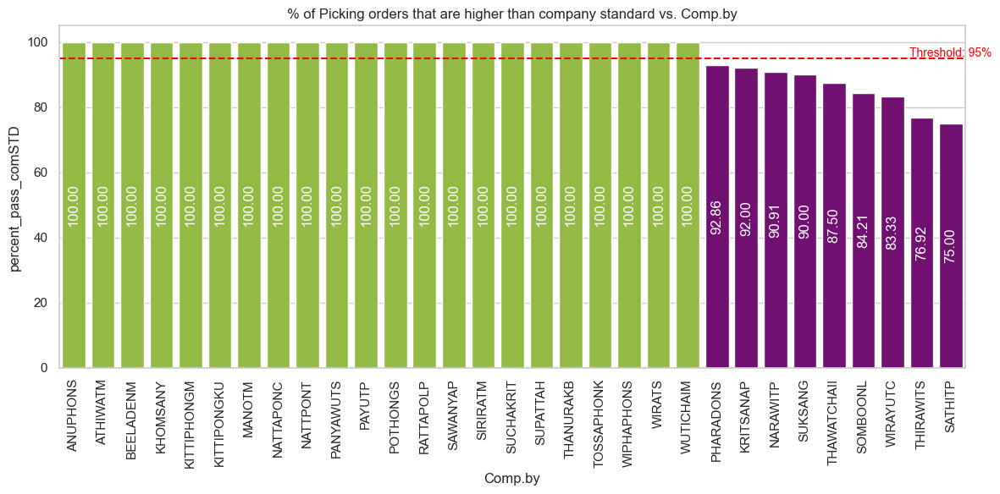

In [379]:
cut_off_type = 'company standard'
data = cut_picking_pivot_factor.sort_values(by=['percent_pass_comSTD', 'Comp.by'], ascending=[False, True])

# Set the style for the plot
sns.set(style="whitegrid")
bar_color = 'purple'

# Create a conditional color mapping function
def color_mapping(value):
    return 'yellowgreen' if value >= 95 else bar_color

# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
ax = sns.barplot(x='Comp.by', y='percent_pass_comSTD',
                 data=data,
                 palette=cut_picking_pivot_factor['percent_pass_comSTD'].apply(color_mapping)
                )

# Add a horizontal line at y=95
ax.axhline(y=95, color='red', linestyle='--') 
# Annotate the line with text
plt.text(len(cut_picking_pivot_factor) - 1, 95.5, 'Threshold: 95%', color='red', fontsize=10, ha='center')

# Add value labels at the center of the bars with a 90-degree rotation
for i, p in enumerate(ax.patches):
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height / 2, f'{height:.2f}', 
            ha='center', va='center',
            color='white',
            rotation=90)

plt.xlabel('Comp.by')
plt.ylabel('percent_pass_comSTD')
plt.title(f'% of {Activity} orders that are higher than {cut_off_type} vs. Comp.by')

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


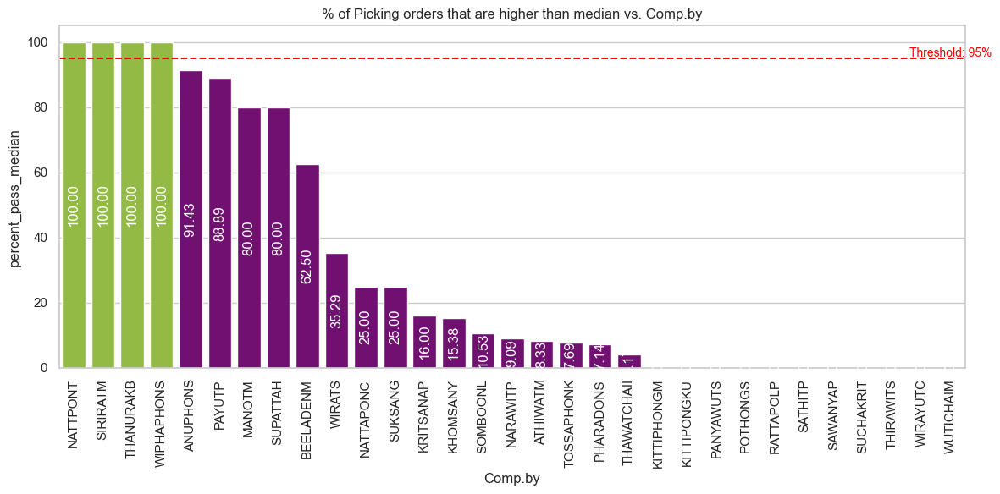

In [380]:
cut_off_type = 'median'
data = cut_picking_pivot_factor.sort_values(by=['percent_pass_median', 'Comp.by'], ascending=[False, True])

# Set the style for the plot
sns.set(style="whitegrid")
bar_color = 'purple'

# Create a conditional color mapping function
def color_mapping(value):
    return 'yellowgreen' if value >= 95 else bar_color

# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
ax = sns.barplot(x='Comp.by', y='percent_pass_median',
                 data=data,
                 palette=cut_picking_pivot_factor['percent_pass_median'].apply(color_mapping)
                )

# Add a horizontal line at y=95
ax.axhline(y=95, color='red', linestyle='--') 
# Annotate the line with text
plt.text(len(cut_picking_pivot_factor) - 1, 95.5, 'Threshold: 95%', color='red', fontsize=10, ha='center')

# Add value labels at the center of the bars with a 90-degree rotation
for i, p in enumerate(ax.patches):
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height / 2, f'{height:.2f}', 
            ha='center', va='center',
            color='white',
            rotation=90)

plt.xlabel('Comp.by')
plt.ylabel('percent_pass_median')
plt.title(f'% of {Activity} orders that are higher than {cut_off_type} vs. Comp.by')

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### Putaway

In [381]:
Activity = 'Putaway'

In [382]:
cut_putaway_pivot_factor= cut_putaway_2.pivot_table(
                    index=['Comp.by'],
                    #columns='Activity',
                    values=['TO Number.','higher_median_pallet/hr_factor','higher_company_std_pallet/hr_factor'],
                    aggfunc={'TO Number.': 'count', 
                             'higher_median_pallet/hr_factor': 'sum',
                             'higher_company_std_pallet/hr_factor': 'sum'}, 
                    #fill_value=0
                    )
cut_putaway_pivot_factor = cut_putaway_pivot_factor.reset_index()

cut_putaway_pivot_factor['percent_pass_comSTD'] = cut_putaway_pivot_factor['higher_company_std_pallet/hr_factor']/cut_putaway_pivot_factor['TO Number.']*100
cut_putaway_pivot_factor['95_pass_comSTD'] = np.where(cut_putaway_pivot_factor['percent_pass_comSTD'] >= 95, 1, 0)

cut_putaway_pivot_factor['percent_pass_median'] = cut_putaway_pivot_factor['higher_median_pallet/hr_factor']/cut_putaway_pivot_factor['TO Number.']*100
cut_putaway_pivot_factor['95_pass_median'] = np.where(cut_putaway_pivot_factor['percent_pass_median'] >= 95, 1, 0)


cut_putaway_pivot_factor = cut_putaway_pivot_factor.sort_values(by=['percent_pass_comSTD','percent_pass_median','Comp.by',], 
                                                  ascending=[False, False, True]
                                                  )
cut_putaway_pivot_factor.loc[:,['Comp.by','95_pass_comSTD','95_pass_median']]

,Comp.by,95_pass_comSTD,95_pass_median
1,ATHIWATM,1,1
7,NATTAPONC,1,1
3,KITTIPHONGM,1,0
5,KRITSANAP,1,0
11,POTHONGS,1,0
4,KITTIPONGKU,1,0
19,THANURAKB,1,0
23,WIRATS,1,0
13,SAWANYAP,1,0
6,NARAWITP,1,0


C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


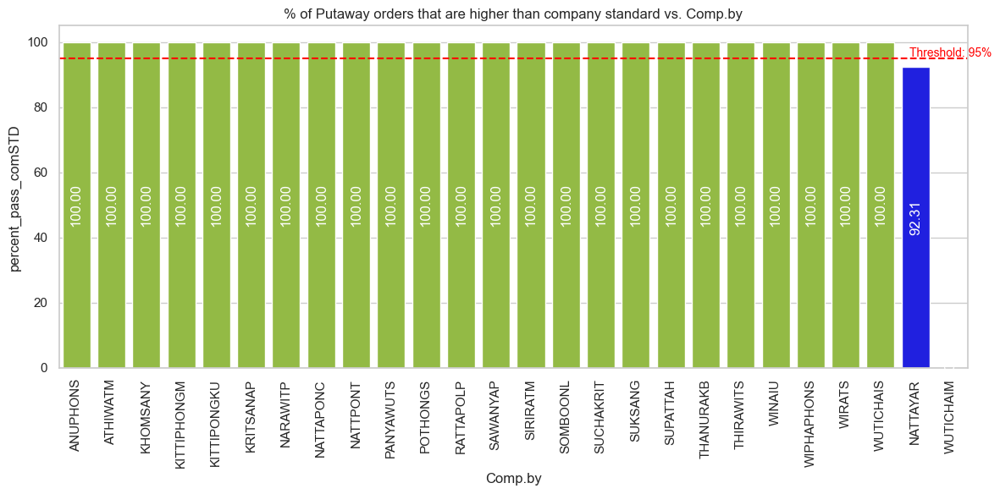

In [383]:
cut_off_type = 'company standard'
data = cut_putaway_pivot_factor.sort_values(by=['percent_pass_comSTD', 'Comp.by'], ascending=[False, True])

# Set the style for the plot
sns.set(style="whitegrid")
bar_color = 'blue'

# Create a conditional color mapping function
def color_mapping(value):
    return 'yellowgreen' if value >= 95 else bar_color

# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
ax = sns.barplot(x='Comp.by', y='percent_pass_comSTD',
                 data=data,
                 palette=cut_putaway_pivot_factor['percent_pass_comSTD'].apply(color_mapping)
                )

# Add a horizontal line at y=95
ax.axhline(y=95, color='red', linestyle='--') 
# Annotate the line with text
plt.text(len(cut_putaway_pivot_factor) - 1, 95.5, 'Threshold: 95%', color='red', fontsize=10, ha='center')

# Add value labels at the center of the bars with a 90-degree rotation
for i, p in enumerate(ax.patches):
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height / 2, f'{height:.2f}', 
            ha='center', va='center',
            color='white',
            rotation=90)

plt.xlabel('Comp.by')
plt.ylabel('percent_pass_comSTD')
plt.title(f'% of {Activity} orders that are higher than {cut_off_type} vs. Comp.by')

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


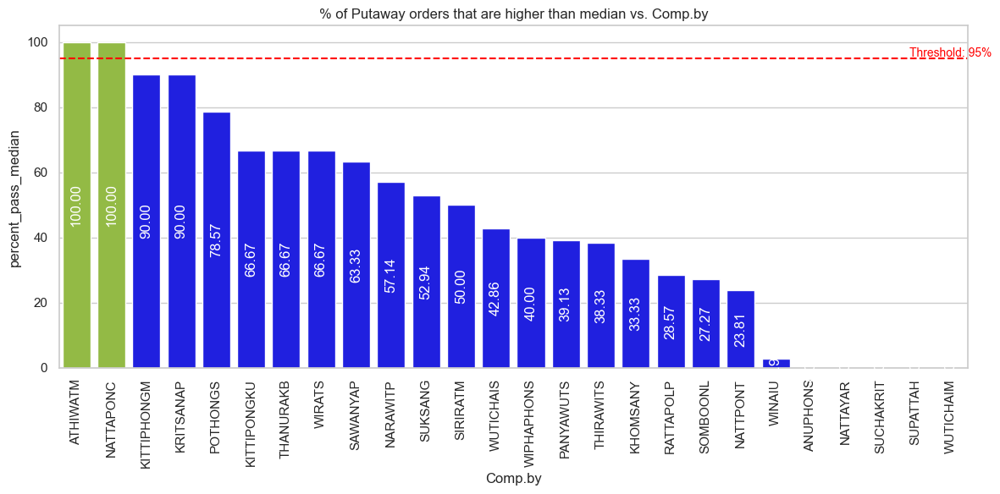

In [384]:
cut_off_type = 'median'
data = cut_putaway_pivot_factor.sort_values(by=['percent_pass_median', 'Comp.by'], ascending=[False, True])

# Set the style for the plot
sns.set(style="whitegrid")
bar_color = 'blue'

# Create a conditional color mapping function
def color_mapping(value):
    return 'yellowgreen' if value >= 95 else bar_color

# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
ax = sns.barplot(x='Comp.by', y='percent_pass_median',
                 data=data,
                 palette=cut_putaway_pivot_factor['percent_pass_median'].apply(color_mapping)
                )

# Add a horizontal line at y=95
ax.axhline(y=95, color='red', linestyle='--') 
# Annotate the line with text
plt.text(len(cut_putaway_pivot_factor) - 1, 95.5, 'Threshold: 95%', color='red', fontsize=10, ha='center')

# Add value labels at the center of the bars with a 90-degree rotation
for i, p in enumerate(ax.patches):
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height / 2, f'{height:.2f}', 
            ha='center', va='center',
            color='white',
            rotation=90)

plt.xlabel('Comp.by')
plt.ylabel('percent_pass_median')
plt.title(f'% of {Activity} orders that are higher than {cut_off_type} vs. Comp.by')

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### Replenishment

In [385]:
Activity = 'Replenishment'

In [386]:
cut_replenishment_pivot_factor= cut_replenishment_2.pivot_table(
                    index=['Comp.by'],
                    #columns='Activity',
                    values=['TO Number.','higher_median_pallet/hr_factor','higher_company_std_pallet/hr_factor'],
                    aggfunc={'TO Number.': 'count', 
                             'higher_median_pallet/hr_factor': 'sum',
                             'higher_company_std_pallet/hr_factor': 'sum'}, 
                    #fill_value=0
                    )
cut_replenishment_pivot_factor = cut_replenishment_pivot_factor.reset_index()

cut_replenishment_pivot_factor['percent_pass_comSTD'] = cut_replenishment_pivot_factor['higher_company_std_pallet/hr_factor']/cut_replenishment_pivot_factor['TO Number.']*100
cut_replenishment_pivot_factor['95_pass_comSTD'] = np.where(cut_replenishment_pivot_factor['percent_pass_comSTD'] >= 95, 1, 0)

cut_replenishment_pivot_factor['percent_pass_median'] = cut_replenishment_pivot_factor['higher_median_pallet/hr_factor']/cut_replenishment_pivot_factor['TO Number.']*100
cut_replenishment_pivot_factor['95_pass_median'] = np.where(cut_replenishment_pivot_factor['percent_pass_median'] >= 95, 1, 0)


cut_replenishment_pivot_factor = cut_replenishment_pivot_factor.sort_values(by=['percent_pass_comSTD','percent_pass_median','Comp.by',], 
                                                  ascending=[False, False, True]
                                                  )
cut_replenishment_pivot_factor.loc[:,['Comp.by','95_pass_comSTD','95_pass_median']]

,Comp.by,95_pass_comSTD,95_pass_median
21,SUPATTAH,1,1
22,THANURAKB,1,1
26,WINAIU,1,1
2,BEELADENM,1,0
4,KITTIPHONGM,1,0
28,WIRATS,1,0
27,WIPHAPHONS,1,0
5,KITTIPONGKU,1,0
10,NATTPONT,1,0
13,PHARADONS,1,0


C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


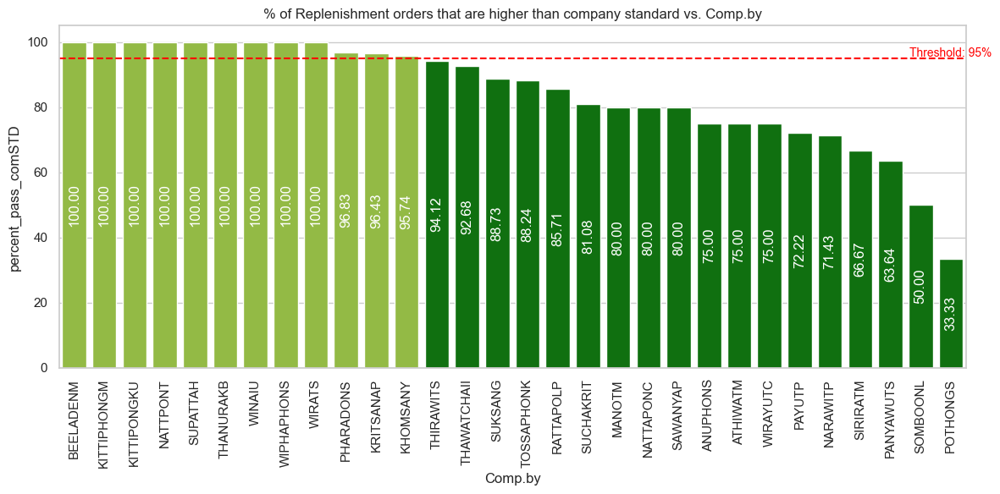

In [387]:
cut_off_type = 'company standard'
data = cut_replenishment_pivot_factor.sort_values(by=['percent_pass_comSTD', 'Comp.by'], ascending=[False, True])

# Set the style for the plot
sns.set(style="whitegrid")
bar_color = 'green'

# Create a conditional color mapping function
def color_mapping(value):
    return 'yellowgreen' if value >= 95 else bar_color

# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
ax = sns.barplot(x='Comp.by', y='percent_pass_comSTD',
                 data=data,
                 palette=cut_replenishment_pivot_factor['percent_pass_comSTD'].apply(color_mapping)
                )

# Add a horizontal line at y=95
ax.axhline(y=95, color='red', linestyle='--') 
# Annotate the line with text
plt.text(len(cut_replenishment_pivot_factor) - 1, 95.5, 'Threshold: 95%', color='red', fontsize=10, ha='center')

# Add value labels at the center of the bars with a 90-degree rotation
for i, p in enumerate(ax.patches):
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height / 2, f'{height:.2f}', 
            ha='center', va='center',
            color='white',
            rotation=90)

plt.xlabel('Comp.by')
plt.ylabel('percent_pass_comSTD')
plt.title(f'% of {Activity} orders that are higher than {cut_off_type} vs. Comp.by')

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Lenovo Legion\AppData\Roaming\Python\Python39\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


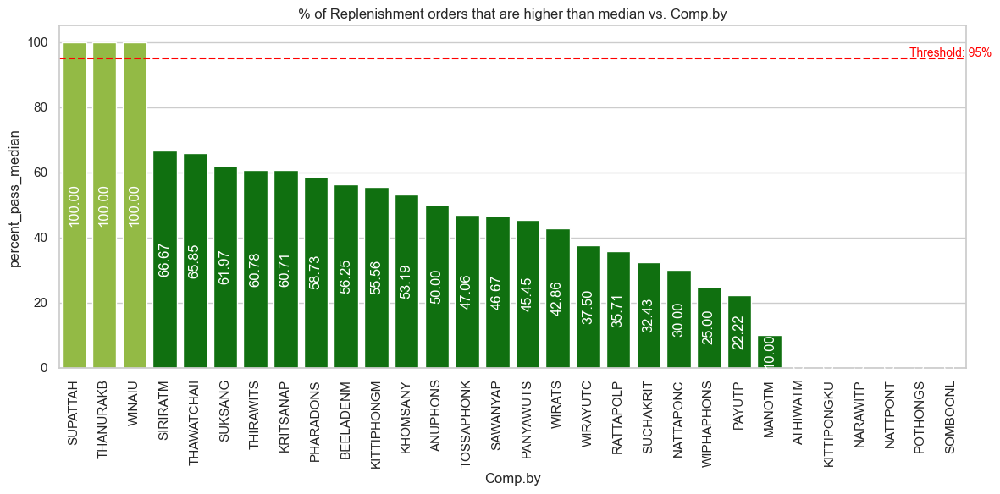

In [388]:
cut_off_type = 'median'
data = cut_replenishment_pivot_factor.sort_values(by=['percent_pass_median', 'Comp.by'], ascending=[False, True])

# Set the style for the plot
sns.set(style="whitegrid")
bar_color = 'green'

# Create a conditional color mapping function
def color_mapping(value):
    return 'yellowgreen' if value >= 95 else bar_color

# Create the bar plot using Seaborn
plt.figure(figsize=(12, 6))  # Set the figure size
ax = sns.barplot(x='Comp.by', y='percent_pass_median',
                 data=data,
                 palette=cut_replenishment_pivot_factor['percent_pass_median'].apply(color_mapping)
                )

# Add a horizontal line at y=95
ax.axhline(y=95, color='red', linestyle='--') 
# Annotate the line with text
plt.text(len(cut_replenishment_pivot_factor) - 1, 95.5, 'Threshold: 95%', color='red', fontsize=10, ha='center')

# Add value labels at the center of the bars with a 90-degree rotation
for i, p in enumerate(ax.patches):
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2, height / 2, f'{height:.2f}', 
            ha='center', va='center',
            color='white',
            rotation=90)

plt.xlabel('Comp.by')
plt.ylabel('percent_pass_median')
plt.title(f'% of {Activity} orders that are higher than {cut_off_type} vs. Comp.by')

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()